<a href="https://colab.research.google.com/github/RachelRamirez/CIFAR-10/blob/main/CollectionofTests/Test-3-Group-A.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports

In [45]:
#@title
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import copy
import os
import PIL
import PIL.Image
from tensorflow import keras 
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
# import keras.utils -- dont do this!! it causes problems, 
from tensorflow.keras.utils import to_categorical  #do this instead!!
import random
import sklearn
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
import time
import pickle
from google.colab import files
import datetime # to display the current time hh:mm:ss

tic = time.time()  # Start the timer
initial_run = 0

AUTOTUNE = tf.data.experimental.AUTOTUNE


### Set Random Seeds

In [46]:
#@title
##  Random Seed
seed = 42
random.seed(seed)
tf.random.set_seed(seed)
## ------------------

Set Logic-Values


In [47]:
#@title
run_model = False  #When Im looking at augmentations, I don't want to keep refitting a model, I want to just get the database of images loaded

Make Image Datasets

One of my biggest learning curves was learning how to load  the dataset with tdfs.load() and then filter on images by label.  

The second biggest was using the created model to make predictions on the test set.   

Current but "skipped" problem is trying to view misclassifeid images of results.


Another area of problems is rerunning when you've already specified a batch on your dataset creates another "batch" split so it can cause problems to rerun a cell that says how to define a dataset.  Unbatch may be needed first.    

In [48]:
#@title
dataset, info = tfds.load('cifar10', as_supervised=True, with_info=True)
x_test =  dataset["test"]
dataset  = dataset["train"]
assert isinstance(x_test, tf.data.Dataset)
#x_test = [(example.numpy(), label.numpy()) for example, label in x_test]
# once broken into numpy arrays, my model still doesn't handle it, it seems to be expecting a tensor
# So i think i have to break it into two tensors?  test_x, test_y?
# x_test[0][0]
# x_test[0][1]
# x_test = pd.DataFrame(x_test, columns=['example', 'label'])
# x_test = tf.data.Dataset.from_generator(lambda: x_test, (tf.int64, tf.int16))
# x_list = list(x_test.as_numpy_iterator())  # Crashes Google Colab!
# print(x_list[:5])


# believe I got this from stack-overflow.  Need this code to define y_test, the labels of testset

def get_labels_from_tfdataset(tfdataset, batched=False):
    labels = list(map(lambda x: x[1], tfdataset)) # Get labels 
    if not batched:
        return tf.concat(labels, axis=0) # concat the list of batched labels
    return labels
y_test = get_labels_from_tfdataset(x_test)


dataset_airplanes   = dataset.filter(lambda img, label: label == 0)
dataset_automobiles = dataset.filter(lambda img, label: label == 1)
dataset_birds       = dataset.filter(lambda img, label: label == 2)
dataset_cats        = dataset.filter(lambda img, label: label == 3)
dataset_deers       = dataset.filter(lambda img, label: label == 4)
dataset_dogs        = dataset.filter(lambda img, label: label == 5)
dataset_frogs       = dataset.filter(lambda img, label: label == 6)
dataset_horses      = dataset.filter(lambda img, label: label == 7)
dataset_ships       = dataset.filter(lambda img, label: label == 8)
dataset_trucks      = dataset.filter(lambda img, label: label == 9)

##  Ways to count the number of images in the sets:
print("There are ways to count and verify the number per training set which i have hidden because they are costly")
print("Entire Training Dataset was originally cardinality:", tf.data.experimental.cardinality(dataset).numpy()) #   prints 50,000, correct
print("Entire Airplane Training Dataset was originally cardinality:", tf.data.experimental.cardinality(dataset_airplanes).numpy()) #   prints -2 this is a "feature" in tf when a set takes too long to count
# print(dataset_airplanes.reduce(np.int64(0), lambda x,_ : x + 1).numpy()) #prints 5000, correct

##  This is a way of asserting that all the images have the same label in a set
# for img, label in dataset_dogs:
#   assert label == 5
 

There are ways to count and verify the number per training set which i have hidden because they are costly
Entire Training Dataset was originally cardinality: 50000
Entire Airplane Training Dataset was originally cardinality: -2


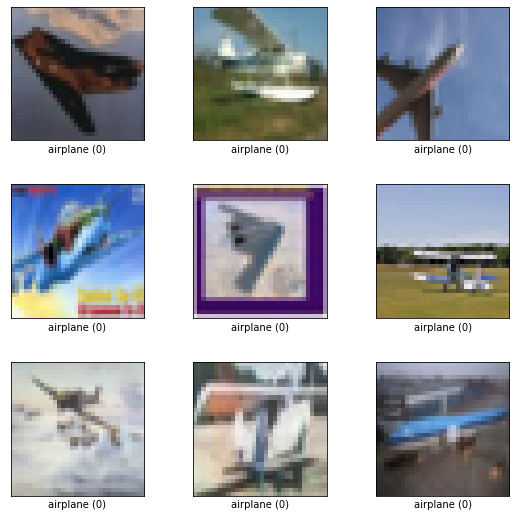

In [49]:
#@title
## Tfds.show_examples is a matplotlib funnction that only works on image ds's, and you have to pass it the "info" for some reason
fig = tfds.show_examples(dataset_airplanes, info)

How to display one picture of a dataset using `next(iter(dataset)`

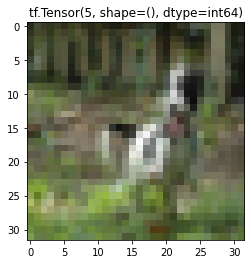

In [50]:
#@title
img, label = next(iter(dataset_dogs))

#print(img)
plt.title(str(label))
plt.imshow(img)

# Create validation set of 10,000 images

In [51]:
#@title
# I want 10 un replicated samples from dataset_airplanes + dataset_automobiles... dataset_trucks.

# There are 5000 images of each Class 
# I want 10 equal sets A, B, C, D, ... J plus a validation set
# I want 10,000 total images in the validation set with 1000 of each class
# and I want 10 sets of training images  4000 total images, so 400 images in each class

N = 1000
dataset_airplanes_val   = dataset_airplanes.take(N)
dataset_automobiles_val  = dataset_automobiles.take(N)
dataset_birds_val       = dataset_birds.take(N)  
dataset_cats_val        = dataset_cats.take(N)
dataset_deers_val       = dataset_deers.take(N)
dataset_dogs_val        = dataset_dogs.take(N)
dataset_frogs_val       = dataset_frogs.take(N)
dataset_horses_val      = dataset_horses.take(N)
dataset_ships_val       = dataset_ships.take(N)
dataset_trucks_val      = dataset_trucks.take(N)


# Make sure to skip the next 1000 images in each data set before making training set
dataset_airplanes   = dataset_airplanes.skip(N)
dataset_automobiles  = dataset_automobiles.skip(N)
dataset_birds      = dataset_birds.skip(N)  
dataset_cats        = dataset_cats.skip(N)
dataset_deers       = dataset_deers.skip(N)
dataset_dogs        = dataset_dogs.skip(N)
dataset_frogs       = dataset_frogs.skip(N)
dataset_horses      = dataset_horses.skip(N)
dataset_ships       = dataset_ships.skip(N)
dataset_trucks      = dataset_trucks.skip(N)

# # Check that remaining dataset does not have validation data
# fig = tfds.show_examples(dataset_ships, info)
# fig = tfds.show_examples(dataset_ships_val, info)
# # I checked and they dont.


# NOW, How do I combine my val sets?

# Hint1 its not this... 
# val = dataset_airplanes_val + dataset_automobile_val + dataset_birds_val

# #  Hint2 its also not this implementation of zip because the info file doesn't match it
# val = tf.data.Dataset.zip((dataset_airplanes_val,
#                     dataset_automobile_val,
#                     dataset_birds_val,
#                     dataset_cats_val,
#                     dataset_deers_val,
#                     dataset_dogs_val,
#                     dataset_frogs_val,
#                     dataset_horses_val,
#                     dataset_ships_val,
#                     dataset_trucks_val ))
 
# fig = tfds.show_examples(val, info)   # Returns a warning that the info file is not compatible


# is it concatenate? YESSSSSSSSSSSSSSSSSSSSSS
val = dataset_airplanes_val.concatenate(dataset_automobiles_val)
# This is how I checked that it worked
# fig = tfds.show_examples(val.skip(999), info)    # shows 1 airplane and then 8 automobiles

val = val.concatenate(dataset_birds_val)
val = val.concatenate(dataset_cats_val)
val = val.concatenate(dataset_deers_val)
val = val.concatenate(dataset_dogs_val)
val = val.concatenate(dataset_frogs_val)
val = val.concatenate(dataset_horses_val)
val = val.concatenate(dataset_ships_val)
val = val.concatenate(dataset_trucks_val)
  
# print(val.reduce(np.int32(0), lambda x,_ : x + 1))  # this shows 10000! Thank goodness! :-)



# Create 9 small groups of training_sets

After removing the 10,000 validation set from the training-data, the remaining set has 40,000 images, 4000 images of each class.  To create smaller training-datasets of similar sizes, shard the dataset into equal pieces.

For the initial days of testing I decided on **250 images** per class for my first couple runs, which equates to 16 shares (40,000/16 = 250) .  When I wanted to study what was going on more beneath the hood for my augmentations, I decided to make the training set even more tiny so I could view all the images per training set I decided to try 10 images per class so I could easily view all the images augmeted and not augmented.  This meant I needed **4000 shards!** for troubleshooting.



In [52]:
SHARDS=4000

#### Airplanes (airplanes_A, ... airplanes_P)

In [53]:
#@title
# https://www.tensorflow.org/api_docs/python/tf/data/Dataset#shard

# Check that each of the remaining 10 datasets has only 4000 images 
# print(dataset_airplanes.reduce(np.int32(0), lambda x,_ : x + 1))  # 4000 check!

# Shard each of the remaining 10 datasets into 16 smaller groups
airplanes_A = dataset_airplanes.shard(num_shards=SHARDS, index = 0)
airplanes_B = dataset_airplanes.shard(num_shards=SHARDS, index = 1)
airplanes_C = dataset_airplanes.shard(num_shards=SHARDS, index = 2)
airplanes_D = dataset_airplanes.shard(num_shards=SHARDS, index = 3)
airplanes_E = dataset_airplanes.shard(num_shards=SHARDS, index = 4)
airplanes_F = dataset_airplanes.shard(num_shards=SHARDS, index = 5)
airplanes_G = dataset_airplanes.shard(num_shards=SHARDS, index = 6)
airplanes_H = dataset_airplanes.shard(num_shards=SHARDS, index = 7)
airplanes_I = dataset_airplanes.shard(num_shards=SHARDS, index = 8)
airplanes_J = dataset_airplanes.shard(num_shards=SHARDS, index = 9)
airplanes_K = dataset_airplanes.shard(num_shards=SHARDS, index = 10)
airplanes_L = dataset_airplanes.shard(num_shards=SHARDS, index = 11)
airplanes_M = dataset_airplanes.shard(num_shards=SHARDS, index = 12)
airplanes_N = dataset_airplanes.shard(num_shards=SHARDS, index = 13)
airplanes_O = dataset_airplanes.shard(num_shards=SHARDS, index = 14)
airplanes_P = dataset_airplanes.shard(num_shards=SHARDS, index = 15)

#check that a random airplane dataset only has 250 images
# print(airplanes_M.reduce(np.int32(0), lambda x,_ : x + 1))  # 250 check!


#### Automobiles

In [54]:
#@title
# dataset_automobile

# Check that each of the remaining 10 datasets has only 4000 images 
# print(dataset_automobile.reduce(np.int32(0), lambda x,_ : x + 1))  # 4000 check!

# Shard each of the remaining 10 datasets into 16 smaller groups
automobiles_A = dataset_automobiles.shard(num_shards=SHARDS, index = 0)
automobiles_B = dataset_automobiles.shard(num_shards=SHARDS, index = 1)
automobiles_C = dataset_automobiles.shard(num_shards=SHARDS, index = 2)
automobiles_D = dataset_automobiles.shard(num_shards=SHARDS, index = 3)
automobiles_E = dataset_automobiles.shard(num_shards=SHARDS, index = 4)
automobiles_F = dataset_automobiles.shard(num_shards=SHARDS, index = 5)
automobiles_G = dataset_automobiles.shard(num_shards=SHARDS, index = 6)
automobiles_H = dataset_automobiles.shard(num_shards=SHARDS, index = 7)
automobiles_I = dataset_automobiles.shard(num_shards=SHARDS, index = 8)
automobiles_J = dataset_automobiles.shard(num_shards=SHARDS, index = 9)
automobiles_K = dataset_automobiles.shard(num_shards=SHARDS, index = 10)
automobiles_L = dataset_automobiles.shard(num_shards=SHARDS, index = 11)
automobiles_M = dataset_automobiles.shard(num_shards=SHARDS, index = 12)
automobiles_N = dataset_automobiles.shard(num_shards=SHARDS, index = 13)
automobiles_O = dataset_automobiles.shard(num_shards=SHARDS, index = 14)
automobiles_P = dataset_automobiles.shard(num_shards=SHARDS, index = 15)


#check that a random airplane dataset only has 250 images
# print(airplanes_H.reduce(np.int32(0), lambda x,_ : x + 1))  # 250 check!

#### Birds

In [55]:
#@title
# dataset_birds

# Shard each of the remaining 10 datasets into 16 smaller groups
birds_A = dataset_birds.shard(num_shards=SHARDS, index = 0)
birds_B = dataset_birds.shard(num_shards=SHARDS, index = 1)
birds_C = dataset_birds.shard(num_shards=SHARDS, index = 2)
birds_D = dataset_birds.shard(num_shards=SHARDS, index = 3)
birds_E = dataset_birds.shard(num_shards=SHARDS, index = 4)
birds_F = dataset_birds.shard(num_shards=SHARDS, index = 5)
birds_G = dataset_birds.shard(num_shards=SHARDS, index = 6)
birds_H = dataset_birds.shard(num_shards=SHARDS, index = 7)
birds_I = dataset_birds.shard(num_shards=SHARDS, index = 8)
birds_J = dataset_birds.shard(num_shards=SHARDS, index = 9)
birds_K = dataset_birds.shard(num_shards=SHARDS, index = 10)
birds_L = dataset_birds.shard(num_shards=SHARDS, index = 11)
birds_M = dataset_birds.shard(num_shards=SHARDS, index = 12)
birds_N = dataset_birds.shard(num_shards=SHARDS, index = 13)
birds_O = dataset_birds.shard(num_shards=SHARDS, index = 14)
birds_P = dataset_birds.shard(num_shards=SHARDS, index = 15)

#check that a random airplane dataset only has 250 images
# print(airplanes_H.reduce(np.int32(0), lambda x,_ : x + 1))  # 250 check!

#### Cats

In [56]:
#@title
# dataset_cats

# Shard each of the remaining 10 datasets into 16 smaller groups
cats_A = dataset_cats.shard(num_shards=SHARDS, index = 0)
cats_B = dataset_cats.shard(num_shards=SHARDS, index = 1)
cats_C = dataset_cats.shard(num_shards=SHARDS, index = 2)
cats_D = dataset_cats.shard(num_shards=SHARDS, index = 3)
cats_E = dataset_cats.shard(num_shards=SHARDS, index = 4)
cats_F = dataset_cats.shard(num_shards=SHARDS, index = 5)
cats_G = dataset_cats.shard(num_shards=SHARDS, index = 6)
cats_H = dataset_cats.shard(num_shards=SHARDS, index = 7)
cats_I = dataset_cats.shard(num_shards=SHARDS, index = 8)
cats_J = dataset_cats.shard(num_shards=SHARDS, index = 9)
cats_K = dataset_cats.shard(num_shards=SHARDS, index = 10)
cats_L = dataset_cats.shard(num_shards=SHARDS, index = 11)
cats_M = dataset_cats.shard(num_shards=SHARDS, index = 12)
cats_N = dataset_cats.shard(num_shards=SHARDS, index = 13)
cats_O = dataset_cats.shard(num_shards=SHARDS, index = 14)
cats_P = dataset_cats.shard(num_shards=SHARDS, index = 15)
#check that a random airplane dataset only has 250 images
# print(cats_P.reduce(np.int32(0), lambda x,_ : x + 1))  # 250 check!

#### Deer(s)

In [57]:
#@title
# dataset_deers
# Shard each of the remaining 10 datasets into 16 smaller groups
deers_A = dataset_deers.shard(num_shards=SHARDS, index = 0)
deers_B = dataset_deers.shard(num_shards=SHARDS, index = 1)
deers_C = dataset_deers.shard(num_shards=SHARDS, index = 2)
deers_D = dataset_deers.shard(num_shards=SHARDS, index = 3)
deers_E = dataset_deers.shard(num_shards=SHARDS, index = 4)
deers_F = dataset_deers.shard(num_shards=SHARDS, index = 5)
deers_G = dataset_deers.shard(num_shards=SHARDS, index = 6)
deers_H = dataset_deers.shard(num_shards=SHARDS, index = 7)
deers_I = dataset_deers.shard(num_shards=SHARDS, index = 8)
deers_J = dataset_deers.shard(num_shards=SHARDS, index = 9)
deers_K = dataset_deers.shard(num_shards=SHARDS, index = 10)
deers_L = dataset_deers.shard(num_shards=SHARDS, index = 11)
deers_M = dataset_deers.shard(num_shards=SHARDS, index = 12)
deers_N = dataset_deers.shard(num_shards=SHARDS, index = 13)
deers_O = dataset_deers.shard(num_shards=SHARDS, index = 14)
deers_P = dataset_deers.shard(num_shards=SHARDS, index = 15)
#check that a random airplane dataset only has 250 images
# print(deers_H.reduce(np.int32(0), lambda x,_ : x + 1))  # 250 check!

In [58]:
#@title


In [59]:
#@title


#### Dogs

In [60]:
#@title
# dataset_dogs
# Shard each of the remaining 10 datasets into 16 smaller groups
dogs_A = dataset_dogs.shard(num_shards=SHARDS, index = 0)
dogs_B = dataset_dogs.shard(num_shards=SHARDS, index = 1)
dogs_C = dataset_dogs.shard(num_shards=SHARDS, index = 2)
dogs_D = dataset_dogs.shard(num_shards=SHARDS, index = 3)
dogs_E = dataset_dogs.shard(num_shards=SHARDS, index = 4)
dogs_F = dataset_dogs.shard(num_shards=SHARDS, index = 5)
dogs_G = dataset_dogs.shard(num_shards=SHARDS, index = 6)
dogs_H = dataset_dogs.shard(num_shards=SHARDS, index = 7)
dogs_I = dataset_dogs.shard(num_shards=SHARDS, index = 8)
dogs_J = dataset_dogs.shard(num_shards=SHARDS, index = 9)
dogs_K = dataset_dogs.shard(num_shards=SHARDS, index = 10)
dogs_L = dataset_dogs.shard(num_shards=SHARDS, index = 11)
dogs_M = dataset_dogs.shard(num_shards=SHARDS, index = 12)
dogs_N = dataset_dogs.shard(num_shards=SHARDS, index = 13)
dogs_O = dataset_dogs.shard(num_shards=SHARDS, index = 14)
dogs_P = dataset_dogs.shard(num_shards=SHARDS, index = 15)

#check that a random airplane dataset only has 250 images
# print(dogs_H.reduce(np.int32(0), lambda x,_ : x + 1))  # 250 check!


#### Frogs

In [61]:
#@title
# dataset_frogs
# Shard each of the remaining 10 datasets into 16 smaller groups
frogs_A = dataset_frogs.shard(num_shards=SHARDS, index = 0)
frogs_B = dataset_frogs.shard(num_shards=SHARDS, index = 1)
frogs_C = dataset_frogs.shard(num_shards=SHARDS, index = 2)
frogs_D = dataset_frogs.shard(num_shards=SHARDS, index = 3)
frogs_E = dataset_frogs.shard(num_shards=SHARDS, index = 4)
frogs_F = dataset_frogs.shard(num_shards=SHARDS, index = 5)
frogs_G = dataset_frogs.shard(num_shards=SHARDS, index = 6)
frogs_H = dataset_frogs.shard(num_shards=SHARDS, index = 7)
frogs_I = dataset_frogs.shard(num_shards=SHARDS, index = 8)
frogs_J = dataset_frogs.shard(num_shards=SHARDS, index = 9)
frogs_K = dataset_frogs.shard(num_shards=SHARDS, index = 10)
frogs_L = dataset_frogs.shard(num_shards=SHARDS, index = 11)
frogs_M = dataset_frogs.shard(num_shards=SHARDS, index = 12)
frogs_N = dataset_frogs.shard(num_shards=SHARDS, index = 13)
frogs_O = dataset_frogs.shard(num_shards=SHARDS, index = 14)
frogs_P = dataset_frogs.shard(num_shards=SHARDS, index = 15)
#check that a random airplane dataset only has 250 images
# print(frogs_A.reduce(np.int32(0), lambda x,_ : x + 1))  # 250 check!

#### Horses

In [62]:
#@title
# dataset_horses
# Shard each of the remaining 10 datasets into 16 smaller groups
horses_A = dataset_horses.shard(num_shards=SHARDS, index = 0)
horses_B = dataset_horses.shard(num_shards=SHARDS, index = 1)
horses_C = dataset_horses.shard(num_shards=SHARDS, index = 2)
horses_D = dataset_horses.shard(num_shards=SHARDS, index = 3)
horses_E = dataset_horses.shard(num_shards=SHARDS, index = 4)
horses_F = dataset_horses.shard(num_shards=SHARDS, index = 5)
horses_G = dataset_horses.shard(num_shards=SHARDS, index = 6)
horses_H = dataset_horses.shard(num_shards=SHARDS, index = 7)
horses_I = dataset_horses.shard(num_shards=SHARDS, index = 8)
horses_J = dataset_horses.shard(num_shards=SHARDS, index = 9)
horses_K = dataset_horses.shard(num_shards=SHARDS, index = 10)
horses_L = dataset_horses.shard(num_shards=SHARDS, index = 11)
horses_M = dataset_horses.shard(num_shards=SHARDS, index = 12)
horses_N = dataset_horses.shard(num_shards=SHARDS, index = 13)
horses_O = dataset_horses.shard(num_shards=SHARDS, index = 14)
horses_P = dataset_horses.shard(num_shards=SHARDS, index = 15)
#check that a random airplane dataset only has 250 images
# print(horses_H.reduce(np.int32(0), lambda x,_ : x + 1))  # 250 check!

#### Ships

In [63]:
#@title
# dataset_ships
# Shard each of the remaining 10 datasets into 16 smaller groups
ships_A = dataset_ships.shard(num_shards=SHARDS, index = 0)
ships_B = dataset_ships.shard(num_shards=SHARDS, index = 1)
ships_C = dataset_ships.shard(num_shards=SHARDS, index = 2)
ships_D = dataset_ships.shard(num_shards=SHARDS, index = 3)
ships_E = dataset_ships.shard(num_shards=SHARDS, index = 4)
ships_F = dataset_ships.shard(num_shards=SHARDS, index = 5)
ships_G = dataset_ships.shard(num_shards=SHARDS, index = 6)
ships_H = dataset_ships.shard(num_shards=SHARDS, index = 7)
ships_I = dataset_ships.shard(num_shards=SHARDS, index = 8)
ships_J = dataset_ships.shard(num_shards=SHARDS, index = 9)
ships_K = dataset_ships.shard(num_shards=SHARDS, index = 10)
ships_L = dataset_ships.shard(num_shards=SHARDS, index = 11)
ships_M = dataset_ships.shard(num_shards=SHARDS, index = 12)
ships_N = dataset_ships.shard(num_shards=SHARDS, index = 13)
ships_O = dataset_ships.shard(num_shards=SHARDS, index = 14)
ships_P = dataset_ships.shard(num_shards=SHARDS, index = 15)
#check that a random airplane dataset only has 250 images
# print(ships_H.reduce(np.int32(0), lambda x,_ : x + 1))  # 250 check!

#### Trucks


In [64]:
#@title
# dataset_trucks
# Shard each of the remaining 10 datasets into 16 smaller groups
trucks_A = dataset_trucks.shard(num_shards=SHARDS, index = 0)
trucks_B = dataset_trucks.shard(num_shards=SHARDS, index = 1)
trucks_C = dataset_trucks.shard(num_shards=SHARDS, index = 2)
trucks_D = dataset_trucks.shard(num_shards=SHARDS, index = 3)
trucks_E = dataset_trucks.shard(num_shards=SHARDS, index = 4)
trucks_F = dataset_trucks.shard(num_shards=SHARDS, index = 5)
trucks_G = dataset_trucks.shard(num_shards=SHARDS, index = 6)
trucks_H = dataset_trucks.shard(num_shards=SHARDS, index = 7)
trucks_I = dataset_trucks.shard(num_shards=SHARDS, index = 8)
trucks_J = dataset_trucks.shard(num_shards=SHARDS, index = 9)
trucks_K = dataset_trucks.shard(num_shards=SHARDS, index = 10)
trucks_L = dataset_trucks.shard(num_shards=SHARDS, index = 11)
trucks_M = dataset_trucks.shard(num_shards=SHARDS, index = 12)
trucks_N = dataset_trucks.shard(num_shards=SHARDS, index = 13)
trucks_O = dataset_trucks.shard(num_shards=SHARDS, index = 14)
trucks_P = dataset_trucks.shard(num_shards=SHARDS, index = 15)


#check that a random airplane dataset only has 250 images
# print(trucks_H.reduce(np.int32(0), lambda x,_ : x + 1))  # 250 check!


# Merge 1/16th of each CIFAR Training Datasets into 16 Small training Groups {A}, {B}, {C} , ... {P}

#### Group A  (train_A)

In [65]:
#@title
# {A}
X = birds_A, cats_A, deers_A, dogs_A, frogs_A, horses_A, ships_A, trucks_A
train_A = airplanes_A.concatenate(automobiles_A)

for i in list(X):
  train_A = train_A.concatenate(i) 

print(train_A.reduce(np.int32(0), lambda x,_ : x + 1))  # 250*10 = 2500? 

tf.Tensor(10, shape=(), dtype=int32)


#### Group B

In [66]:
#@title
# {B}
X = birds_B, cats_B, deers_B, dogs_B, frogs_B, horses_B, ships_B, trucks_B
train_B = airplanes_B.concatenate(automobiles_B)

for i in list(X):
  train_B = train_B.concatenate(i)

# print(train_B.reduce(np.int32(0), lambda x,_ : x + 1))  # 250*10 = 2500? 

#### Group C

In [67]:
#@title
# {C}
X = birds_C, cats_C, deers_C, dogs_C, frogs_C, horses_C, ships_C, trucks_C
train_C = airplanes_C.concatenate(automobiles_C)

for i in list(X):
  train_C = train_C.concatenate(i)

# print(train_C.reduce(np.int32(0), lambda x,_ : x + 1))  # 250*10 = 2500? 

#### Group D

In [68]:
#@title
# {D}
X = birds_D, cats_D, deers_D, dogs_D, frogs_D, horses_D, ships_D, trucks_D
train_D = airplanes_D.concatenate(automobiles_D)

for i in list(X):
  train_D = train_D.concatenate(i)

# print(train_D.reduce(np.int32(0), lambda x,_ : x + 1))  # 250*10 = 2500? 

#### Group E

In [69]:
#@title
# {E}
X = birds_E, cats_E, deers_E, dogs_E, frogs_E, horses_E, ships_E, trucks_E
train_E = airplanes_E.concatenate(automobiles_E)

for i in list(X):
  train_E = train_E.concatenate(i)

# print(train_E.reduce(np.int32(0), lambda x,_ : x + 1))  # 250*10 = 2500? 

#### Group F

In [70]:
#@title
# {F}
X = birds_F, cats_F, deers_F, dogs_F, frogs_F, horses_F, ships_F, trucks_F
train_F = airplanes_F.concatenate(automobiles_F)

for i in list(X):
  train_F = train_F.concatenate(i)

# print(train_F.reduce(np.int32(0), lambda x,_ : x + 1))  # 250*10 = 2500? 

#### Group G

In [71]:
#@title
# {G}
X = birds_G, cats_G, deers_G, dogs_G, frogs_G, horses_G, ships_G, trucks_G
train_G = airplanes_G.concatenate(automobiles_G)

for i in list(X):
  train_G = train_G.concatenate(i)

# print(train_G.reduce(np.int32(0), lambda x,_ : x + 1))  # 250*10 = 2500? 

#### Group H

In [72]:
#@title
# {H}
X = birds_H, cats_H, deers_H, dogs_H, frogs_H, horses_H, ships_H, trucks_H
train_H = airplanes_H.concatenate(automobiles_H)

for i in list(X):
  train_H = train_H.concatenate(i)

# print(train_H.reduce(np.int32(0), lambda x,_ : x + 1))  # 250*10 = 2500? 

#### Group I

In [73]:
#@title
# {I}
X = birds_I, cats_I, deers_I, dogs_I, frogs_I, horses_I, ships_I, trucks_I
train_I = airplanes_I.concatenate(automobiles_I)

for i in list(X):
  train_I = train_I.concatenate(i)

# print(train_I.reduce(np.int32(0), lambda x,_ : x + 1))  # 250*10 = 2500? 

#### Group J

In [74]:
#@title
# {J}
X = birds_J, cats_J, deers_J, dogs_J, frogs_J, horses_J, ships_J, trucks_J
train_J = airplanes_J.concatenate(automobiles_J)

for i in list(X):
  train_J = train_J.concatenate(i)

# print(train_J.reduce(np.int32(0), lambda x,_ : x + 1))  # 250*10 = 2500? 

### Adding Batches, Buffers, Shuffles and Caches

The following is necessary to run the datasets through the models.  Do not run the following more than once because it'll try to make an additional "batch" dimension in your datasets

In [75]:
#@title
if initial_run == 0: 
    
  # AUTOTUNE = tf.data.AUTOTUNE # results in -1 which i think is code for the whole database
  train_A = train_A.cache().prefetch(buffer_size=AUTOTUNE)
  train_A = train_A.shuffle(2500, reshuffle_each_iteration=True, seed=seed)
  train_A = train_A.batch(100)  # I believe its good to not have a remainder to cut ds evenly but I'm not sure

  val = val.cache().prefetch(buffer_size=AUTOTUNE)
  val = val.batch(100)

  x_test = x_test.cache().prefetch(AUTOTUNE)
  x_test = x_test.batch(500)

else:
  pass

initial_run = initial_run+1

#### Time required to create datasets:  

In [76]:
#@title
toc = time.time()  
print(f"Made datasets in {toc - tic:0.4f} seconds")
!mkdir -p saved_model


Made datasets in 32.7013 seconds


# Train CNN on Training_Group_A

Train a vanilla CNN using small group A train set, the val set, and test

In [77]:
#@title
def get_min_max(tfdata, text):
  print(str(text), "is ", tfdata)
  image, _ = next(iter(tfdata))
  print("test")
  print(np.min(image[0]), np.max(image[0]), "\n")


get_min_max(train_A, "train_A")
get_min_max(x_test, "x_test")
get_min_max(val, "val")



train_A is  <BatchDataset shapes: ((None, 32, 32, 3), (None,)), types: (tf.uint8, tf.int64)>
test
6 255 

x_test is  <BatchDataset shapes: ((None, 32, 32, 3), (None,)), types: (tf.uint8, tf.int64)>
test
5 255 

val is  <BatchDataset shapes: ((None, 32, 32, 3), (None,)), types: (tf.uint8, tf.int64)>
test
12 225 



## Train the model function :


In [78]:
#@title
# Make a Vanilla CNN

def makemodel(DROPOUT):  #returns model
  num_classes = 10
  input_shape = (32, 32, 3)

  # For Reference these are the defaults
  # kernel_initializer="glorot_uniform",
  # bias_initializer="zeros",
  # padding="valid",  #valid = no padding
  # kernel_regularizer=None,
  # bias_regularizer=None,
  # activity_regularizer=None,

  initializer = tf.keras.initializers.HeUniform(seed)  #this alows the model to start from the same weights each time

  model = tf.keras.Sequential(
  [
      #keras.Input(),
      tf.keras.Input(shape=input_shape),

      layers.experimental.preprocessing.Rescaling(1./255),
      #data_augmentation,   
      layers.Conv2D(32, kernel_size=(3, 3), activation="relu", kernel_initializer=initializer, name="ConvLayer1"),
      layers.MaxPooling2D(pool_size=(2, 2), name="MaxPool1"),
      layers.BatchNormalization(name="BN1"),
   
      layers.Conv2D(64, kernel_size=(3, 3), activation="relu", kernel_initializer=initializer, name="ConvLayer2"),
      layers.MaxPooling2D(pool_size=(2, 2), name="MaxPool2"),
      layers.BatchNormalization(name="BN2"),
   
      layers.Conv2D(128, kernel_size=(3, 3), activation="relu", kernel_initializer=initializer, name="ConvLayer3"),
      layers.MaxPooling2D(pool_size=(2, 2), name="MaxPool3"),
      layers.BatchNormalization(name="BN3"),
   
      layers.Flatten(),
      layers.Dropout(DROPOUT),
      layers.Dense(512, activation="relu", kernel_initializer=initializer),
      layers.Dropout(DROPOUT),
      layers.Dense(num_classes, activation="softmax")

  ])


  model.compile(
    optimizer='adam',
    loss=tf.losses.SparseCategoricalCrossentropy(),
    metrics=['accuracy'])  #changed, added to val_accuracy

  print("Dropout is: ", DROPOUT)
  model.save_weights('saved_model/blank_model')
  model.load_weights('saved_model/blank_model')

  return model

# -----------------------------------------

# I need to understand tf.function better 
# @tf.function

def trainmodel(MODEL, TRAININGDATA):   # returns TRAINEDMODEL

  history = MODEL.fit(
    TRAININGDATA,
    validation_data=(val),
    epochs=100,
    callbacks = keras.callbacks.EarlyStopping(monitor= 'val_loss', patience=15, restore_best_weights=True), 
    verbose=1 #I want to see how many batches are used for each epoch or "steps per epoch"
  )

  #I've entered show pot-loss twice to force another plot to move down  
  # summarize history for loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper left')
  plt.show()

  # summarize history for loss
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper left')
  plt.show()
  
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.title('model accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper left')
  plt.show()
  # model.save('saved_model/my_model')

  val_acc_array = history.history['val_accuracy']
  val_loss_array = history.history['val_loss']

  n_epochs_best = np.argmax(val_acc_array)
  n_epochs_bestloss = np.argmin(val_loss_array)

  print("Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes")

  print("Early Stop Epoch: ", n_epochs_best, " when Val Acc was: ", np.max(val_acc_array))
  print("Epoch when val-loss was min: ", n_epochs_bestloss, " Val Loss was: ", np.min(val_loss_array))
  return MODEL



# Transition to Augmentations


In [79]:
#@title
import time
start_augmentations = time.time()

## Prepare the Google Colab environment for Albumentations



#### Install the latest version of Albumentations

Google Colab has an outdated version of Albumentations so we will install the latest stable version from PyPi.

In [80]:
#@title
# !pip install -q -U albumentations
# !echo "$(pip freeze | grep albumentations) is successfully installed"

!pip install -U git+https://github.com/albumentations-team/albumentations -q
# necessary imports
from functools import partial
import albumentations as A
import cv2 as cv2

import tensorflow as tf
AUTOTUNE = tf.data.experimental.AUTOTUNE


## Define Augmentation Factors' Order and Levels

The following are 21 factors: 20 data-augmentation techniques and one regularization factor "*Dropout*" Percent Level, to compare with.  The order is what seemed to give each factor the most opportunity to add to the image, and more "destructive" factors were ordered later, like "ToGray" and Crop or ZoomIn since they take away image data permanently.  Zoom Out was order 11 because I wanted to make sure noise, blur, zoom, sharpen, contrast, did not have a over-magnified effect if after ZoomOut.  FlipHorizontal and FlipVertical are at the bottom not because they are destructive, but because I wanted to keep the categorical variables grouped as much as possible for consistent coding practices.

|Order | Factors | Role | Low | High |
| -: | :- | :-: | :-: | :-: |
1|*dropout*|Continuous|0.4  |0.6
2|shiftX|Continuous|0 | 0.1
3|shiftY|Continuous|0|  0.1
4|noise|Continuous|0  |24
5|blur|Continuous|0 | 7**
6|sharpen|Continuous|0 | 0.1
7|contrast|Continuous|0 | 0.2
8|brighten|Continuous|0|  0.2
9|darken (negative brightness)|Continuous|0 | -0.2 *
10|gamma|Continuous|100|  120
11|zoomOut (negative zoomin) |Continuous| 0 | -0.16*
12|rotate|Continuous|0|  14
13|crop|Continuous|32* | 24*
14|zoomin|Continuous|0  |0.16
15|flipH|Categorical|0 | 1
16|flipV|Categorical|0 | 1
17|fancyPCA|Categorical|0 | 1
18|equalize|Categorical|0 | 1
19|channelShuffle|Categorical|0 | 1
20|elasticTransform|Categorical|0 | 1
21|togray|Categorical|0 | 1

* Values with asterisks are for emphasis since they seem counterintuitive

** Blur values can only be odd so a center point will be rounded down from 3.5 to 3 - four center points were changed

A 50-run definitive screening design with 2 blocks is used to see which main effects are most important.  The JMP Metrics for this design are below:

 | Definitive Screening Design Diagnostics  | | 
| --- | --- | 
 | D Efficiency| 92.46019| 
| G Efficiency | 81.68744 | 
| A Efficiency | 91.32396 | 
| Average Variance of Prediction	 | 0.298038 |


## Define Randomized Definitive Screening Design 

**Block 1**
 
 xRun|Block|dropout|shiftX|shiftY|noise|blur|sharpen|contrast|brighten|darken|gamma|zoomOut|rotate|crop|zoomin|flipH|flipV|fancyPCA|equalize|channelShuffle|elasticTransform|togray
:-| :-| :-| :-| :-| :-| :-| :-| :-| :-| :-| :-| :-| :-| :-| :-| :-| :-| :-| :-| :-| :-| :-
1|1|0.4|0.1|0|24|7|0.1|0.2|0.2|-0.2|100|-0.08|14|24|0.16|1|1|0|1|0|1|0
2|1|0.4|0.1|0|24|7|0|0|0|0|100|-0.16|0|32|0|1|1|1|1|1|1|0
3|1|0.5|0|0|24|7|0.1|0|0.2|-0.2|100|-0.16|14|32|0.16|0|0|0|0|1|0|1
4|1|0.4|0|0.1|24|3|0.1|0|0|-0.2|100|0|0|32|0|1|1|0|0|0|1|1
5|1|0.6|0|0|0|0|0|0.2|0.2|-0.2|100|0|0|32|0.16|1|1|1|0|1|0|0
6|1|0.6|0.1|0|24|0|0.1|0.2|0|-0.2|120|-0.16|0|24|0.08|1|0|1|0|0|1|1
7|1|0.4|0|0|0|7|0|0.2|0.2|0|120|0|7|24|0|0|1|0|0|0|1|1
8|1|0.4|0.1|0.1|0|0|0.1|0.2|0.2|-0.2|100|0|0|32|0|0|0|1|1|1|1|1
9|1|0.6|0|0|24|7|0|0|0|0|120|-0.16|14|24|0.16|1|1|0|0|0|0|0
10|1|0.5|0.05|0.05|12|3|0.05|0.1|0.1|-0.1|110|-0.08|7|28|0.08|0|0|0|0|0|0|0
11|1|0.4|0|0|24|7|0.1|0.2|0.1|-0.2|120|0|0|24|0|0|0|1|1|1|0|0
12|1|0.4|0.1|0.1|24|0|0|0.2|0.2|-0.2|120|-0.16|0|32|0.16|0|1|0|1|0|0|0
13|1|0.6|0|0|0|7|0.1|0|0|0|100|0|14|24|0|1|0|1|0|1|1|1
14|1|0.6|0.05|0.1|24|7|0.1|0.2|0.2|0|120|0|14|32|0.16|1|1|1|1|1|1|1
15|1|0.4|0|0|0|7|0|0|0.2|-0.2|120|-0.16|0|32|0.16|1|0|1|1|0|1|1
16|1|0.4|0.05|0|0|0|0|0|0|-0.2|100|-0.16|0|24|0|0|0|0|0|0|0|0
17|1|0.4|0.1|0.1|24|7|0.1|0|0|0|120|-0.16|14|24|0|0|0|0|1|0|1|1
18|1|0.6|0.1|0.1|24|0|0.1|0|0|-0.2|100|-0.16|7|32|0.16|1|0|1|1|1|0|0
19|1|0.6|0|0.1|0|0|0|0|0|0|120|-0.08|0|32|0|0|0|1|0|1|0|1
20|1|0.6|0|0.1|0|0|0.1|0.2|0.2|-0.2|120|0|14|24|0.16|0|0|0|0|0|0|1
21|1|0.6|0.1|0.1|0|0|0|0|0.1|0|100|-0.16|14|32|0.16|1|1|0|0|0|1|1
22|1|0.5|0.05|0.05|12|3|0.05|0.1|0.1|-0.1|110|-0.08|7|28|0.08|1|1|1|1|1|1|1
23|1|0.6|0.1|0.1|24|0|0.1|0.2|0|0|100|0|14|24|0|0|1|0|0|1|0|0
24|1|0.6|0.1|0|0|3|0|0.2|0.2|0|120|-0.16|14|24|0.16|0|0|1|1|1|0|0
25|1|0.5|0.1|0.1|0|0|0|0.2|0|0|120|0|0|24|0|1|1|1|1|0|1|0
26|1|0.4|0|0.1|0|7|0|0|0.2|0|100|0|14|32|0.08|0|1|0|1|1|0|0


**Block 2**

xRun|Block|dropout|shiftX|shiftY|noise|blur|sharpen|contrast|brighten|darken|gamma|zoomOut|rotate|crop|zoomin|flipH|flipV|fancyPCA|equalize|channelShuffle|elasticTransform|togray
:-| :-| :-| :-| :-| :-| :-| :-| :-| :-| :-| :-| :-| :-| :-| :-| :-| :-| :-| :-| :-| :-| :-
27|2|0.6|0.1|0|12|6|0.1|0.2|0.2|0|100|-0.16|0|32|0|0|1|1|0|0|0|1
28|2|0.6|0.1|0|0|6|0|0.2|0|-0.2|100|0|14|32|0|1|0|0|1|0|0|1
29|2|0.4|0|0|24|0|0.05|0.2|0|0|100|0|14|32|0.16|0|0|1|0|0|1|0
30|2|0.6|0.1|0|24|0|0|0|0.2|0|100|0|0|24|0.16|0|0|0|1|1|1|1
31|2|0.6|0|0.1|24|6|0|0.2|0.2|-0.1|100|-0.16|0|24|0|1|0|0|0|1|1|0
32|2|0.6|0|0.1|24|6|0|0.1|0|-0.2|100|0|0|24|0.16|0|1|1|1|0|0|1
33|2|0.4|0.1|0.1|0|6|0|0.2|0|-0.2|100|-0.16|14|24|0.16|0|1|1|0|1|1|1
34|2|0.4|0|0.1|0|6|0.1|0.2|0|-0.2|120|-0.16|14|32|0|1|1|1|0|0|0|0
35|2|0.4|0.1|0.05|24|6|0|0.2|0|0|120|0|0|32|0.16|1|0|0|0|1|0|1
36|2|0.6|0|0|24|0|0.1|0|0.2|0|120|0|0|32|0|1|0|0|1|0|0|0
37|2|0.6|0.1|0.1|24|6|0|0|0.2|-0.2|120|0|14|32|0|0|0|1|0|0|1|0
38|2|0.6|0|0.1|0|6|0.1|0.2|0|0|110|-0.16|0|32|0.16|0|0|0|1|0|1|0
39|2|0.6|0|0.05|0|0|0.1|0|0.2|-0.2|100|-0.16|14|24|0|0|1|1|1|0|1|0
40|2|0.4|0|0.1|12|0|0|0|0|-0.2|120|0|14|24|0.16|1|0|0|1|1|1|0
41|2|0.6|0.1|0.1|0|6|0.05|0|0.2|-0.2|120|-0.16|0|24|0|1|1|0|1|1|0|1
42|2|0.4|0|0.1|24|0|0.1|0|0.2|0|120|-0.16|0|24|0.16|0|1|1|0|1|1|0
43|2|0.4|0.1|0|0|0|0.1|0.1|0.2|0|120|-0.16|14|32|0|1|0|0|0|1|1|0
44|2|0.4|0|0|0|0|0.1|0.2|0|0|100|-0.16|0|24|0.16|1|1|0|1|1|0|1
45|2|0.4|0.1|0|0|0|0.1|0|0|-0.1|120|0|14|32|0.16|0|1|1|1|0|0|1
46|2|0.4|0.1|0.1|0|6|0.1|0|0.2|0|100|0|0|24|0.16|1|0|1|0|0|0|0
47|2|0.4|0|0.1|24|0|0|0.2|0.2|0|100|-0.16|14|28|0|1|0|1|1|0|0|1
48|2|0.4|0.1|0|24|0|0|0|0.2|-0.2|110|0|14|24|0|1|1|1|0|1|0|1
49|2|0.6|0.1|0|0|6|0.1|0|0|-0.2|120|0|0|28|0.16|0|1|0|0|1|1|0
50|2|0.6|0|0|24|0|0|0.2|0|-0.2|120|-0.16|14|32|0|0|1|0|1|1|1|1

## Create Experimental Run Order DataFrame

In [81]:
ls_all_factors = ['xRun', 'Block', 'dropout', 'shiftX', 'shiftY', 'noise', 'blur', 'sharpen', 'contrast', 'brighten', 'darken', 'gamma', 'zoomOut', 'rotate', 'crop', 'zoomin', 'flipH', 'flipV', 'fancyPCA', 'equalize', 'channelShuffle', 'elasticTransform', 'togray']

df_experimentalruns = pd.DataFrame(	[
[1, 1, 0.6, 0, 0, 24, 7, 0, 0, 0, 0.2, 120, 0, 14, 0, 0.16, 1, 1, 0, 0, 0, 0, 0],
[2, 1, 0.6, 0.1, 0, 0, 3, 0, 0.2, 0.2, 0.2, 120, 0, 14, 0, 0.16, 0, 0, 1, 1, 1, 0, 0],
[3, 1, 0.4, 0.1, 0.1, 0, 0, 0.1, 0.2, 0.2, 0, 100, 0.16, 0, 8, 0, 0, 0, 1, 1, 1, 1, 1],
[4, 1, 0.5, 0.05, 0.05, 12, 3, 0.05, 0.1, 0.1, 0.1, 110, 0.08, 7, 4, 0.08, 1, 1, 1, 1, 1, 1, 1],
[5, 1, 0.4, 0, 0.1, 0, 7, 0, 0, 0.2, 0.2, 100, 0.16, 14, 8, 0.08, 0, 1, 0, 1, 1, 0, 0],
[6, 1, 0.4, 0.1, 0.1, 24, 7, 0.1, 0, 0, 0.2, 120, 0, 14, 0, 0, 0, 0, 0, 1, 0, 1, 1],
[7, 1, 0.6, 0.1, 0.1, 24, 0, 0.1, 0, 0, 0, 100, 0, 7, 8, 0.16, 1, 0, 1, 1, 1, 0, 0],
[8, 1, 0.4, 0.1, 0, 24, 7, 0, 0, 0, 0.2, 100, 0, 0, 8, 0, 1, 1, 1, 1, 1, 1, 0],
[9, 1, 0.5, 0.05, 0.05, 12, 3, 0.05, 0.1, 0.1, 0.1, 110, 0.08, 7, 4, 0.08, 0, 0, 0, 0, 0, 0, 0],
[10, 1, 0.5, 0, 0, 24, 7, 0.1, 0, 0.2, 0, 100, 0, 14, 8, 0.16, 0, 0, 0, 0, 1, 0, 1],
[11, 1, 0.6, 0, 0, 0, 7, 0.1, 0, 0, 0.2, 100, 0.16, 14, 0, 0, 1, 0, 1, 0, 1, 1, 1],
[12, 1, 0.4, 0.1, 0, 24, 7, 0.1, 0.2, 0.2, 0, 100, 0.08, 14, 0, 0.16, 1, 1, 0, 1, 0, 1, 0],
[13, 1, 0.6, 0, 0.1, 0, 0, 0, 0, 0, 0.2, 120, 0.08, 0, 8, 0, 0, 0, 1, 0, 1, 0, 1],
[14, 1, 0.4, 0.05, 0, 0, 0, 0, 0, 0, 0, 100, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
[15, 1, 0.6, 0.05, 0.1, 24, 7, 0.1, 0.2, 0.2, 0.2, 120, 0.16, 14, 8, 0.16, 1, 1, 1, 1, 1, 1, 1],
[16, 1, 0.4, 0, 0.1, 24, 3, 0.1, 0, 0, 0, 100, 0.16, 0, 8, 0, 1, 1, 0, 0, 0, 1, 1],
[17, 1, 0.6, 0.1, 0.1, 24, 0, 0.1, 0.2, 0, 0.2, 100, 0.16, 14, 0, 0, 0, 1, 0, 0, 1, 0, 0],
[18, 1, 0.4, 0, 0, 24, 7, 0.1, 0.2, 0.1, 0, 120, 0.16, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0],
[19, 1, 0.6, 0, 0.1, 0, 0, 0.1, 0.2, 0.2, 0, 120, 0.16, 14, 0, 0.16, 0, 0, 0, 0, 0, 0, 1],
[20, 1, 0.6, 0, 0, 0, 0, 0, 0.2, 0.2, 0, 100, 0.16, 0, 8, 0.16, 1, 1, 1, 0, 1, 0, 0],
[21, 1, 0.6, 0.1, 0.1, 0, 0, 0, 0, 0.1, 0.2, 100, 0, 14, 8, 0.16, 1, 1, 0, 0, 0, 1, 1],
[22, 1, 0.4, 0, 0, 0, 7, 0, 0, 0.2, 0, 120, 0, 0, 8, 0.16, 1, 0, 1, 1, 0, 1, 1],
[23, 1, 0.6, 0.1, 0, 24, 0, 0.1, 0.2, 0, 0, 120, 0, 0, 0, 0.08, 1, 0, 1, 0, 0, 1, 1],
[24, 1, 0.4, 0, 0, 0, 7, 0, 0.2, 0.2, 0.2, 120, 0.16, 7, 0, 0, 0, 1, 0, 0, 0, 1, 1],
[25, 1, 0.5, 0.1, 0.1, 0, 0, 0, 0.2, 0, 0.2, 120, 0.16, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0],
[26, 1, 0.4, 0.1, 0.1, 24, 0, 0, 0.2, 0.2, 0, 120, 0, 0, 8, 0.16, 0, 1, 0, 1, 0, 0, 0],
[27, 2, 0.6, 0, 0.1, 24, 7, 0, 0.1, 0, 0, 100, 0.16, 0, 0, 0.16, 0, 1, 1, 1, 0, 0, 1],
[28, 2, 0.6, 0.1, 0, 0, 7, 0.1, 0, 0, 0, 120, 0.16, 0, 4, 0.16, 0, 1, 0, 0, 1, 1, 0],
[29, 2, 0.4, 0, 0.1, 24, 0, 0.1, 0, 0.2, 0.2, 120, 0, 0, 0, 0.16, 0, 1, 1, 0, 1, 1, 0],
[30, 2, 0.4, 0, 0, 24, 0, 0.05, 0.2, 0, 0.2, 100, 0.16, 14, 8, 0.16, 0, 0, 1, 0, 0, 1, 0],
[31, 2, 0.6, 0.1, 0.1, 24, 7, 0, 0, 0.2, 0, 120, 0.16, 14, 8, 0, 0, 0, 1, 0, 0, 1, 0],
[32, 2, 0.4, 0.1, 0, 0, 0, 0.1, 0, 0, 0.1, 120, 0.16, 14, 8, 0.16, 0, 1, 1, 1, 0, 0, 1],
[33, 2, 0.6, 0, 0, 24, 0, 0, 0.2, 0, 0, 120, 0, 14, 8, 0, 0, 1, 0, 1, 1, 1, 1],
[34, 2, 0.6, 0, 0, 24, 0, 0.1, 0, 0.2, 0.2, 120, 0.16, 0, 8, 0, 1, 0, 0, 1, 0, 0, 0],
[35, 2, 0.4, 0, 0.1, 12, 0, 0, 0, 0, 0, 120, 0.16, 14, 0, 0.16, 1, 0, 0, 1, 1, 1, 0],
[36, 2, 0.4, 0.1, 0, 0, 0, 0.1, 0.1, 0.2, 0.2, 120, 0, 14, 8, 0, 1, 0, 0, 0, 1, 1, 0],
[37, 2, 0.6, 0.1, 0.1, 0, 7, 0.05, 0, 0.2, 0, 120, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1],
[38, 2, 0.6, 0, 0.1, 24, 7, 0, 0.2, 0.2, 0.1, 100, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0],
[39, 2, 0.4, 0, 0.1, 0, 7, 0.1, 0.2, 0, 0, 120, 0, 14, 8, 0, 1, 1, 1, 0, 0, 0, 0],
[40, 2, 0.4, 0, 0.1, 24, 0, 0, 0.2, 0.2, 0.2, 100, 0, 14, 4, 0, 1, 0, 1, 1, 0, 0, 1],
[41, 2, 0.6, 0.1, 0, 0, 7, 0, 0.2, 0, 0, 100, 0.16, 14, 8, 0, 1, 0, 0, 1, 0, 0, 1],
[42, 2, 0.4, 0.1, 0.1, 0, 7, 0.1, 0, 0.2, 0.2, 100, 0.16, 0, 0, 0.16, 1, 0, 1, 0, 0, 0, 0],
[43, 2, 0.4, 0.1, 0.1, 0, 7, 0, 0.2, 0, 0, 100, 0, 14, 0, 0.16, 0, 1, 1, 0, 1, 1, 1],
[44, 2, 0.4, 0.1, 0, 24, 0, 0, 0, 0.2, 0, 110, 0.16, 14, 0, 0, 1, 1, 1, 0, 1, 0, 1],
[45, 2, 0.4, 0, 0, 0, 0, 0.1, 0.2, 0, 0.2, 100, 0, 0, 0, 0.16, 1, 1, 0, 1, 1, 0, 1],
[46, 2, 0.6, 0.1, 0, 24, 0, 0, 0, 0.2, 0.2, 100, 0.16, 0, 0, 0.16, 0, 0, 0, 1, 1, 1, 1],
[47, 2, 0.4, 0.1, 0.05, 24, 7, 0, 0.2, 0, 0.2, 120, 0.16, 0, 8, 0.16, 1, 0, 0, 0, 1, 0, 1],
[48, 2, 0.6, 0, 0.1, 0, 7, 0.1, 0.2, 0, 0.2, 110, 0, 0, 8, 0.16, 0, 0, 0, 1, 0, 1, 0],
[49, 2, 0.6, 0.1, 0, 12, 7, 0.1, 0.2, 0.2, 0.2, 100, 0, 0, 8, 0, 0, 1, 1, 0, 0, 0, 1],
[50, 2, 0.6, 0, 0.05, 0, 0, 0.1, 0, 0.2, 0, 100, 0, 14, 0, 0, 0, 1, 1, 1, 0, 1, 0]
],

index=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50], 
columns = ls_all_factors)
	
# I had to make some changes to shift x and y values

df_experimentalruns.loc[df_experimentalruns["shiftX"]==0.1,"shiftX"] = 0.125  #this is 4/32
df_experimentalruns.loc[df_experimentalruns["shiftX"]==0.05,"shiftX"] = 0.0625  #this is 2/32
df_experimentalruns["shiftX"]

df_experimentalruns.loc[df_experimentalruns["shiftY"]==0.1,"shiftY"] = 0.125  #this is 4/32
df_experimentalruns.loc[df_experimentalruns["shiftY"]==0.05,"shiftY"] = 0.0625  #this is 2/32  

#  Sigh of RELIEF.  Changing the percentage to "divisible" values of 32 made it so that theres no blur happening in the pictures, yay! 

## View images from the dataset function (view_image(ds))

********************            Training Data            ********************
********************            Validation Data            ********************
********************            Test Data            ********************


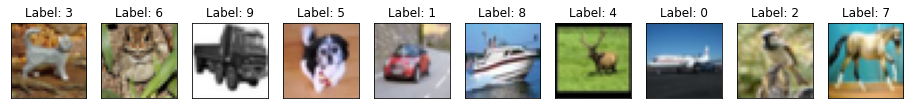

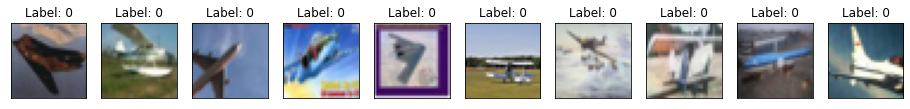

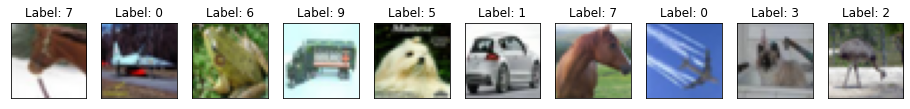

In [82]:
#@title
def view_image(ds):
    image, label = next(iter(ds)) # extract 1 batch from the dataset
    image = image.numpy().astype("uint8")  #??  #if theres a better way to do this I'm all ears because it's costly
    label = label.numpy()   
    
  
    fig = plt.figure(figsize=(16, 16))
    for i in range(10):
        ax = fig.add_subplot(1, 10, i+1, xticks=[], yticks=[])
        ax.imshow(image[i])
        ax.set_title(f"Label: {label[i]}")
        


print("*"*20, " "*10, "Training Data", " "*10,  "*"*20, )
view_image(train_A)

print("*"*20, " "*10, "Validation Data", " "*10,  "*"*20, )
view_image(val)

print("*"*20, " "*10, "Test Data", " "*10,  "*"*20, )
view_image(x_test)


To integrate `albumentations` into our tensorflow pipeline we can create two functions :  
- Pipeline to apply `augmentation`.
- a function that calls the above function and pass in our data through the pipeline.
We can then wrap our 2nd Function under `tf.numpy_function` .

### Define Albumentations "Transform" Augmentation Functions (transforms = Compose([ ... ])   ) 

In [83]:
#@title
IMG_SIZE = 32

def augmentfunction(df_experimentalruns, run):
    
  # Instantiate augments

  cat_probability = 1
  cont_probability = 1
  random.seed(42)

  # Assign Continuous Factors Levels by Run -------------------------

  shift_limit_x_left =  df_experimentalruns.loc[run,"shiftX"]
  shift_limit_x_right = df_experimentalruns.loc[run,"shiftX"]  
  assert shift_limit_x_right >= shift_limit_x_left
  assert shift_limit_x_right <= 1  #more than one is damaging
  print("Shift X: (", shift_limit_x_left, ",", shift_limit_x_right, ") or (",-shift_limit_x_right, ",", -shift_limit_x_left, ")" )

  shift_limit_y_left = df_experimentalruns.loc[run,"shiftY"]
  shift_limit_y_right = df_experimentalruns.loc[run,"shiftY"]  
  assert shift_limit_y_right >= shift_limit_y_left
  assert shift_limit_y_right < 1  #more than one is damaging
  print("Shift Y: (", shift_limit_y_left, ",", shift_limit_y_right, ")or (", -shift_limit_y_right, ",", -shift_limit_y_left, ")")


  gamma_left =  df_experimentalruns.loc[run,"gamma"]     
  gamma_right = df_experimentalruns.loc[run,"gamma"]  
  assert gamma_right >= gamma_left
  print("Gamma: (", gamma_left, ",", gamma_right, ")")

  zoom_out_left = -df_experimentalruns.loc[run,"zoomOut"]  
  zoom_out_right = -df_experimentalruns.loc[run,"zoomOut"] 
  assert zoom_out_right >= zoom_out_left
  print("ZoomOut: (", zoom_out_left, ",", zoom_out_right, ")")


  zoom_in_left = df_experimentalruns.loc[run,"zoomin"]
  zoom_in_right = df_experimentalruns.loc[run,"zoomin"]
  assert zoom_in_right >= zoom_in_left
  assert zoom_in_right < 1.0
  print("ZoomIn: (", zoom_in_left, ",", zoom_in_right, ")")



  noise_left = df_experimentalruns.loc[run,"noise"]             # df_factors["Noise"][df_experimentalruns.loc[run,"Noise"]])
  noise_right = df_experimentalruns.loc[run,"noise"]         #  need to change noise to larger number
  assert noise_right >= noise_left
  print("Noise: (", noise_left, ",", noise_right, ")")


  ## Is blur of 7 too high? :-\ 
  if df_experimentalruns.loc[run,"blur"] == 0:
    blur_probability = 0
    # print("blur is 0")
    blur_left = 0
    blur_right = 0+1
  else:
    # print("blur is not 0")
    blur_probability = 1
    blur_left = df_experimentalruns.loc[run,"blur"]
    blur_right = df_experimentalruns.loc[run,"blur"]
  assert blur_right >= blur_left
  assert blur_right > 0  # must be an integer  #I can't see a dfference using 7 and 9!
  print("blur: (", blur_left, ",", blur_right, ")")


  # Need to add Sharp to the menu of options
  sharp_left = df_experimentalruns.loc[run,"sharpen"]
  sharp_right = df_experimentalruns.loc[run,"sharpen"]
  assert sharp_right >= sharp_left
  print("sharp: (", sharp_left, ",", sharp_right, ")")


  contrast_limit_left = df_experimentalruns.loc[run,"contrast"]
  contrast_limit_right = df_experimentalruns.loc[run,"contrast"]
  assert contrast_limit_right >= contrast_limit_left
  print("Contrast: (", contrast_limit_left, ",", contrast_limit_right, ")")


  brightness_limit_left = df_experimentalruns.loc[run,"brighten"]
  brightness_limit_right = df_experimentalruns.loc[run,"brighten"] 
  assert brightness_limit_right >= brightness_limit_left
  print("Bright: (", brightness_limit_left, ",", brightness_limit_right, ")")

  darkness_limit_left = -df_experimentalruns.loc[run,"darken"] 
  darkness_limit_right = -df_experimentalruns.loc[run,"darken"]
  assert darkness_limit_right >= darkness_limit_left
  print("Darken: (", darkness_limit_left, ",", darkness_limit_right, ")")


  rotate_left  = df_experimentalruns.loc[run,"rotate"]
  rotate_right = df_experimentalruns.loc[run,"rotate"]
  assert rotate_right >= rotate_left
  print("Rotate: (", rotate_left, ",", rotate_right, ") or (",-rotate_right, ",", -rotate_left, ")" )


  crop_value = 32-df_experimentalruns.loc[run,"crop"]


  # Assign Categorical Factors Probabilities to make "on" or "off" -------------------------
  pHorizontalFlip =   df_experimentalruns.loc[run,"flipH"]
  print("pHorizontalFlip: ", pHorizontalFlip)

  pVerticalFlip =     df_experimentalruns.loc[run,"flipV"]
  print("pVerticalFlip: ", pVerticalFlip)

  pEqualize =          df_experimentalruns.loc[run,"equalize"]
  print("pEqualize: ", pEqualize)

  pFancyPCA =          df_experimentalruns.loc[run,"fancyPCA"]
  print("pFancyPCA: ", pFancyPCA)

  pChannelShuffle =   df_experimentalruns.loc[run,"channelShuffle"]
  print("pChannelShuffle: ", pChannelShuffle)

  pElasticTransform =  df_experimentalruns.loc[run,"elasticTransform"]
  print("pElasticTransform: ", pElasticTransform)

  pToGray =            df_experimentalruns.loc[run,"togray"]
  print("pToGray: ", pToGray)

  background_value = 0

   
  #transforms = A.Compose([
  list_of_transforms = [


      #1. Shift Horizontally Right or Shift Horizontally Left
      A.OneOf([
                A.geometric.ShiftScaleRotate(rotate_limit=0, shift_limit_y=0, 
                                                  shift_limit_x=(shift_limit_x_left,shift_limit_x_right), 
                                                  scale_limit=0, border_mode=cv2.BORDER_CONSTANT, value=background_value),    
                A.geometric.ShiftScaleRotate(rotate_limit=0, shift_limit_y=0, 
                                                  shift_limit_x=(-shift_limit_x_right,-shift_limit_x_left), 
                                                  scale_limit=0, border_mode=cv2.BORDER_CONSTANT, value=background_value)], 
              p=cont_probability),
      
      
      # 2 Shift VERTICALLY  up or down 
      A.OneOf([
                A.geometric.ShiftScaleRotate(rotate_limit=0, shift_limit_y=(shift_limit_y_left,shift_limit_y_right), shift_limit_x=0, scale_limit=0, border_mode=cv2.BORDER_CONSTANT, value=background_value),   
                A.geometric.ShiftScaleRotate(rotate_limit=0, shift_limit_y=(-shift_limit_y_right, -shift_limit_y_left), shift_limit_x=0, scale_limit=0, border_mode=cv2.BORDER_CONSTANT, value=background_value)], 
              p =cont_probability),
      
      #3 NOISE ---------------------------------
      A.transforms.GaussNoise(var_limit=(noise_left,noise_right), p=cont_probability),  

      #4 BLUR
      A.transforms.GaussianBlur(blur_limit=(blur_left,blur_right), sigma_limit=(0.5,0.05), p=blur_probability),  #Blur
      
      #5 Sharpen 
      A.transforms.Sharpen(alpha=(sharp_left,sharp_right), lightness=(0.0, 0.0), p=cont_probability),  #AntiBlur keep lightness constant at 0?
        
      #6 Contrast
      A.transforms.RandomBrightnessContrast(brightness_limit=(0,0), contrast_limit=(contrast_limit_left,contrast_limit_right), p=cont_probability),       

      #7 Brightness
      A.transforms.RandomBrightnessContrast(brightness_limit=(brightness_limit_left,brightness_limit_right), contrast_limit=(0,0), p=cont_probability),      
      
      #8 Darkness
      A.transforms.RandomBrightnessContrast(brightness_limit=(darkness_limit_left,darkness_limit_right), contrast_limit=(0,0), p=cont_probability),  #darkness

      #9 GAMMA
      # A.transforms.RandomGamma(gamma_limit=(gamma_left,gamma_right), p=cont_probability),  
      

      #10 Zoom Out
      A.geometric.ShiftScaleRotate(rotate_limit=0,  shift_limit_y=0, shift_limit_x=0, scale_limit=(zoom_out_left,zoom_out_right), border_mode=cv2.BORDER_CONSTANT, value=background_value, p=cont_probability),    #Zoom Out safe: scale_limit=(-0.15,-0.1)

      #11  Rotate CW or CCW
      A.OneOf([
                    A.geometric.SafeRotate(limit=(rotate_left,rotate_right), border_mode=cv2.BORDER_CONSTANT, value=background_value),
                    A.geometric.SafeRotate(limit=(-rotate_right,-rotate_left), border_mode=cv2.BORDER_CONSTANT, value=background_value)], p=1),
      
      #12  Crop then Pad
      A.crops.transforms.CenterCrop(height=crop_value, width=crop_value,  p=cont_probability),       # Crop 24,24 is the extreme
      A.transforms.PadIfNeeded(min_height=32, min_width=32,  border_mode=cv2.BORDER_CONSTANT, value=background_value, p=1),

      # 13 ZoomIn
      A.geometric.ShiftScaleRotate(rotate_limit=0, shift_limit_y=0, shift_limit_x=0,
                                    scale_limit=(zoom_in_left,zoom_in_right), border_mode=cv2.BORDER_CONSTANT, value=background_value, p=cont_probability),  

      # 14 FlipH
      A.HorizontalFlip(p=pHorizontalFlip),
      
      # 15 FlipVert
      A.VerticalFlip(p=pVerticalFlip),
      
      #16 FANCY PCA
      A.transforms.FancyPCA(alpha=0.1, p=pFancyPCA),                    # FancyPCA Amount to perturn eigenvalues not Categorical
      
      #17 Elastic Transform
      A.geometric.ElasticTransform(alpha=0.1, sigma=0.001, alpha_affine=0.001, 
                                    same_dxdy=True, border_mode=cv2.BORDER_CONSTANT, 
                                    value=background_value, p=pElasticTransform),    #Seems more like a blur than a transform?
      
      # #Resize to 32x32 for crop
      # A.geometric.Resize(height=32, width=32, p=1),

      #18 Histogram Equalizer
      A.transforms.Equalize(p=pEqualize),  

      #19 CHANNELSHUFFLE
      A.transforms.ChannelShuffle(p=pChannelShuffle),  #this is prob going to ruin accuracy


      #20 Turn Everything Gray
      A.transforms.ToGray(p=pToGray)

    ] 
    
  return list_of_transforms



no_transforms = A.Compose([
         A.transforms.NoOp()
])

### Define another function "Augment_Function" to push images throguh list of "Transforms" to create augmented images

In [84]:
#@title
def aug_fn(image, img_size):
    data = {"image":image}
    aug_data = transforms(**data)
    aug_img = aug_data["image"]
    # aug_img = tf.cast(aug_img/255.0, tf.float32)
    # aug_img = tf.cast(aug_img/1.0, tf.float32)    #attempt
    aug_img = tf.image.resize(aug_img, size=[img_size, img_size])
    # aug_img = tf.cast(aug_img*255.0, tf.float32)
    return aug_img

def no_aug_fn(image, img_size):
    data = {"image":image}
    aug_data = no_transforms(**data)
    aug_img = aug_data["image"]
    # aug_img = tf.cast(img/255.0, tf.float32)  
    # aug_img = tf.cast(img/1.0, tf.float32)      #new attempt
    aug_img = tf.image.resize(aug_img, size=[img_size, img_size])
    # aug_img = tf.cast(aug_img*255.0, tf.float32)
    return aug_img

#### Define Process_Data function to returns augmented image andlabel

In [85]:
#@title
def process_data(image, label, img_size):
    aug_img = tf.numpy_function(func=aug_fn, inp=[image, img_size], Tout=tf.float32)  # was tf.float32
    return aug_img, label


def no_process_data(image, label, img_size):
    no_aug_img = tf.numpy_function(func=no_aug_fn, inp=[image, img_size], Tout=tf.float32)   # was tf.float32
    return no_aug_img, label
    

#### Restoring dataset shapes. 
The datasets loses its shape after applying a tf.numpy_function, so this is necessary for the sequential model and when inheriting from the model class.

In [86]:
#@title
def set_shapes(img, label, img_shape=(IMG_SIZE,IMG_SIZE,3)):
    img.set_shape(img_shape)
    label.set_shape([])
    return img, label

`Note`: 
Some `API's` of `tensorflow.keras.Model` might not work, if you dont map the dataset with the set_shapes function.

## Create New Training Group Data by Merging Un-Augmented with Augmented Data


In [87]:
#@title
unbatch_train_A = (tf.data.Dataset.unbatch(train_A))


def augment_data(dataset, process,dataset_text):
  dataset_new = dataset.map(partial(process, img_size=IMG_SIZE))
  dataset_new = dataset_new.map(set_shapes)
  # dataset_new = dataset_new.batch(batchsize)
  # print(str(dataset_text)+" created, through " + str(process))
  # get_min_max(dataset,      text= dataset_text)
  # get_min_max(dataset_new,  text=str("new" + dataset_text))
  return dataset_new

train_A_noalb = augment_data(dataset = unbatch_train_A, 
                             process= no_process_data,
                            #  batchsize=100,
                             dataset_text = "train_A_noalb")

# view_image(train_A_noalb) 

num_noalb_per_batch = train_A_noalb.reduce(np.int64(0), lambda x,_ : x + 1).numpy()  # returns 25, but 25*100batches = 2500
print("\n There are ** ", num_noalb_per_batch, "**  images in Train_A_NoAlb before batching \n" )
 
#troubleshooting baad accuracy\
# tfds.as_dataframe(train_A_noalb.take(1), info)  #why on earth does this take so long??  #Apparently Integers
# tfds.as_dataframe(train_A_noalb.take(1), info)



 There are **  10 **  images in Train_A_NoAlb before batching 



In [88]:
def show_confusion_matrix(test_labels, predictions, CLASSES):
    """Compute confusion matrix and normalize."""
    confusion = sklearn.metrics.confusion_matrix(test_labels, predictions,  labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
    
    confusing_part_matrix= np.array(confusion)-np.identity(confusion.shape[0])*np.diag(confusion)
  
    axis_labels = CLASSES

    ax = sns.heatmap(
        confusing_part_matrix, xticklabels=axis_labels, yticklabels=axis_labels,
        cmap='Blues', annot=True, square=True, fmt='.0f')

    plt.title("Confusion matrix without Diagonal")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")


## Run, Model, Test, Capture all 50 Designed Runs

Run:  1
Dropout is:  0.6
Shift X: ( 0.0 , 0.0 ) or ( -0.0 , -0.0 )
Shift Y: ( 0.0 , 0.0 )or ( -0.0 , -0.0 )
Gamma: ( 120 , 120 )
ZoomOut: ( -0.0 , -0.0 )
ZoomIn: ( 0.16 , 0.16 )
Noise: ( 24 , 24 )
blur: ( 7 , 7 )
sharp: ( 0.0 , 0.0 )
Contrast: ( 0.0 , 0.0 )
Bright: ( 0.0 , 0.0 )
Darken: ( -0.2 , -0.2 )
Rotate: ( 14 , 14 ) or ( -14 , -14 )
pHorizontalFlip:  1
pVerticalFlip:  1
pEqualize:  0
pFancyPCA:  0
pChannelShuffle:  0
pElasticTransform:  0
pToGray:  0
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 6s 6s/step - loss: 6.0383 - accuracy: 0.0000e+00 - val_loss: 2.8803 - val_accuracy: 0.0967
Epoch 2/100
1/1 [==============================] - 0s 401ms/step - loss: 5.2274 - accuracy: 0.1500 - val_loss: 2.8819 - val_accuracy: 0.0975
Epoch 3/100
1/1 [==============================] - 0s 452ms/step - loss: 4.2155 - accuracy: 0.2000 - val_loss: 2.8295 - val_accuracy: 0.0988
Epoch 4/100
1/1 [====================

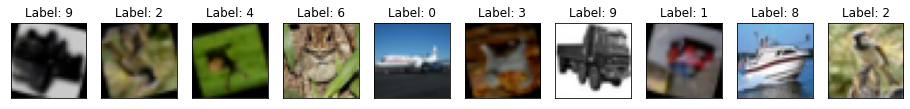

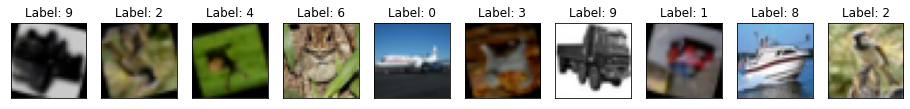

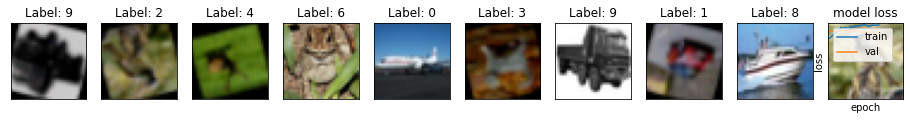

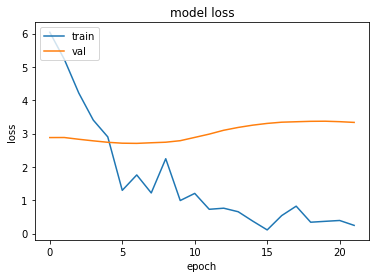

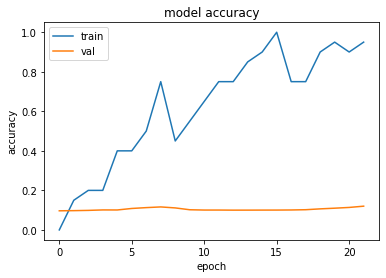

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  21  when Val Acc was:  0.1200999990105629
Epoch when val-loss was min:  6  Val Loss was:  2.7063112258911133
TestLoss:  2.712120532989502  TestAcc: 0.11180000007152557
Run:  2
Dropout is:  0.6
Shift X: ( 0.125 , 0.125 ) or ( -0.125 , -0.125 )
Shift Y: ( 0.0 , 0.0 )or ( -0.0 , -0.0 )
Gamma: ( 120 , 120 )
ZoomOut: ( -0.0 , -0.0 )
ZoomIn: ( 0.16 , 0.16 )
Noise: ( 0 , 0 )
blur: ( 3 , 3 )
sharp: ( 0.0 , 0.0 )
Contrast: ( 0.2 , 0.2 )
Bright: ( 0.2 , 0.2 )
Darken: ( -0.2 , -0.2 )
Rotate: ( 14 , 14 ) or ( -14 , -14 )
pHorizontalFlip:  0
pVerticalFlip:  0
pEqualize:  1
pFancyPCA:  1
pChannelShuffle:  1
pElasticTransform:  0
pToGray:  0
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 1s 1s/step - loss: 5.2750 - accuracy: 0.0500 - val_loss: 2.8981 - val_accuracy: 0.1022
Epoch 2/100
1/1 [==============================

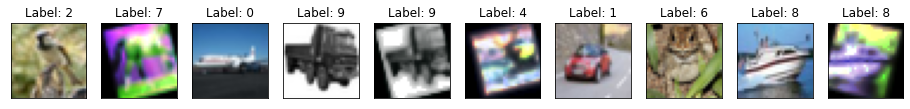

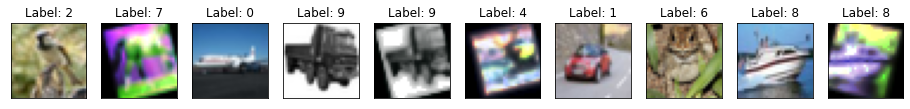

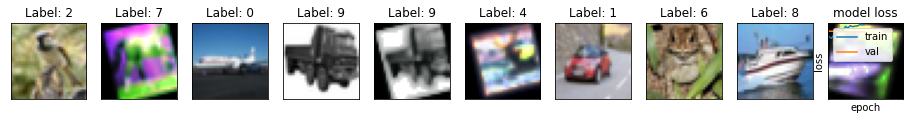

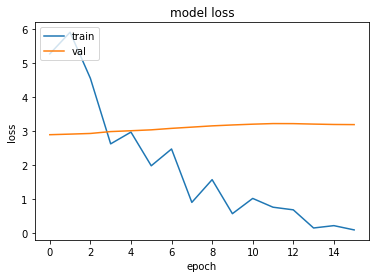

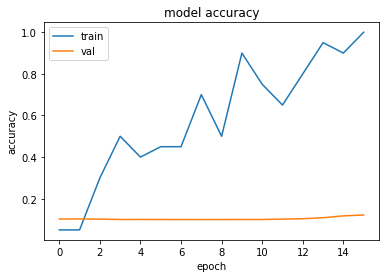

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  15  when Val Acc was:  0.1216999962925911
Epoch when val-loss was min:  0  Val Loss was:  2.8980824947357178
TestLoss:  2.910391330718994  TestAcc: 0.10130000114440918
Run:  3
Dropout is:  0.4
Shift X: ( 0.125 , 0.125 ) or ( -0.125 , -0.125 )
Shift Y: ( 0.125 , 0.125 )or ( -0.125 , -0.125 )
Gamma: ( 100 , 100 )
ZoomOut: ( -0.16 , -0.16 )
ZoomIn: ( 0.0 , 0.0 )
Noise: ( 0 , 0 )
blur: ( 0 , 1 )
sharp: ( 0.1 , 0.1 )
Contrast: ( 0.2 , 0.2 )
Bright: ( 0.2 , 0.2 )
Darken: ( -0.0 , -0.0 )
Rotate: ( 0 , 0 ) or ( 0 , 0 )
pHorizontalFlip:  0
pVerticalFlip:  0
pEqualize:  1
pFancyPCA:  1
pChannelShuffle:  1
pElasticTransform:  1
pToGray:  1
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 1s 1s/step - loss: 4.9100 - accuracy: 0.0500 - val_loss: 2.8070 - val_accuracy: 0.0997
Epoch 2/100
1/1 [============================

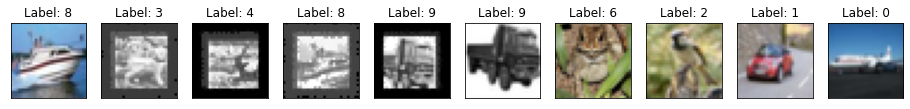

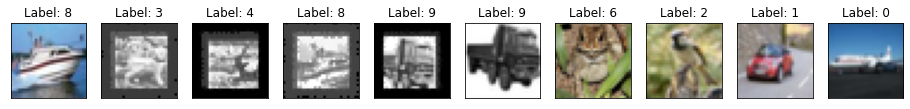

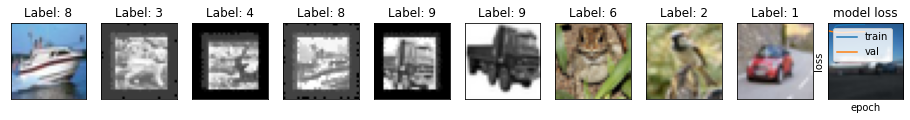

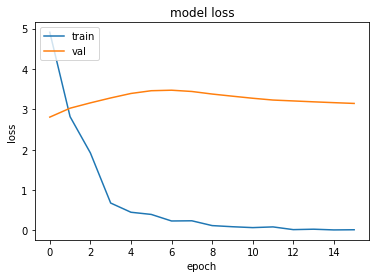

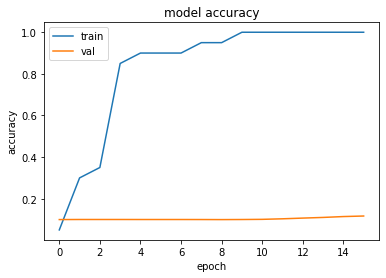

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  15  when Val Acc was:  0.11680000275373459
Epoch when val-loss was min:  0  Val Loss was:  2.8070385456085205
TestLoss:  2.8117260932922363  TestAcc: 0.10010000318288803
Run:  4
Dropout is:  0.5
Shift X: ( 0.0625 , 0.0625 ) or ( -0.0625 , -0.0625 )
Shift Y: ( 0.0625 , 0.0625 )or ( -0.0625 , -0.0625 )
Gamma: ( 110 , 110 )
ZoomOut: ( -0.08 , -0.08 )
ZoomIn: ( 0.08 , 0.08 )
Noise: ( 12 , 12 )
blur: ( 3 , 3 )
sharp: ( 0.05 , 0.05 )
Contrast: ( 0.1 , 0.1 )
Bright: ( 0.1 , 0.1 )
Darken: ( -0.1 , -0.1 )
Rotate: ( 7 , 7 ) or ( -7 , -7 )
pHorizontalFlip:  1
pVerticalFlip:  1
pEqualize:  1
pFancyPCA:  1
pChannelShuffle:  1
pElasticTransform:  1
pToGray:  1
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 3.9064 - accuracy: 0.1500 - val_loss: 2.7345 - val_accuracy: 0.1112
Epoch 2/100
1/1 [==========

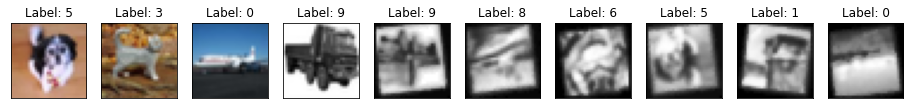

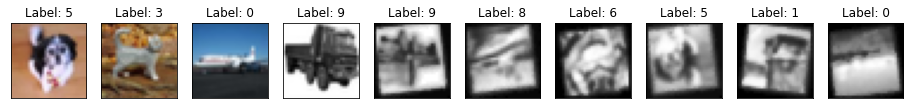

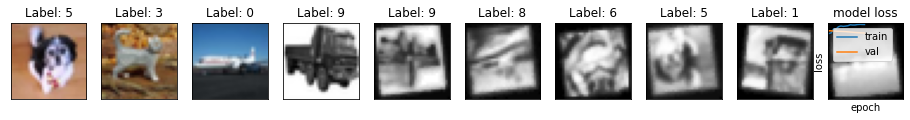

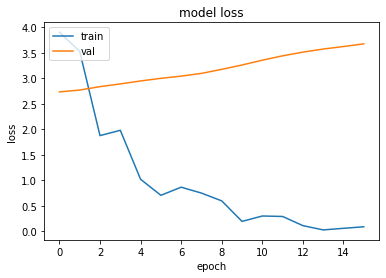

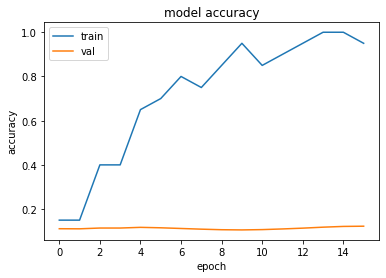

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  15  when Val Acc was:  0.1225999966263771
Epoch when val-loss was min:  0  Val Loss was:  2.734548330307007
TestLoss:  2.7389352321624756  TestAcc: 0.11110000312328339
Run:  5
Dropout is:  0.4
Shift X: ( 0.0 , 0.0 ) or ( -0.0 , -0.0 )
Shift Y: ( 0.125 , 0.125 )or ( -0.125 , -0.125 )
Gamma: ( 100 , 100 )
ZoomOut: ( -0.16 , -0.16 )
ZoomIn: ( 0.08 , 0.08 )
Noise: ( 0 , 0 )
blur: ( 7 , 7 )
sharp: ( 0.0 , 0.0 )
Contrast: ( 0.0 , 0.0 )
Bright: ( 0.2 , 0.2 )
Darken: ( -0.2 , -0.2 )
Rotate: ( 14 , 14 ) or ( -14 , -14 )
pHorizontalFlip:  0
pVerticalFlip:  1
pEqualize:  1
pFancyPCA:  0
pChannelShuffle:  1
pElasticTransform:  0
pToGray:  0
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 1s 1s/step - loss: 3.7376 - accuracy: 0.0000e+00 - val_loss: 2.8856 - val_accuracy: 0.0863
Epoch 2/100
1/1 [========================

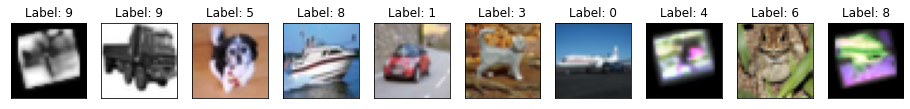

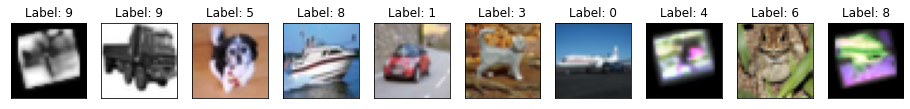

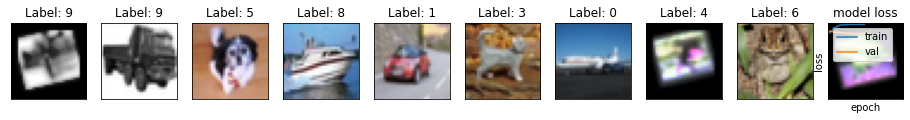

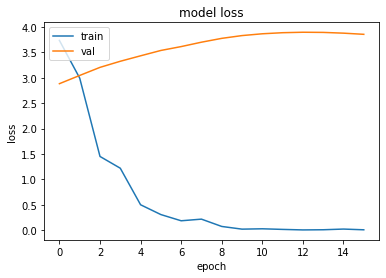

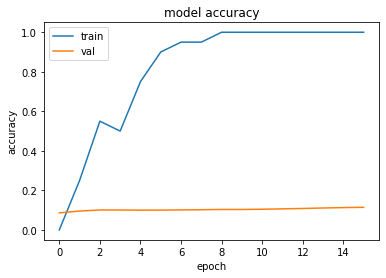

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  15  when Val Acc was:  0.1143999993801117
Epoch when val-loss was min:  0  Val Loss was:  2.8855559825897217
TestLoss:  2.8910467624664307  TestAcc: 0.08910000324249268
Run:  6
Dropout is:  0.4
Shift X: ( 0.125 , 0.125 ) or ( -0.125 , -0.125 )
Shift Y: ( 0.125 , 0.125 )or ( -0.125 , -0.125 )
Gamma: ( 120 , 120 )
ZoomOut: ( -0.0 , -0.0 )
ZoomIn: ( 0.0 , 0.0 )
Noise: ( 24 , 24 )
blur: ( 7 , 7 )
sharp: ( 0.1 , 0.1 )
Contrast: ( 0.0 , 0.0 )
Bright: ( 0.0 , 0.0 )
Darken: ( -0.2 , -0.2 )
Rotate: ( 14 , 14 ) or ( -14 , -14 )
pHorizontalFlip:  0
pVerticalFlip:  0
pEqualize:  1
pFancyPCA:  0
pChannelShuffle:  0
pElasticTransform:  1
pToGray:  1
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 1s 1s/step - loss: 4.3887 - accuracy: 0.1000 - val_loss: 3.5558 - val_accuracy: 0.0996
Epoch 2/100
1/1 [=====================

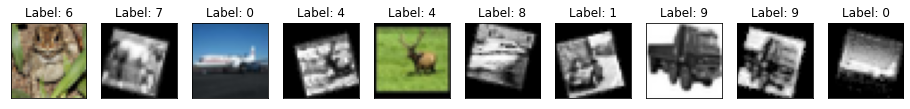

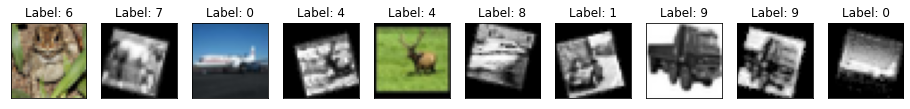

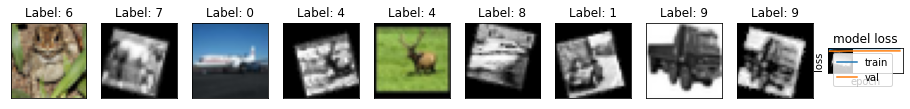

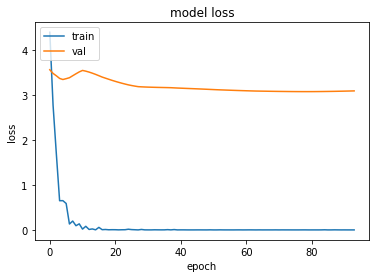

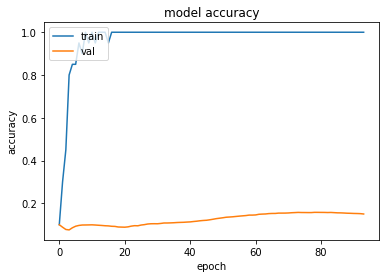

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  78  when Val Acc was:  0.15760000050067902
Epoch when val-loss was min:  78  Val Loss was:  3.070378065109253
TestLoss:  3.093111038208008  TestAcc: 0.1526000052690506
Run:  7
Dropout is:  0.6
Shift X: ( 0.125 , 0.125 ) or ( -0.125 , -0.125 )
Shift Y: ( 0.125 , 0.125 )or ( -0.125 , -0.125 )
Gamma: ( 100 , 100 )
ZoomOut: ( -0.0 , -0.0 )
ZoomIn: ( 0.16 , 0.16 )
Noise: ( 24 , 24 )
blur: ( 0 , 1 )
sharp: ( 0.1 , 0.1 )
Contrast: ( 0.0 , 0.0 )
Bright: ( 0.0 , 0.0 )
Darken: ( -0.0 , -0.0 )
Rotate: ( 7 , 7 ) or ( -7 , -7 )
pHorizontalFlip:  1
pVerticalFlip:  0
pEqualize:  1
pFancyPCA:  1
pChannelShuffle:  1
pElasticTransform:  0
pToGray:  0
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 1s 1s/step - loss: 4.4505 - accuracy: 0.1000 - val_loss: 2.7298 - val_accuracy: 0.1298
Epoch 2/100
1/1 [========================

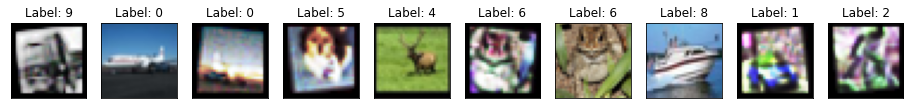

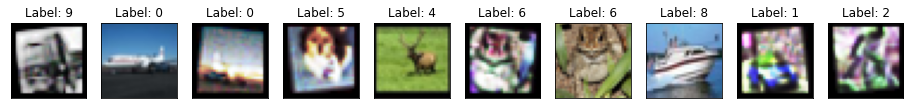

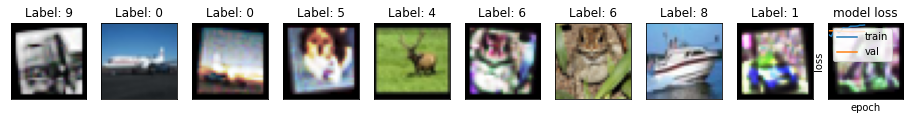

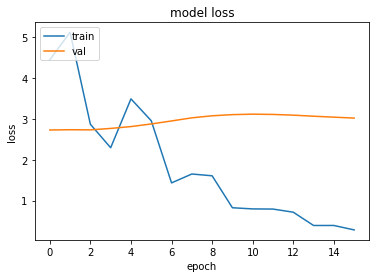

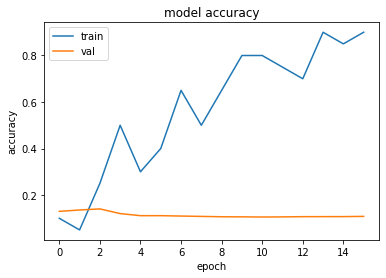

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  2  when Val Acc was:  0.1404000073671341
Epoch when val-loss was min:  0  Val Loss was:  2.7298288345336914
TestLoss:  2.730522871017456  TestAcc: 0.13109999895095825
Run:  8
Dropout is:  0.4
Shift X: ( 0.125 , 0.125 ) or ( -0.125 , -0.125 )
Shift Y: ( 0.0 , 0.0 )or ( -0.0 , -0.0 )
Gamma: ( 100 , 100 )
ZoomOut: ( -0.0 , -0.0 )
ZoomIn: ( 0.0 , 0.0 )
Noise: ( 24 , 24 )
blur: ( 7 , 7 )
sharp: ( 0.0 , 0.0 )
Contrast: ( 0.0 , 0.0 )
Bright: ( 0.0 , 0.0 )
Darken: ( -0.2 , -0.2 )
Rotate: ( 0 , 0 ) or ( 0 , 0 )
pHorizontalFlip:  1
pVerticalFlip:  1
pEqualize:  1
pFancyPCA:  1
pChannelShuffle:  1
pElasticTransform:  1
pToGray:  0
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 1s 1s/step - loss: 3.5525 - accuracy: 0.1500 - val_loss: 2.5041 - val_accuracy: 0.1177
Epoch 2/100
1/1 [==============================] - 0s 

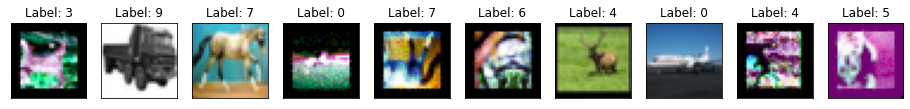

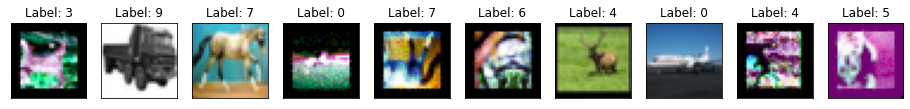

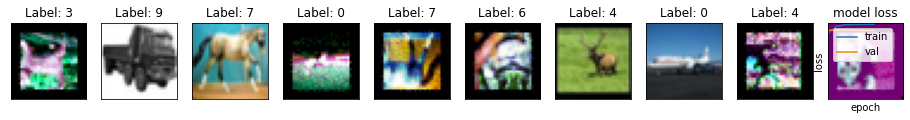

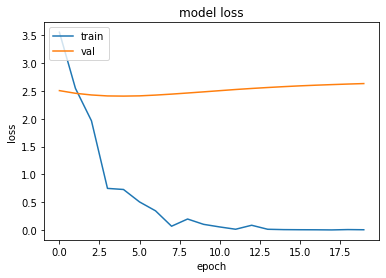

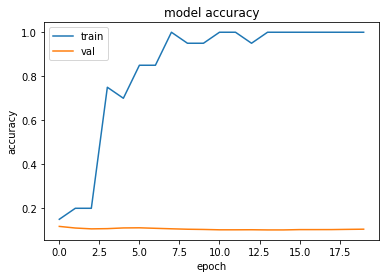

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  0  when Val Acc was:  0.1177000030875206
Epoch when val-loss was min:  4  Val Loss was:  2.4055278301239014
TestLoss:  2.40573787689209  TestAcc: 0.1054999977350235
Run:  9
Dropout is:  0.5
Shift X: ( 0.0625 , 0.0625 ) or ( -0.0625 , -0.0625 )
Shift Y: ( 0.0625 , 0.0625 )or ( -0.0625 , -0.0625 )
Gamma: ( 110 , 110 )
ZoomOut: ( -0.08 , -0.08 )
ZoomIn: ( 0.08 , 0.08 )
Noise: ( 12 , 12 )
blur: ( 3 , 3 )
sharp: ( 0.05 , 0.05 )
Contrast: ( 0.1 , 0.1 )
Bright: ( 0.1 , 0.1 )
Darken: ( -0.1 , -0.1 )
Rotate: ( 7 , 7 ) or ( -7 , -7 )
pHorizontalFlip:  0
pVerticalFlip:  0
pEqualize:  0
pFancyPCA:  0
pChannelShuffle:  0
pElasticTransform:  0
pToGray:  0
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 1s 1s/step - loss: 4.0674 - accuracy: 0.1000 - val_loss: 3.6909 - val_accuracy: 0.1000
Epoch 2/100
1/1 [===============

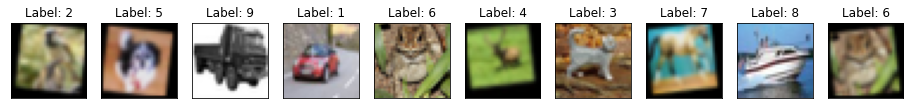

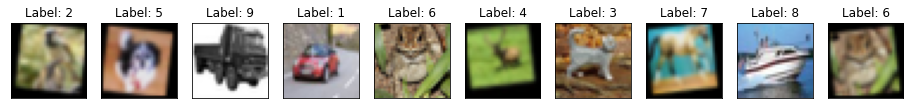

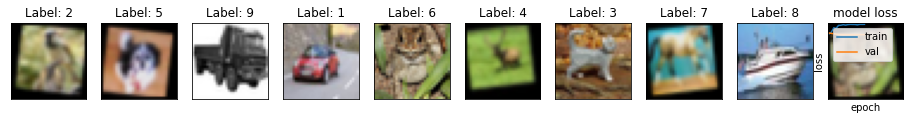

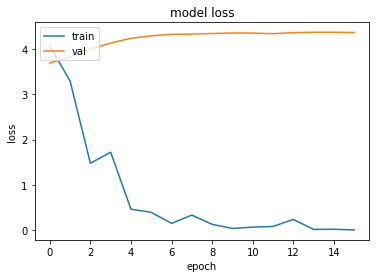

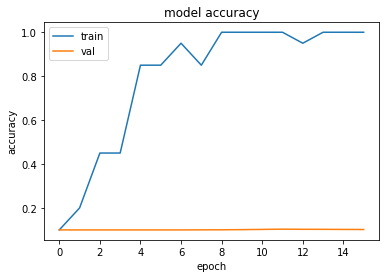

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  11  when Val Acc was:  0.10339999943971634
Epoch when val-loss was min:  0  Val Loss was:  3.6909356117248535
TestLoss:  3.70123553276062  TestAcc: 0.10000000149011612
Run:  10
Dropout is:  0.5
Shift X: ( 0.0 , 0.0 ) or ( -0.0 , -0.0 )
Shift Y: ( 0.0 , 0.0 )or ( -0.0 , -0.0 )
Gamma: ( 100 , 100 )
ZoomOut: ( -0.0 , -0.0 )
ZoomIn: ( 0.16 , 0.16 )
Noise: ( 24 , 24 )
blur: ( 7 , 7 )
sharp: ( 0.1 , 0.1 )
Contrast: ( 0.0 , 0.0 )
Bright: ( 0.2 , 0.2 )
Darken: ( -0.0 , -0.0 )
Rotate: ( 14 , 14 ) or ( -14 , -14 )
pHorizontalFlip:  0
pVerticalFlip:  0
pEqualize:  0
pFancyPCA:  0
pChannelShuffle:  1
pElasticTransform:  0
pToGray:  1
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 1s 1s/step - loss: 4.1967 - accuracy: 0.1000 - val_loss: 2.9746 - val_accuracy: 0.1006
Epoch 2/100
1/1 [==============================] - 0

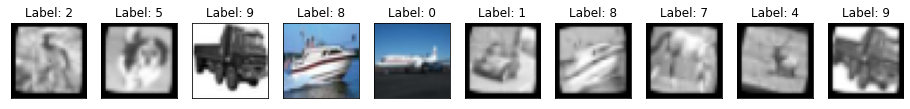

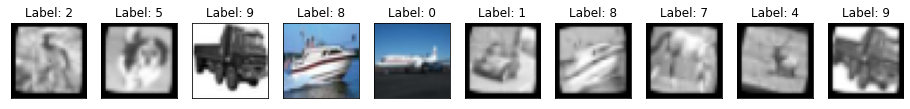

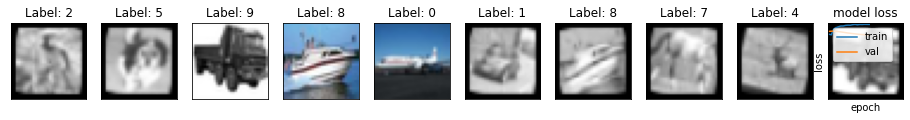

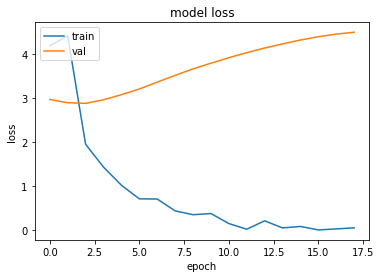

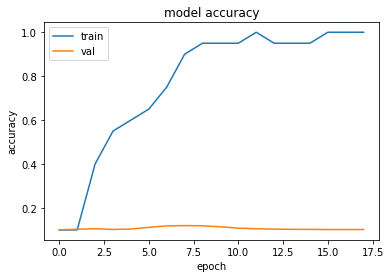

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  7  when Val Acc was:  0.11969999969005585
Epoch when val-loss was min:  2  Val Loss was:  2.886442184448242
TestLoss:  2.8950939178466797  TestAcc: 0.10570000112056732


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Download attempted :  Fri, 05 November 2021 20:24:38
Run:  11
Dropout is:  0.6
Shift X: ( 0.0 , 0.0 ) or ( -0.0 , -0.0 )
Shift Y: ( 0.0 , 0.0 )or ( -0.0 , -0.0 )
Gamma: ( 100 , 100 )
ZoomOut: ( -0.16 , -0.16 )
ZoomIn: ( 0.0 , 0.0 )
Noise: ( 0 , 0 )
blur: ( 7 , 7 )
sharp: ( 0.1 , 0.1 )
Contrast: ( 0.0 , 0.0 )
Bright: ( 0.0 , 0.0 )
Darken: ( -0.2 , -0.2 )
Rotate: ( 14 , 14 ) or ( -14 , -14 )
pHorizontalFlip:  1
pVerticalFlip:  0
pEqualize:  0
pFancyPCA:  1
pChannelShuffle:  1
pElasticTransform:  1
pToGray:  1
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 1s 1s/step - loss: 6.1386 - accuracy: 0.0500 - val_loss: 2.7742 - val_accuracy: 0.0978
Epoch 2/100
1/1 [==============================] - 0s 437ms/step - loss: 5.9556 - accuracy: 0.1000 - val_loss: 2.7064 - val_accuracy: 0.0993
Epoch 3/100
1/1 [==============================] - 0s 447ms/step - loss: 4.2813 - accuracy: 0.1500 - val_loss: 2.6981 - val_accura

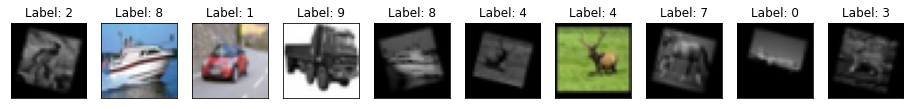

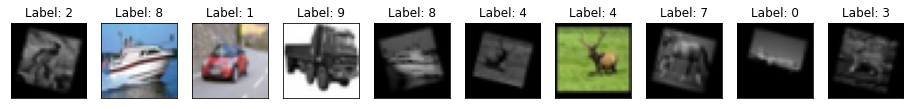

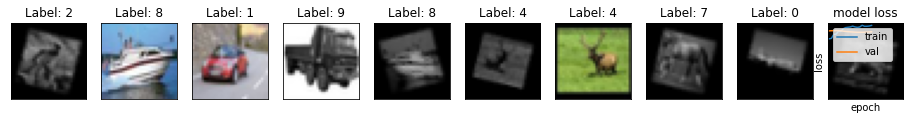

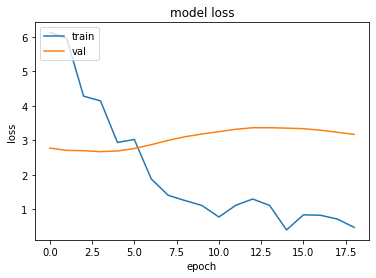

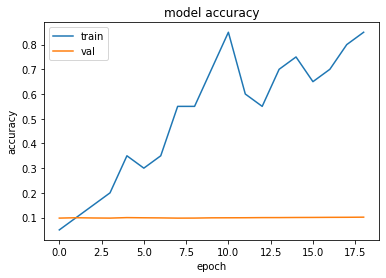

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  18  when Val Acc was:  0.10159999877214432
Epoch when val-loss was min:  3  Val Loss was:  2.6692495346069336
TestLoss:  2.6787965297698975  TestAcc: 0.09759999811649323
Run:  12
Dropout is:  0.4
Shift X: ( 0.125 , 0.125 ) or ( -0.125 , -0.125 )
Shift Y: ( 0.0 , 0.0 )or ( -0.0 , -0.0 )
Gamma: ( 100 , 100 )
ZoomOut: ( -0.08 , -0.08 )
ZoomIn: ( 0.16 , 0.16 )
Noise: ( 24 , 24 )
blur: ( 7 , 7 )
sharp: ( 0.1 , 0.1 )
Contrast: ( 0.2 , 0.2 )
Bright: ( 0.2 , 0.2 )
Darken: ( -0.0 , -0.0 )
Rotate: ( 14 , 14 ) or ( -14 , -14 )
pHorizontalFlip:  1
pVerticalFlip:  1
pEqualize:  1
pFancyPCA:  0
pChannelShuffle:  0
pElasticTransform:  1
pToGray:  0
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 1s 1s/step - loss: 5.0383 - accuracy: 0.1000 - val_loss: 3.1194 - val_accuracy: 0.0856
Epoch 2/100
1/1 [=======================

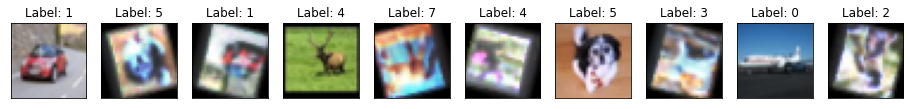

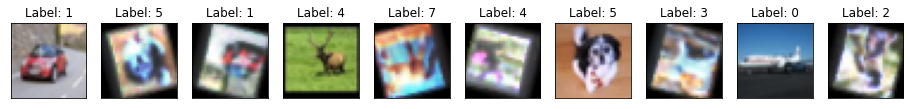

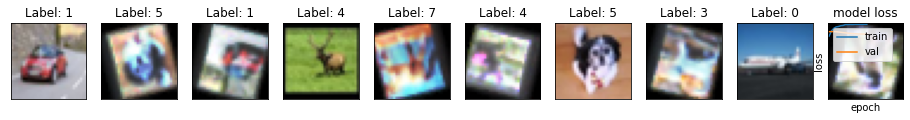

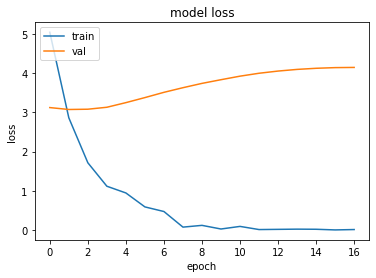

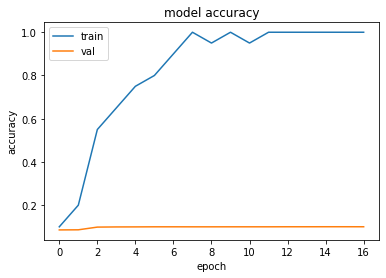

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  14  when Val Acc was:  0.10029999911785126
Epoch when val-loss was min:  1  Val Loss was:  3.070563554763794
TestLoss:  3.0699963569641113  TestAcc: 0.08940000087022781
Run:  13
Dropout is:  0.6
Shift X: ( 0.0 , 0.0 ) or ( -0.0 , -0.0 )
Shift Y: ( 0.125 , 0.125 )or ( -0.125 , -0.125 )
Gamma: ( 120 , 120 )
ZoomOut: ( -0.08 , -0.08 )
ZoomIn: ( 0.0 , 0.0 )
Noise: ( 0 , 0 )
blur: ( 0 , 1 )
sharp: ( 0.0 , 0.0 )
Contrast: ( 0.0 , 0.0 )
Bright: ( 0.0 , 0.0 )
Darken: ( -0.2 , -0.2 )
Rotate: ( 0 , 0 ) or ( 0 , 0 )
pHorizontalFlip:  0
pVerticalFlip:  0
pEqualize:  0
pFancyPCA:  1
pChannelShuffle:  1
pElasticTransform:  0
pToGray:  1
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 4.9900 - accuracy: 0.1500 - val_loss: 2.6229 - val_accuracy: 0.1020
Epoch 2/100
1/1 [==============================] - 

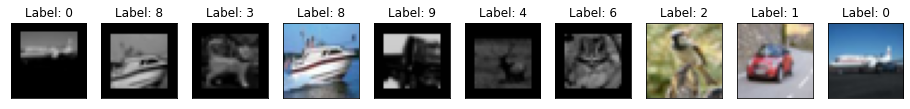

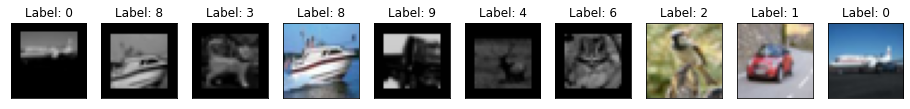

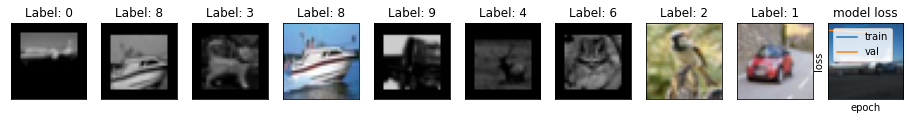

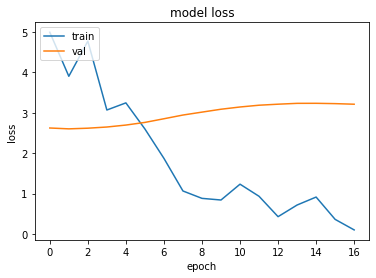

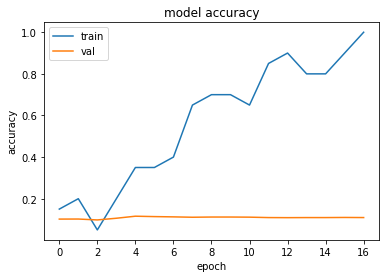

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  4  when Val Acc was:  0.11590000241994858
Epoch when val-loss was min:  1  Val Loss was:  2.6018946170806885
TestLoss:  2.600036382675171  TestAcc: 0.10239999741315842
Run:  14
Dropout is:  0.4
Shift X: ( 0.0625 , 0.0625 ) or ( -0.0625 , -0.0625 )
Shift Y: ( 0.0 , 0.0 )or ( -0.0 , -0.0 )
Gamma: ( 100 , 100 )
ZoomOut: ( -0.0 , -0.0 )
ZoomIn: ( 0.0 , 0.0 )
Noise: ( 0 , 0 )
blur: ( 0 , 1 )
sharp: ( 0.0 , 0.0 )
Contrast: ( 0.0 , 0.0 )
Bright: ( 0.0 , 0.0 )
Darken: ( -0.0 , -0.0 )
Rotate: ( 0 , 0 ) or ( 0 , 0 )
pHorizontalFlip:  0
pVerticalFlip:  0
pEqualize:  0
pFancyPCA:  0
pChannelShuffle:  0
pElasticTransform:  0
pToGray:  0
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 1s 1s/step - loss: 4.3432 - accuracy: 0.1000 - val_loss: 2.7466 - val_accuracy: 0.1002
Epoch 2/100
1/1 [==============================] -

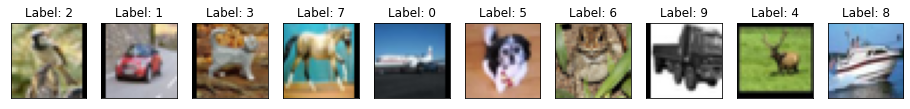

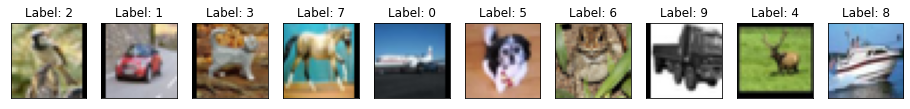

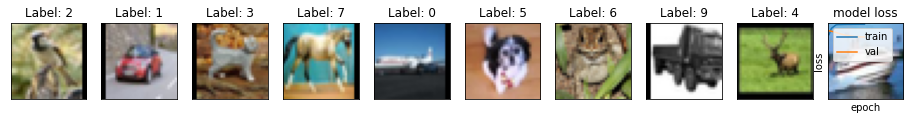

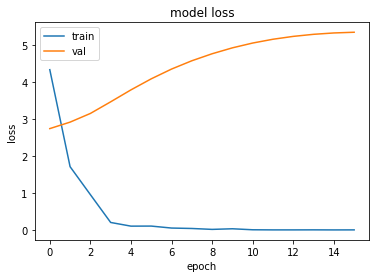

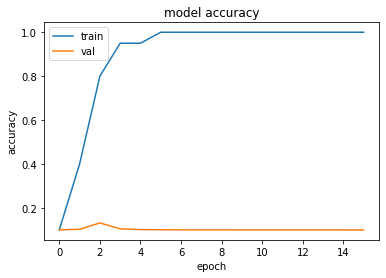

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  2  when Val Acc was:  0.13169999420642853
Epoch when val-loss was min:  0  Val Loss was:  2.746560573577881
TestLoss:  2.75788950920105  TestAcc: 0.10029999911785126
Run:  15
Dropout is:  0.6
Shift X: ( 0.0625 , 0.0625 ) or ( -0.0625 , -0.0625 )
Shift Y: ( 0.125 , 0.125 )or ( -0.125 , -0.125 )
Gamma: ( 120 , 120 )
ZoomOut: ( -0.16 , -0.16 )
ZoomIn: ( 0.16 , 0.16 )
Noise: ( 24 , 24 )
blur: ( 7 , 7 )
sharp: ( 0.1 , 0.1 )
Contrast: ( 0.2 , 0.2 )
Bright: ( 0.2 , 0.2 )
Darken: ( -0.2 , -0.2 )
Rotate: ( 14 , 14 ) or ( -14 , -14 )
pHorizontalFlip:  1
pVerticalFlip:  1
pEqualize:  1
pFancyPCA:  1
pChannelShuffle:  1
pElasticTransform:  1
pToGray:  1
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 1s 1s/step - loss: 4.6674 - accuracy: 0.1000 - val_loss: 3.0478 - val_accuracy: 0.0999
Epoch 2/100
1/1 [===============

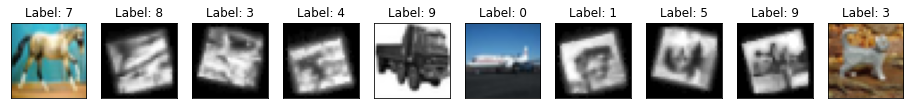

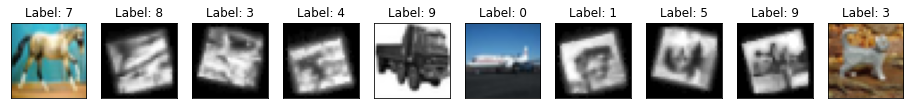

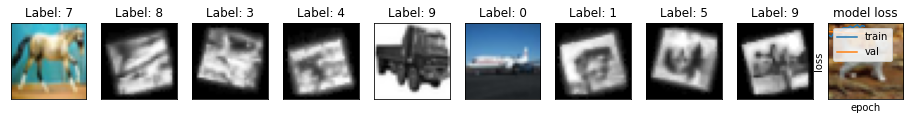

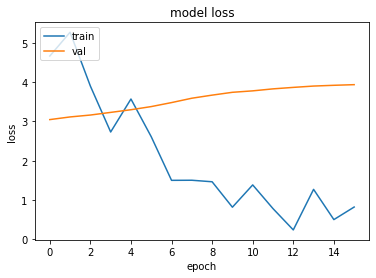

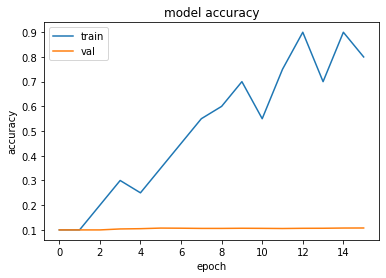

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  15  when Val Acc was:  0.10769999772310257
Epoch when val-loss was min:  0  Val Loss was:  3.0477988719940186
TestLoss:  3.0566534996032715  TestAcc: 0.10019999742507935
Run:  16
Dropout is:  0.4
Shift X: ( 0.0 , 0.0 ) or ( -0.0 , -0.0 )
Shift Y: ( 0.125 , 0.125 )or ( -0.125 , -0.125 )
Gamma: ( 100 , 100 )
ZoomOut: ( -0.16 , -0.16 )
ZoomIn: ( 0.0 , 0.0 )
Noise: ( 24 , 24 )
blur: ( 3 , 3 )
sharp: ( 0.1 , 0.1 )
Contrast: ( 0.0 , 0.0 )
Bright: ( 0.0 , 0.0 )
Darken: ( -0.0 , -0.0 )
Rotate: ( 0 , 0 ) or ( 0 , 0 )
pHorizontalFlip:  1
pVerticalFlip:  1
pEqualize:  0
pFancyPCA:  0
pChannelShuffle:  0
pElasticTransform:  1
pToGray:  1
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 1s 1s/step - loss: 3.3684 - accuracy: 0.1000 - val_loss: 3.2233 - val_accuracy: 0.1002
Epoch 2/100
1/1 [==============================]

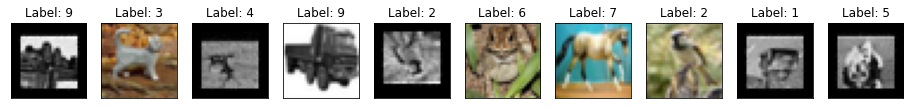

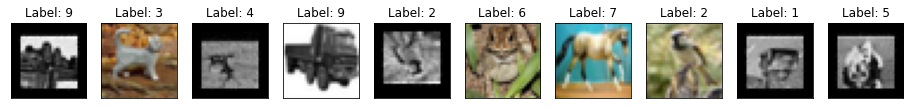

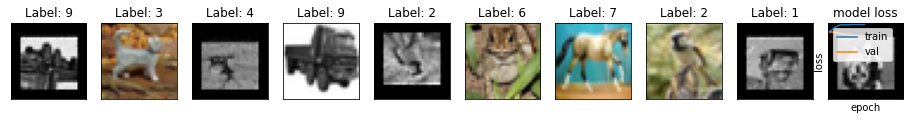

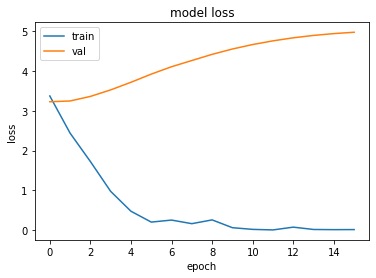

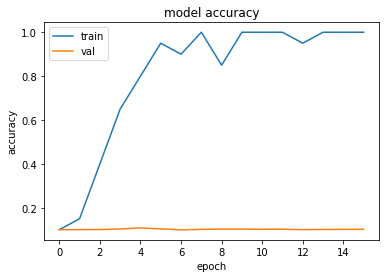

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  4  when Val Acc was:  0.1080000028014183
Epoch when val-loss was min:  0  Val Loss was:  3.2232542037963867
TestLoss:  3.2296676635742188  TestAcc: 0.10019999742507935
Run:  17
Dropout is:  0.6
Shift X: ( 0.125 , 0.125 ) or ( -0.125 , -0.125 )
Shift Y: ( 0.125 , 0.125 )or ( -0.125 , -0.125 )
Gamma: ( 100 , 100 )
ZoomOut: ( -0.16 , -0.16 )
ZoomIn: ( 0.0 , 0.0 )
Noise: ( 24 , 24 )
blur: ( 0 , 1 )
sharp: ( 0.1 , 0.1 )
Contrast: ( 0.2 , 0.2 )
Bright: ( 0.0 , 0.0 )
Darken: ( -0.2 , -0.2 )
Rotate: ( 14 , 14 ) or ( -14 , -14 )
pHorizontalFlip:  0
pVerticalFlip:  1
pEqualize:  0
pFancyPCA:  0
pChannelShuffle:  1
pElasticTransform:  0
pToGray:  0
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 1s 1s/step - loss: 5.3547 - accuracy: 0.1000 - val_loss: 2.8355 - val_accuracy: 0.0945
Epoch 2/100
1/1 [===================

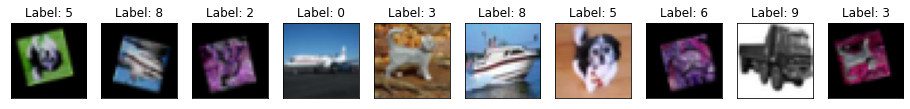

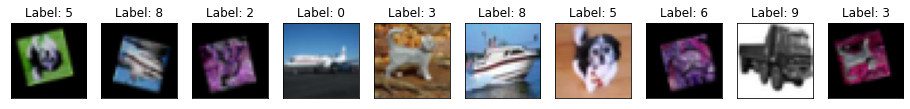

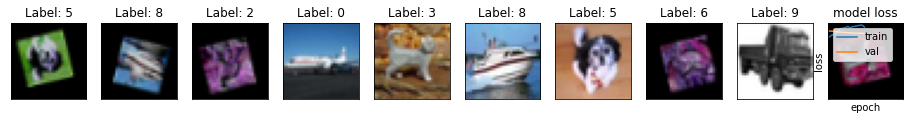

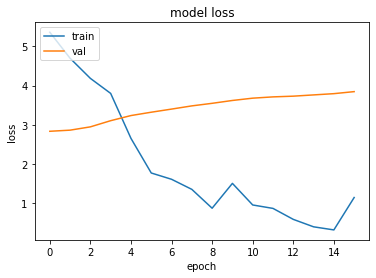

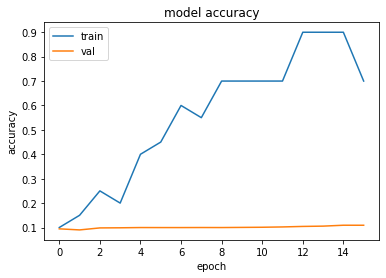

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  14  when Val Acc was:  0.10930000245571136
Epoch when val-loss was min:  0  Val Loss was:  2.835498571395874
TestLoss:  2.842602252960205  TestAcc: 0.09430000185966492
Run:  18
Dropout is:  0.4
Shift X: ( 0.0 , 0.0 ) or ( -0.0 , -0.0 )
Shift Y: ( 0.0 , 0.0 )or ( -0.0 , -0.0 )
Gamma: ( 120 , 120 )
ZoomOut: ( -0.16 , -0.16 )
ZoomIn: ( 0.0 , 0.0 )
Noise: ( 24 , 24 )
blur: ( 7 , 7 )
sharp: ( 0.1 , 0.1 )
Contrast: ( 0.2 , 0.2 )
Bright: ( 0.1 , 0.1 )
Darken: ( -0.0 , -0.0 )
Rotate: ( 0 , 0 ) or ( 0 , 0 )
pHorizontalFlip:  0
pVerticalFlip:  0
pEqualize:  1
pFancyPCA:  1
pChannelShuffle:  1
pElasticTransform:  0
pToGray:  0
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 1s 1s/step - loss: 3.9425 - accuracy: 0.1000 - val_loss: 2.7374 - val_accuracy: 0.1037
Epoch 2/100
1/1 [==============================] - 0s 458m

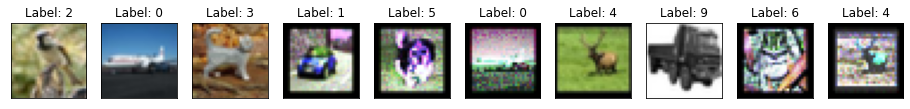

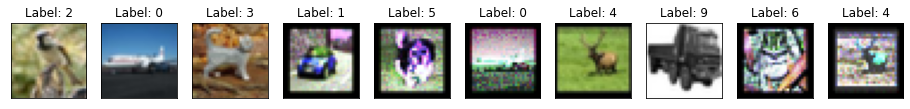

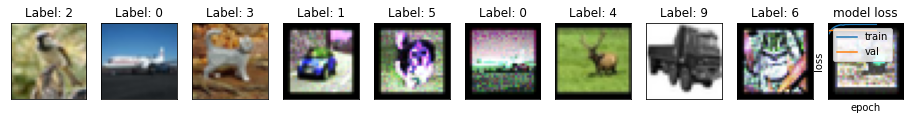

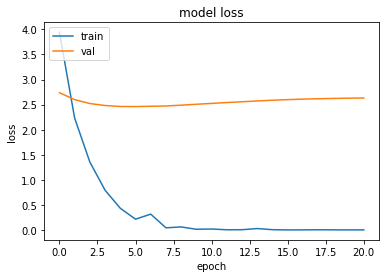

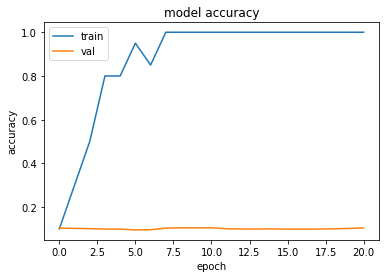

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  8  when Val Acc was:  0.10540000349283218
Epoch when val-loss was min:  5  Val Loss was:  2.460977792739868
TestLoss:  2.468240261077881  TestAcc: 0.09570000320672989
Run:  19
Dropout is:  0.6
Shift X: ( 0.0 , 0.0 ) or ( -0.0 , -0.0 )
Shift Y: ( 0.125 , 0.125 )or ( -0.125 , -0.125 )
Gamma: ( 120 , 120 )
ZoomOut: ( -0.16 , -0.16 )
ZoomIn: ( 0.16 , 0.16 )
Noise: ( 0 , 0 )
blur: ( 0 , 1 )
sharp: ( 0.1 , 0.1 )
Contrast: ( 0.2 , 0.2 )
Bright: ( 0.2 , 0.2 )
Darken: ( -0.0 , -0.0 )
Rotate: ( 14 , 14 ) or ( -14 , -14 )
pHorizontalFlip:  0
pVerticalFlip:  0
pEqualize:  0
pFancyPCA:  0
pChannelShuffle:  0
pElasticTransform:  0
pToGray:  1
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 1s 1s/step - loss: 5.9124 - accuracy: 0.0500 - val_loss: 2.8533 - val_accuracy: 0.0999
Epoch 2/100
1/1 [============================

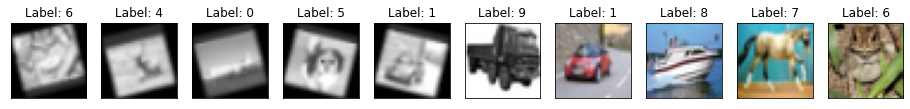

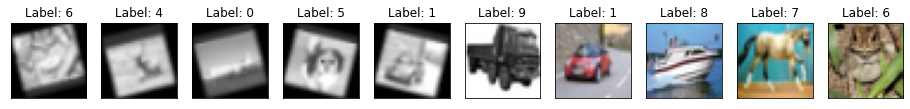

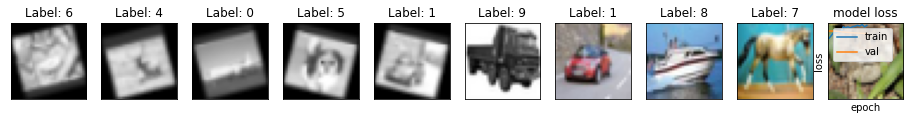

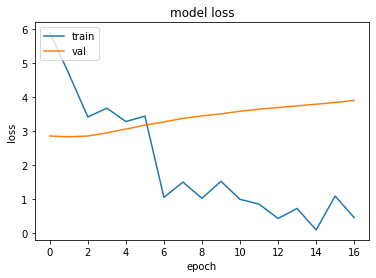

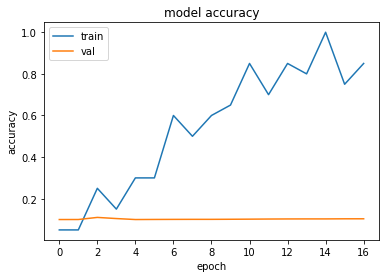

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  2  when Val Acc was:  0.11010000109672546
Epoch when val-loss was min:  1  Val Loss was:  2.8318092823028564
TestLoss:  2.8429596424102783  TestAcc: 0.09969999641180038
Run:  20
Dropout is:  0.6
Shift X: ( 0.0 , 0.0 ) or ( -0.0 , -0.0 )
Shift Y: ( 0.0 , 0.0 )or ( -0.0 , -0.0 )
Gamma: ( 100 , 100 )
ZoomOut: ( -0.16 , -0.16 )
ZoomIn: ( 0.16 , 0.16 )
Noise: ( 0 , 0 )
blur: ( 0 , 1 )
sharp: ( 0.0 , 0.0 )
Contrast: ( 0.2 , 0.2 )
Bright: ( 0.2 , 0.2 )
Darken: ( -0.0 , -0.0 )
Rotate: ( 0 , 0 ) or ( 0 , 0 )
pHorizontalFlip:  1
pVerticalFlip:  1
pEqualize:  0
pFancyPCA:  1
pChannelShuffle:  1
pElasticTransform:  0
pToGray:  0
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 1s 1s/step - loss: 5.5764 - accuracy: 0.1500 - val_loss: 3.0953 - val_accuracy: 0.0984
Epoch 2/100
1/1 [==============================] - 0s 453

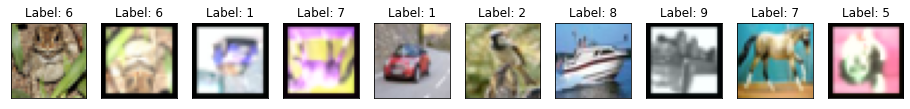

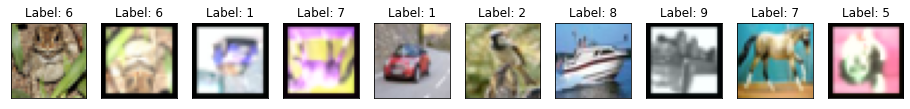

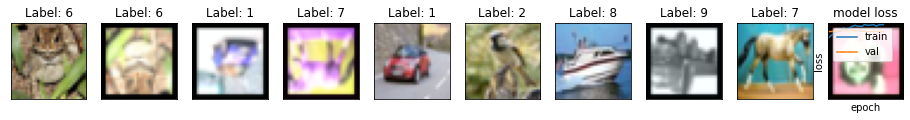

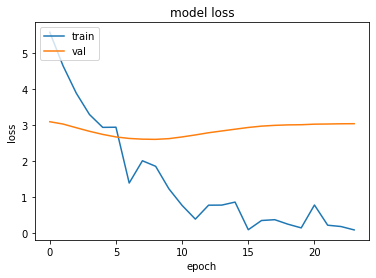

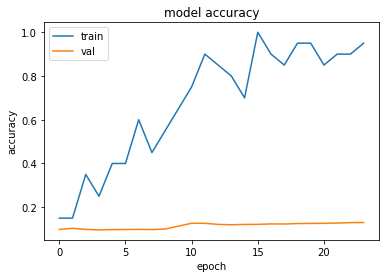

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  23  when Val Acc was:  0.12999999523162842
Epoch when val-loss was min:  8  Val Loss was:  2.6067323684692383
TestLoss:  2.608738660812378  TestAcc: 0.10159999877214432


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Download attempted :  Fri, 05 November 2021 20:27:36
Run:  21
Dropout is:  0.6
Shift X: ( 0.125 , 0.125 ) or ( -0.125 , -0.125 )
Shift Y: ( 0.125 , 0.125 )or ( -0.125 , -0.125 )
Gamma: ( 100 , 100 )
ZoomOut: ( -0.0 , -0.0 )
ZoomIn: ( 0.16 , 0.16 )
Noise: ( 0 , 0 )
blur: ( 0 , 1 )
sharp: ( 0.0 , 0.0 )
Contrast: ( 0.0 , 0.0 )
Bright: ( 0.1 , 0.1 )
Darken: ( -0.2 , -0.2 )
Rotate: ( 14 , 14 ) or ( -14 , -14 )
pHorizontalFlip:  1
pVerticalFlip:  1
pEqualize:  0
pFancyPCA:  0
pChannelShuffle:  0
pElasticTransform:  1
pToGray:  1
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 1s 1s/step - loss: 5.3617 - accuracy: 0.1000 - val_loss: 3.0753 - val_accuracy: 0.1000
Epoch 2/100
1/1 [==============================] - 1s 503ms/step - loss: 4.7111 - accuracy: 0.1500 - val_loss: 3.1841 - val_accuracy: 0.1000
Epoch 3/100
1/1 [==============================] - 0s 483ms/step - loss: 3.2643 - accuracy: 0.4000 - val_loss: 3.2

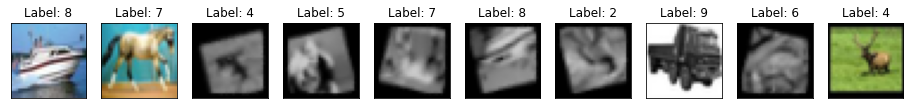

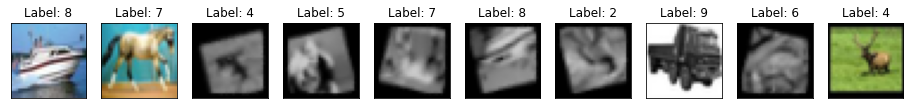

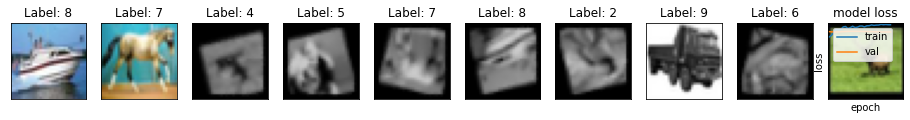

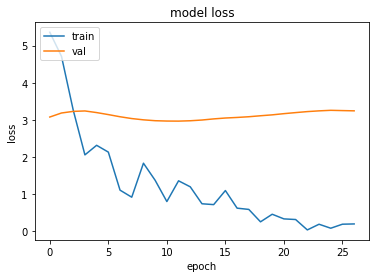

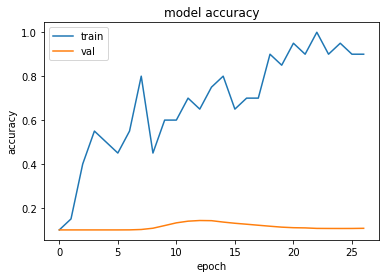

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  12  when Val Acc was:  0.1428000032901764
Epoch when val-loss was min:  11  Val Loss was:  2.9649813175201416
TestLoss:  2.971832513809204  TestAcc: 0.14329999685287476
Run:  22
Dropout is:  0.4
Shift X: ( 0.0 , 0.0 ) or ( -0.0 , -0.0 )
Shift Y: ( 0.0 , 0.0 )or ( -0.0 , -0.0 )
Gamma: ( 120 , 120 )
ZoomOut: ( -0.0 , -0.0 )
ZoomIn: ( 0.16 , 0.16 )
Noise: ( 0 , 0 )
blur: ( 7 , 7 )
sharp: ( 0.0 , 0.0 )
Contrast: ( 0.0 , 0.0 )
Bright: ( 0.2 , 0.2 )
Darken: ( -0.0 , -0.0 )
Rotate: ( 0 , 0 ) or ( 0 , 0 )
pHorizontalFlip:  1
pVerticalFlip:  0
pEqualize:  1
pFancyPCA:  1
pChannelShuffle:  0
pElasticTransform:  1
pToGray:  1
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 4.0868 - accuracy: 0.0500 - val_loss: 2.8404 - val_accuracy: 0.1156
Epoch 2/100
1/1 [==============================] - 1s 546ms

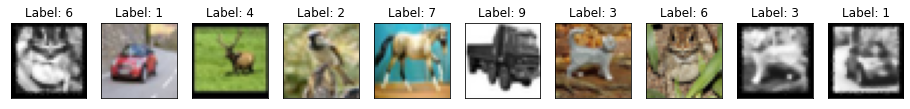

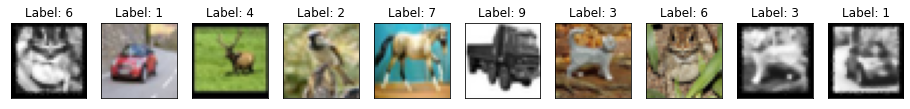

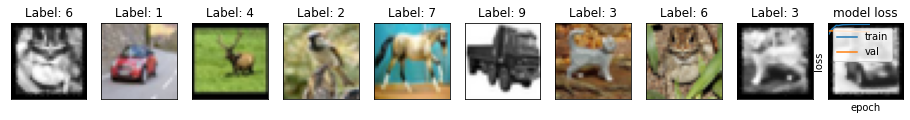

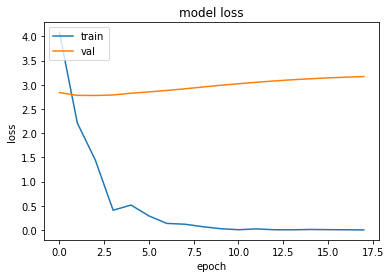

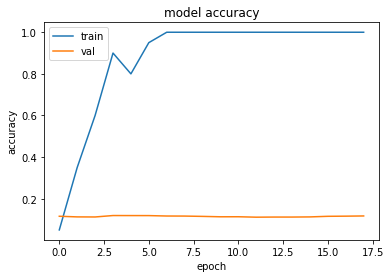

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  3  when Val Acc was:  0.11909999698400497
Epoch when val-loss was min:  2  Val Loss was:  2.7796452045440674
TestLoss:  2.7921438217163086  TestAcc: 0.11640000343322754
Run:  23
Dropout is:  0.6
Shift X: ( 0.125 , 0.125 ) or ( -0.125 , -0.125 )
Shift Y: ( 0.0 , 0.0 )or ( -0.0 , -0.0 )
Gamma: ( 120 , 120 )
ZoomOut: ( -0.0 , -0.0 )
ZoomIn: ( 0.08 , 0.08 )
Noise: ( 24 , 24 )
blur: ( 0 , 1 )
sharp: ( 0.1 , 0.1 )
Contrast: ( 0.2 , 0.2 )
Bright: ( 0.0 , 0.0 )
Darken: ( -0.0 , -0.0 )
Rotate: ( 0 , 0 ) or ( 0 , 0 )
pHorizontalFlip:  1
pVerticalFlip:  0
pEqualize:  0
pFancyPCA:  1
pChannelShuffle:  0
pElasticTransform:  1
pToGray:  1
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 1s 1s/step - loss: 6.3861 - accuracy: 0.0000e+00 - val_loss: 3.1955 - val_accuracy: 0.1019
Epoch 2/100
1/1 [============================

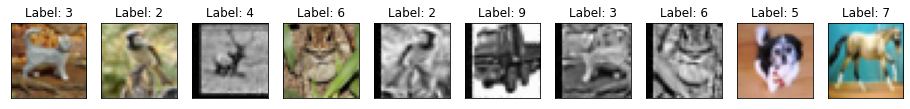

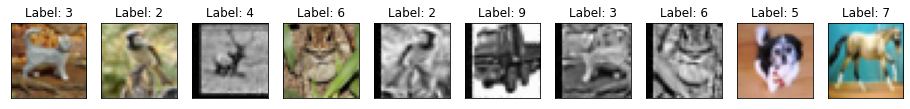

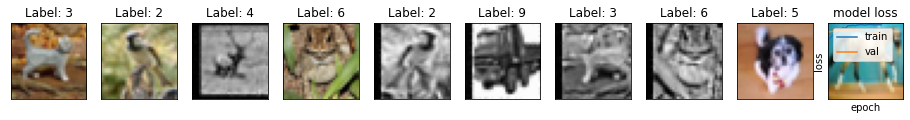

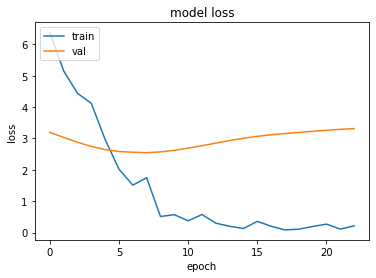

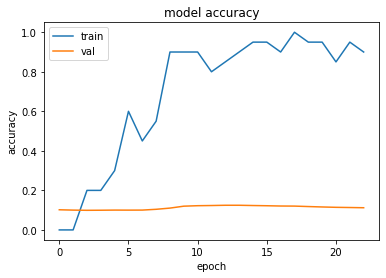

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  12  when Val Acc was:  0.12470000237226486
Epoch when val-loss was min:  7  Val Loss was:  2.546572208404541
TestLoss:  2.5419669151306152  TestAcc: 0.10369999706745148
Run:  24
Dropout is:  0.4
Shift X: ( 0.0 , 0.0 ) or ( -0.0 , -0.0 )
Shift Y: ( 0.0 , 0.0 )or ( -0.0 , -0.0 )
Gamma: ( 120 , 120 )
ZoomOut: ( -0.16 , -0.16 )
ZoomIn: ( 0.0 , 0.0 )
Noise: ( 0 , 0 )
blur: ( 7 , 7 )
sharp: ( 0.0 , 0.0 )
Contrast: ( 0.2 , 0.2 )
Bright: ( 0.2 , 0.2 )
Darken: ( -0.2 , -0.2 )
Rotate: ( 7 , 7 ) or ( -7 , -7 )
pHorizontalFlip:  0
pVerticalFlip:  1
pEqualize:  0
pFancyPCA:  0
pChannelShuffle:  0
pElasticTransform:  1
pToGray:  1
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 1s 1s/step - loss: 4.8558 - accuracy: 0.0500 - val_loss: 2.8306 - val_accuracy: 0.1046
Epoch 2/100
1/1 [==============================] - 0s 484

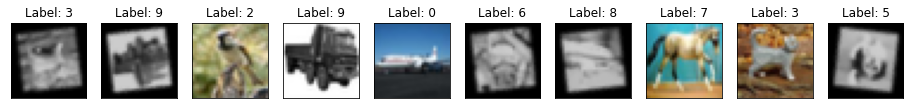

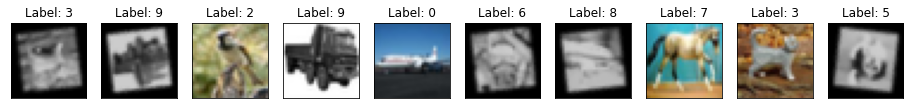

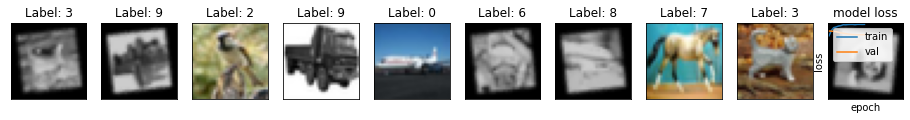

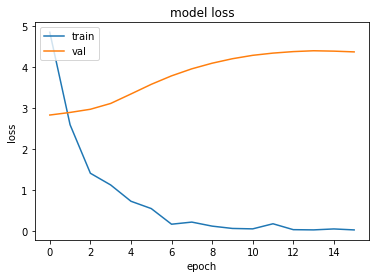

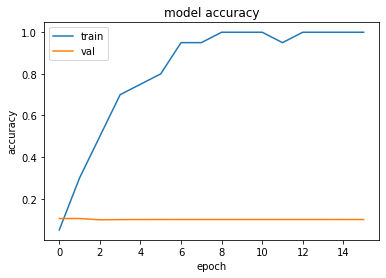

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  1  when Val Acc was:  0.1046999990940094
Epoch when val-loss was min:  0  Val Loss was:  2.8306052684783936
TestLoss:  2.8247382640838623  TestAcc: 0.10679999738931656
Run:  25
Dropout is:  0.5
Shift X: ( 0.125 , 0.125 ) or ( -0.125 , -0.125 )
Shift Y: ( 0.125 , 0.125 )or ( -0.125 , -0.125 )
Gamma: ( 120 , 120 )
ZoomOut: ( -0.16 , -0.16 )
ZoomIn: ( 0.0 , 0.0 )
Noise: ( 0 , 0 )
blur: ( 0 , 1 )
sharp: ( 0.0 , 0.0 )
Contrast: ( 0.2 , 0.2 )
Bright: ( 0.0 , 0.0 )
Darken: ( -0.2 , -0.2 )
Rotate: ( 0 , 0 ) or ( 0 , 0 )
pHorizontalFlip:  1
pVerticalFlip:  1
pEqualize:  1
pFancyPCA:  1
pChannelShuffle:  0
pElasticTransform:  1
pToGray:  0
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 4.5178 - accuracy: 0.1000 - val_loss: 2.6506 - val_accuracy: 0.1019
Epoch 2/100
1/1 [===========================

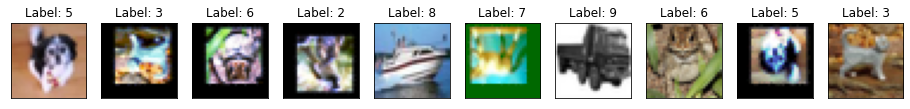

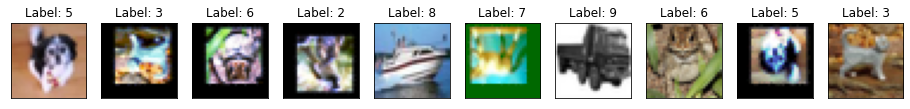

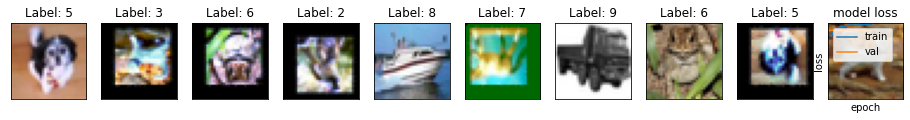

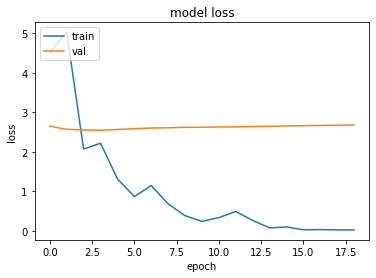

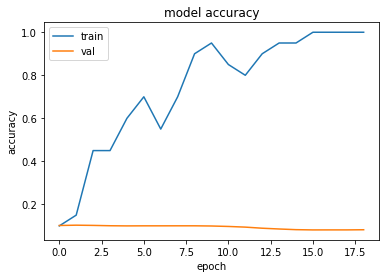

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  1  when Val Acc was:  0.10329999774694443
Epoch when val-loss was min:  3  Val Loss was:  2.5462939739227295
TestLoss:  2.5546560287475586  TestAcc: 0.10119999945163727
Run:  26
Dropout is:  0.4
Shift X: ( 0.125 , 0.125 ) or ( -0.125 , -0.125 )
Shift Y: ( 0.125 , 0.125 )or ( -0.125 , -0.125 )
Gamma: ( 120 , 120 )
ZoomOut: ( -0.0 , -0.0 )
ZoomIn: ( 0.16 , 0.16 )
Noise: ( 24 , 24 )
blur: ( 0 , 1 )
sharp: ( 0.0 , 0.0 )
Contrast: ( 0.2 , 0.2 )
Bright: ( 0.2 , 0.2 )
Darken: ( -0.0 , -0.0 )
Rotate: ( 0 , 0 ) or ( 0 , 0 )
pHorizontalFlip:  0
pVerticalFlip:  1
pEqualize:  1
pFancyPCA:  0
pChannelShuffle:  0
pElasticTransform:  0
pToGray:  0
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 1s 1s/step - loss: 4.2638 - accuracy: 0.1000 - val_loss: 2.8753 - val_accuracy: 0.0972
Epoch 2/100
1/1 [========================

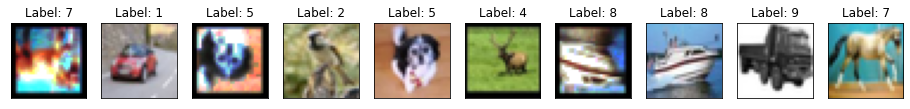

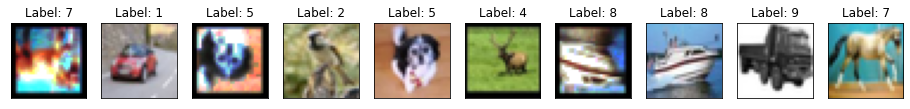

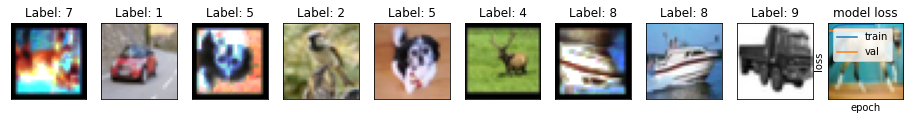

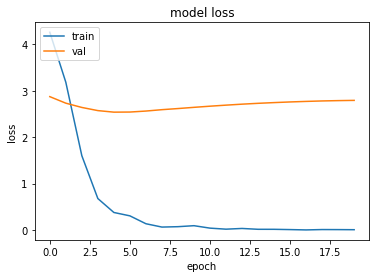

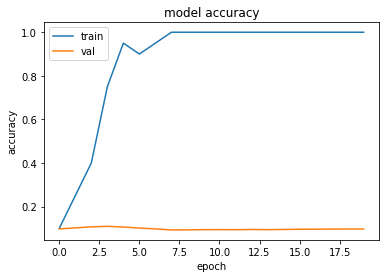

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  3  when Val Acc was:  0.10899999737739563
Epoch when val-loss was min:  4  Val Loss was:  2.540973424911499
TestLoss:  2.539966106414795  TestAcc: 0.10989999771118164
Run:  27
Dropout is:  0.6
Shift X: ( 0.0 , 0.0 ) or ( -0.0 , -0.0 )
Shift Y: ( 0.125 , 0.125 )or ( -0.125 , -0.125 )
Gamma: ( 100 , 100 )
ZoomOut: ( -0.16 , -0.16 )
ZoomIn: ( 0.16 , 0.16 )
Noise: ( 24 , 24 )
blur: ( 7 , 7 )
sharp: ( 0.0 , 0.0 )
Contrast: ( 0.1 , 0.1 )
Bright: ( 0.0 , 0.0 )
Darken: ( -0.0 , -0.0 )
Rotate: ( 0 , 0 ) or ( 0 , 0 )
pHorizontalFlip:  0
pVerticalFlip:  1
pEqualize:  1
pFancyPCA:  1
pChannelShuffle:  0
pElasticTransform:  0
pToGray:  1
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 1s 1s/step - loss: 6.6459 - accuracy: 0.0500 - val_loss: 2.8704 - val_accuracy: 0.0992
Epoch 2/100
1/1 [==============================] 

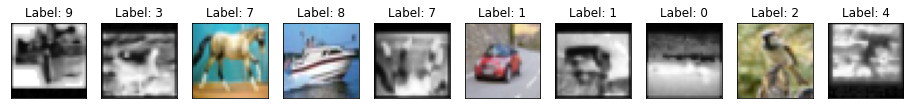

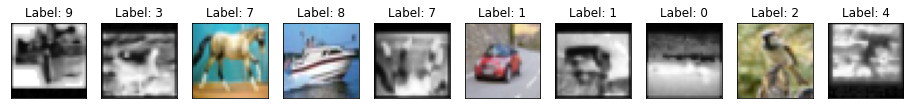

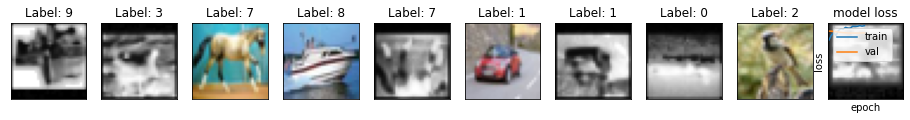

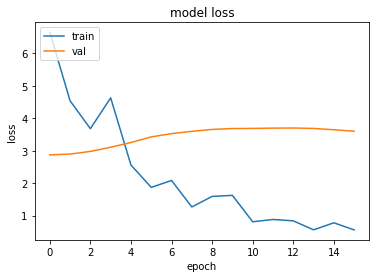

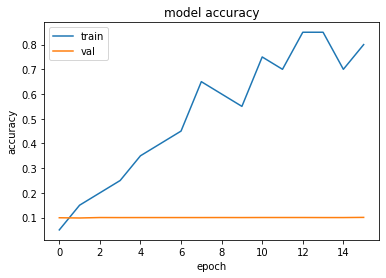

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  15  when Val Acc was:  0.1006999984383583
Epoch when val-loss was min:  0  Val Loss was:  2.8704123497009277
TestLoss:  2.8817996978759766  TestAcc: 0.09749999642372131
Run:  28
Dropout is:  0.6
Shift X: ( 0.125 , 0.125 ) or ( -0.125 , -0.125 )
Shift Y: ( 0.0 , 0.0 )or ( -0.0 , -0.0 )
Gamma: ( 120 , 120 )
ZoomOut: ( -0.16 , -0.16 )
ZoomIn: ( 0.16 , 0.16 )
Noise: ( 0 , 0 )
blur: ( 7 , 7 )
sharp: ( 0.1 , 0.1 )
Contrast: ( 0.0 , 0.0 )
Bright: ( 0.0 , 0.0 )
Darken: ( -0.0 , -0.0 )
Rotate: ( 0 , 0 ) or ( 0 , 0 )
pHorizontalFlip:  0
pVerticalFlip:  1
pEqualize:  0
pFancyPCA:  0
pChannelShuffle:  1
pElasticTransform:  1
pToGray:  0
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 6.1826 - accuracy: 0.1000 - val_loss: 3.3914 - val_accuracy: 0.1003
Epoch 2/100
1/1 [==============================] 

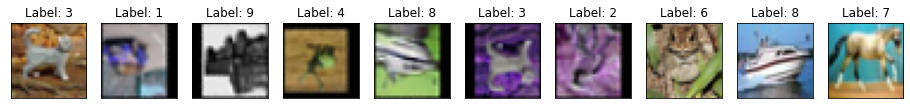

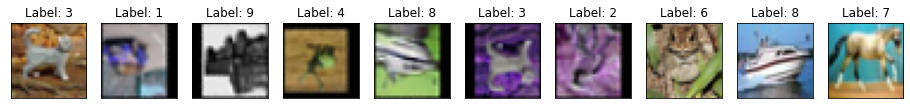

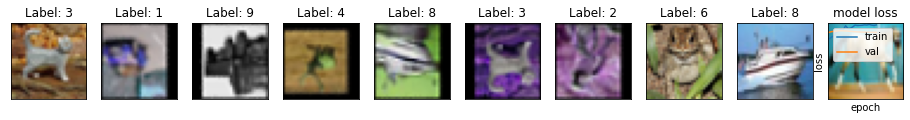

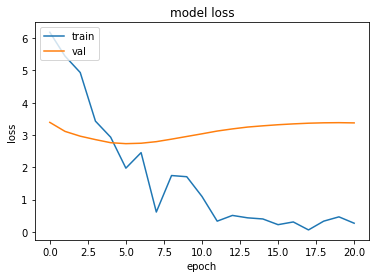

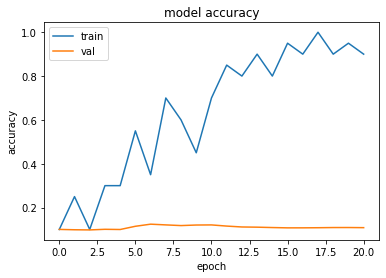

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  6  when Val Acc was:  0.1242000013589859
Epoch when val-loss was min:  5  Val Loss was:  2.731825113296509
TestLoss:  2.7390239238739014  TestAcc: 0.11389999836683273
Run:  29
Dropout is:  0.4
Shift X: ( 0.0 , 0.0 ) or ( -0.0 , -0.0 )
Shift Y: ( 0.125 , 0.125 )or ( -0.125 , -0.125 )
Gamma: ( 120 , 120 )
ZoomOut: ( -0.0 , -0.0 )
ZoomIn: ( 0.16 , 0.16 )
Noise: ( 24 , 24 )
blur: ( 0 , 1 )
sharp: ( 0.1 , 0.1 )
Contrast: ( 0.0 , 0.0 )
Bright: ( 0.2 , 0.2 )
Darken: ( -0.2 , -0.2 )
Rotate: ( 0 , 0 ) or ( 0 , 0 )
pHorizontalFlip:  0
pVerticalFlip:  1
pEqualize:  0
pFancyPCA:  1
pChannelShuffle:  1
pElasticTransform:  1
pToGray:  0
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 1s 1s/step - loss: 3.3821 - accuracy: 0.2500 - val_loss: 2.7836 - val_accuracy: 0.0983
Epoch 2/100
1/1 [==============================] - 

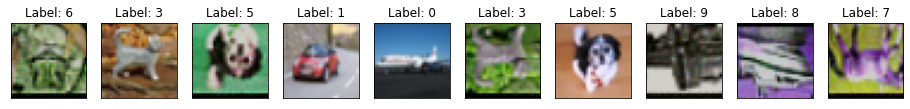

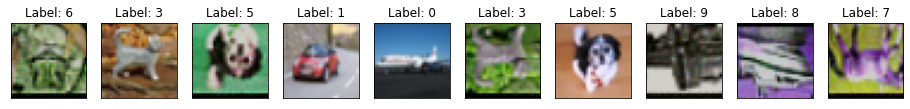

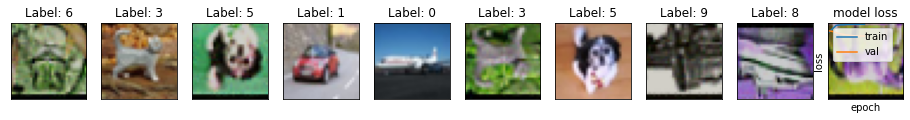

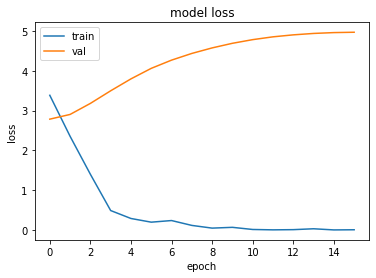

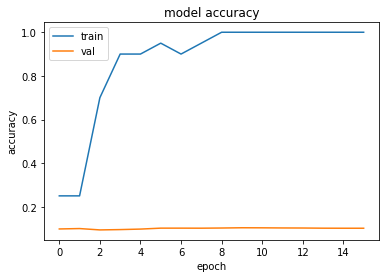

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  9  when Val Acc was:  0.10379999876022339
Epoch when val-loss was min:  0  Val Loss was:  2.7836475372314453
TestLoss:  2.7854256629943848  TestAcc: 0.09700000286102295
Run:  30
Dropout is:  0.4
Shift X: ( 0.0 , 0.0 ) or ( -0.0 , -0.0 )
Shift Y: ( 0.0 , 0.0 )or ( -0.0 , -0.0 )
Gamma: ( 100 , 100 )
ZoomOut: ( -0.16 , -0.16 )
ZoomIn: ( 0.16 , 0.16 )
Noise: ( 24 , 24 )
blur: ( 0 , 1 )
sharp: ( 0.05 , 0.05 )
Contrast: ( 0.2 , 0.2 )
Bright: ( 0.0 , 0.0 )
Darken: ( -0.2 , -0.2 )
Rotate: ( 14 , 14 ) or ( -14 , -14 )
pHorizontalFlip:  0
pVerticalFlip:  0
pEqualize:  0
pFancyPCA:  1
pChannelShuffle:  0
pElasticTransform:  1
pToGray:  0
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 4.2520 - accuracy: 0.1000 - val_loss: 2.7615 - val_accuracy: 0.0970
Epoch 2/100
1/1 [==============================

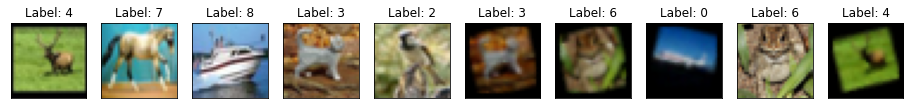

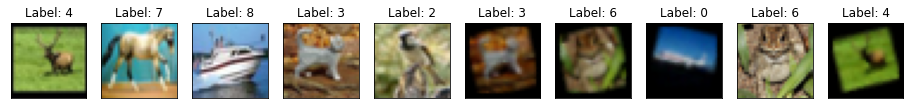

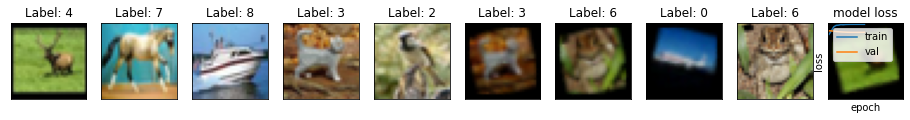

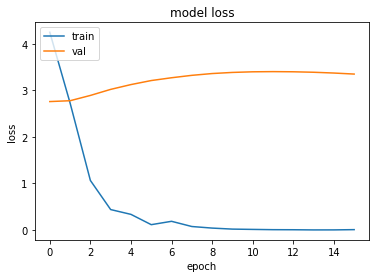

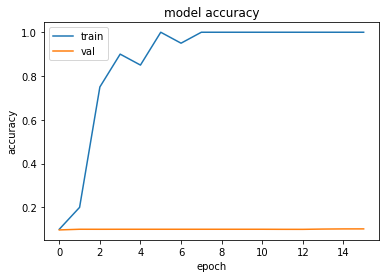

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  15  when Val Acc was:  0.10170000046491623
Epoch when val-loss was min:  0  Val Loss was:  2.7615339756011963
TestLoss:  2.7635059356689453  TestAcc: 0.09749999642372131


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Download attempted :  Fri, 05 November 2021 20:31:25
Run:  31
Dropout is:  0.6
Shift X: ( 0.125 , 0.125 ) or ( -0.125 , -0.125 )
Shift Y: ( 0.125 , 0.125 )or ( -0.125 , -0.125 )
Gamma: ( 120 , 120 )
ZoomOut: ( -0.16 , -0.16 )
ZoomIn: ( 0.0 , 0.0 )
Noise: ( 24 , 24 )
blur: ( 7 , 7 )
sharp: ( 0.0 , 0.0 )
Contrast: ( 0.0 , 0.0 )
Bright: ( 0.2 , 0.2 )
Darken: ( -0.0 , -0.0 )
Rotate: ( 14 , 14 ) or ( -14 , -14 )
pHorizontalFlip:  0
pVerticalFlip:  0
pEqualize:  0
pFancyPCA:  1
pChannelShuffle:  0
pElasticTransform:  1
pToGray:  0
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 5.1332 - accuracy: 0.1500 - val_loss: 2.8239 - val_accuracy: 0.0953
Epoch 2/100
1/1 [==============================] - 1s 523ms/step - loss: 2.9766 - accuracy: 0.3000 - val_loss: 2.7613 - val_accuracy: 0.0934
Epoch 3/100
1/1 [==============================] - 1s 540ms/step - loss: 3.6117 - accuracy: 0.4500 - val_loss: 2

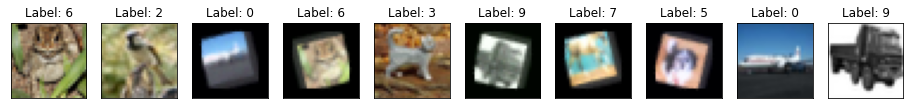

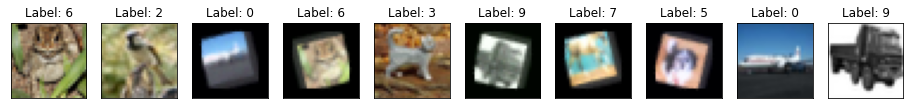

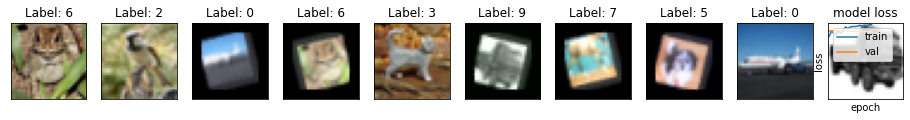

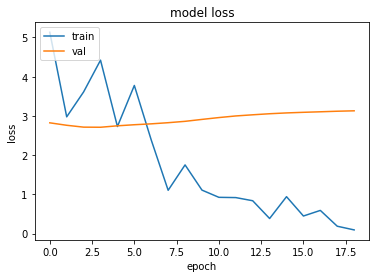

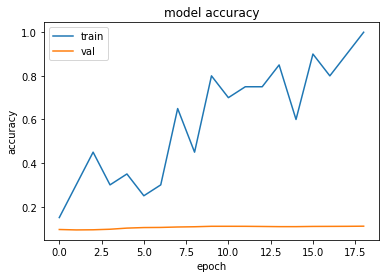

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  18  when Val Acc was:  0.11050000041723251
Epoch when val-loss was min:  3  Val Loss was:  2.710918664932251
TestLoss:  2.71085262298584  TestAcc: 0.09939999878406525
Run:  32
Dropout is:  0.4
Shift X: ( 0.125 , 0.125 ) or ( -0.125 , -0.125 )
Shift Y: ( 0.0 , 0.0 )or ( -0.0 , -0.0 )
Gamma: ( 120 , 120 )
ZoomOut: ( -0.16 , -0.16 )
ZoomIn: ( 0.16 , 0.16 )
Noise: ( 0 , 0 )
blur: ( 0 , 1 )
sharp: ( 0.1 , 0.1 )
Contrast: ( 0.0 , 0.0 )
Bright: ( 0.0 , 0.0 )
Darken: ( -0.1 , -0.1 )
Rotate: ( 14 , 14 ) or ( -14 , -14 )
pHorizontalFlip:  0
pVerticalFlip:  1
pEqualize:  1
pFancyPCA:  1
pChannelShuffle:  0
pElasticTransform:  0
pToGray:  1
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 3.5689 - accuracy: 0.2500 - val_loss: 3.0674 - val_accuracy: 0.1062
Epoch 2/100
1/1 [============================

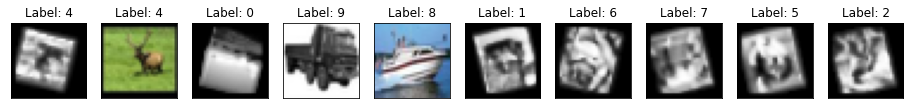

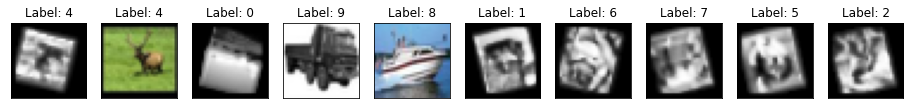

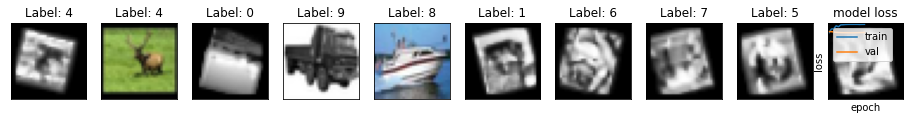

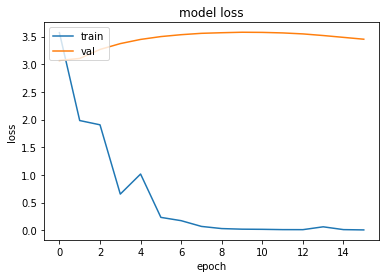

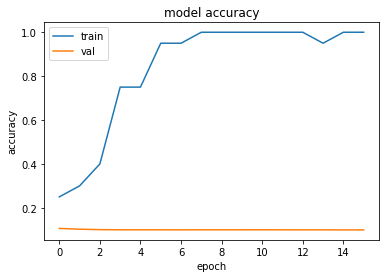

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  0  when Val Acc was:  0.10620000213384628
Epoch when val-loss was min:  0  Val Loss was:  3.0674352645874023
TestLoss:  3.0746657848358154  TestAcc: 0.10740000009536743
Run:  33
Dropout is:  0.6
Shift X: ( 0.0 , 0.0 ) or ( -0.0 , -0.0 )
Shift Y: ( 0.0 , 0.0 )or ( -0.0 , -0.0 )
Gamma: ( 120 , 120 )
ZoomOut: ( -0.0 , -0.0 )
ZoomIn: ( 0.0 , 0.0 )
Noise: ( 24 , 24 )
blur: ( 0 , 1 )
sharp: ( 0.0 , 0.0 )
Contrast: ( 0.2 , 0.2 )
Bright: ( 0.0 , 0.0 )
Darken: ( -0.0 , -0.0 )
Rotate: ( 14 , 14 ) or ( -14 , -14 )
pHorizontalFlip:  0
pVerticalFlip:  1
pEqualize:  1
pFancyPCA:  0
pChannelShuffle:  1
pElasticTransform:  1
pToGray:  1
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 7.6914 - accuracy: 0.0000e+00 - val_loss: 3.6902 - val_accuracy: 0.0991
Epoch 2/100
1/1 [==============================] 

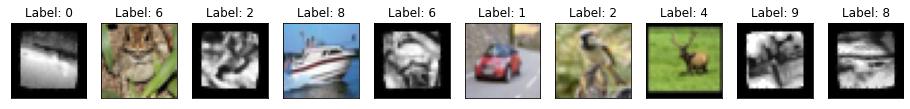

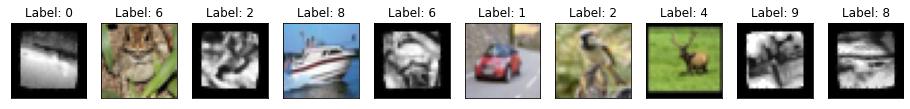

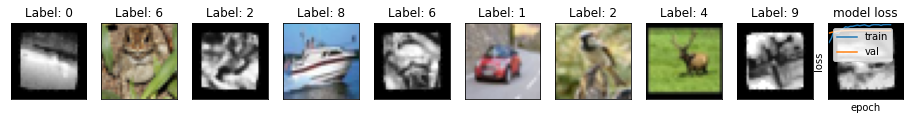

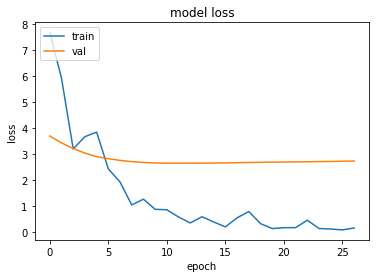

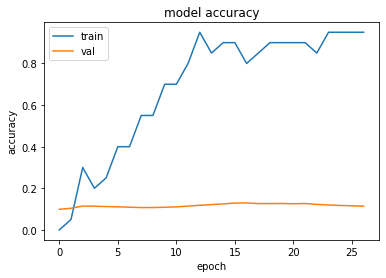

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  16  when Val Acc was:  0.12950000166893005
Epoch when val-loss was min:  11  Val Loss was:  2.6433441638946533
TestLoss:  2.6493964195251465  TestAcc: 0.11649999767541885
Run:  34
Dropout is:  0.6
Shift X: ( 0.0 , 0.0 ) or ( -0.0 , -0.0 )
Shift Y: ( 0.0 , 0.0 )or ( -0.0 , -0.0 )
Gamma: ( 120 , 120 )
ZoomOut: ( -0.16 , -0.16 )
ZoomIn: ( 0.0 , 0.0 )
Noise: ( 24 , 24 )
blur: ( 0 , 1 )
sharp: ( 0.1 , 0.1 )
Contrast: ( 0.0 , 0.0 )
Bright: ( 0.2 , 0.2 )
Darken: ( -0.2 , -0.2 )
Rotate: ( 0 , 0 ) or ( 0 , 0 )
pHorizontalFlip:  1
pVerticalFlip:  0
pEqualize:  1
pFancyPCA:  0
pChannelShuffle:  0
pElasticTransform:  0
pToGray:  0
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 6.0615 - accuracy: 0.1000 - val_loss: 3.0318 - val_accuracy: 0.1008
Epoch 2/100
1/1 [==============================] - 0s 4

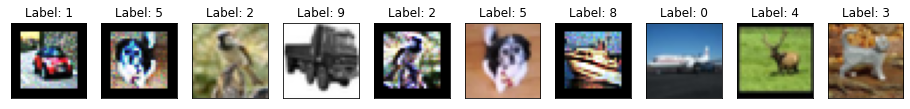

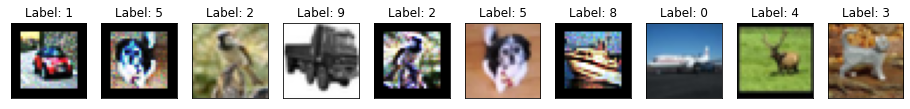

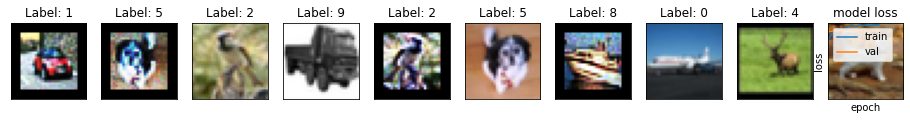

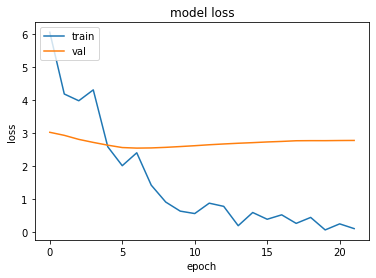

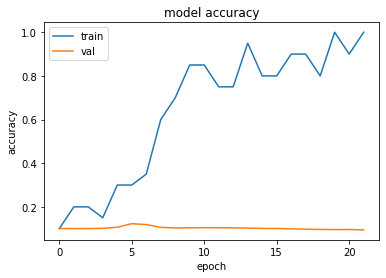

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  5  when Val Acc was:  0.12300000339746475
Epoch when val-loss was min:  6  Val Loss was:  2.55306339263916
TestLoss:  2.552203893661499  TestAcc: 0.12070000171661377
Run:  35
Dropout is:  0.4
Shift X: ( 0.0 , 0.0 ) or ( -0.0 , -0.0 )
Shift Y: ( 0.125 , 0.125 )or ( -0.125 , -0.125 )
Gamma: ( 120 , 120 )
ZoomOut: ( -0.16 , -0.16 )
ZoomIn: ( 0.16 , 0.16 )
Noise: ( 12 , 12 )
blur: ( 0 , 1 )
sharp: ( 0.0 , 0.0 )
Contrast: ( 0.0 , 0.0 )
Bright: ( 0.0 , 0.0 )
Darken: ( -0.0 , -0.0 )
Rotate: ( 14 , 14 ) or ( -14 , -14 )
pHorizontalFlip:  1
pVerticalFlip:  0
pEqualize:  1
pFancyPCA:  0
pChannelShuffle:  1
pElasticTransform:  1
pToGray:  0
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 1s 1s/step - loss: 4.3831 - accuracy: 0.0500 - val_loss: 2.8959 - val_accuracy: 0.1089
Epoch 2/100
1/1 [===========================

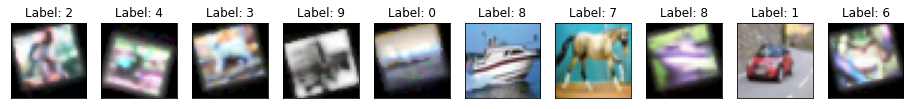

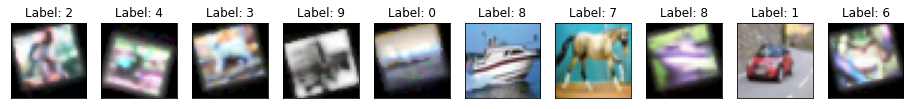

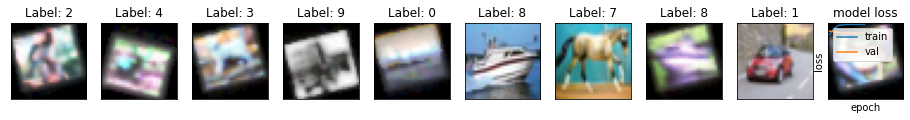

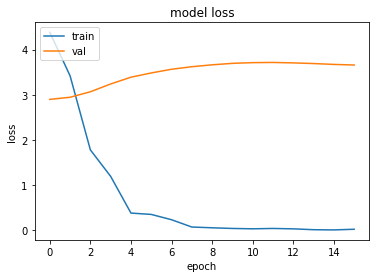

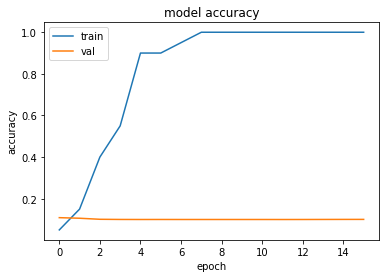

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  0  when Val Acc was:  0.10890000313520432
Epoch when val-loss was min:  0  Val Loss was:  2.8959124088287354
TestLoss:  2.9016106128692627  TestAcc: 0.10779999941587448
Run:  36
Dropout is:  0.4
Shift X: ( 0.125 , 0.125 ) or ( -0.125 , -0.125 )
Shift Y: ( 0.0 , 0.0 )or ( -0.0 , -0.0 )
Gamma: ( 120 , 120 )
ZoomOut: ( -0.0 , -0.0 )
ZoomIn: ( 0.0 , 0.0 )
Noise: ( 0 , 0 )
blur: ( 0 , 1 )
sharp: ( 0.1 , 0.1 )
Contrast: ( 0.1 , 0.1 )
Bright: ( 0.2 , 0.2 )
Darken: ( -0.2 , -0.2 )
Rotate: ( 14 , 14 ) or ( -14 , -14 )
pHorizontalFlip:  1
pVerticalFlip:  0
pEqualize:  0
pFancyPCA:  0
pChannelShuffle:  1
pElasticTransform:  1
pToGray:  0
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 4.8716 - accuracy: 0.0000e+00 - val_loss: 2.8862 - val_accuracy: 0.0983
Epoch 2/100
1/1 [==========================

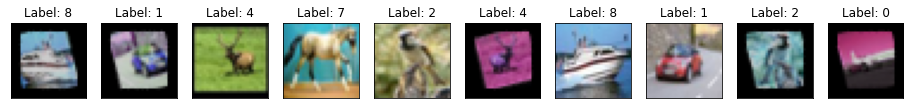

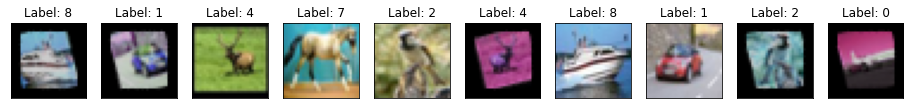

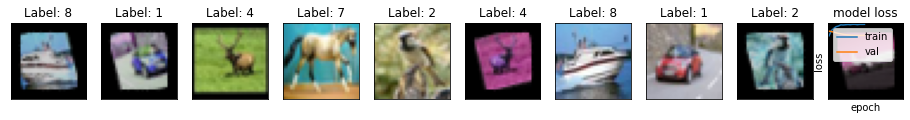

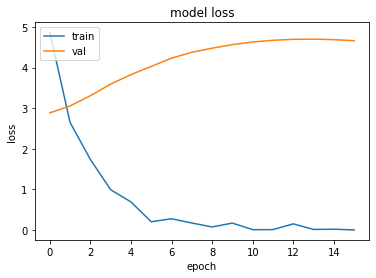

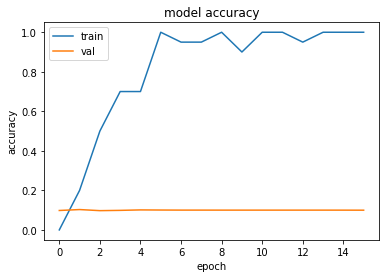

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  1  when Val Acc was:  0.10300000011920929
Epoch when val-loss was min:  0  Val Loss was:  2.886220932006836
TestLoss:  2.894465446472168  TestAcc: 0.09730000048875809
Run:  37
Dropout is:  0.6
Shift X: ( 0.125 , 0.125 ) or ( -0.125 , -0.125 )
Shift Y: ( 0.125 , 0.125 )or ( -0.125 , -0.125 )
Gamma: ( 120 , 120 )
ZoomOut: ( -0.0 , -0.0 )
ZoomIn: ( 0.0 , 0.0 )
Noise: ( 0 , 0 )
blur: ( 7 , 7 )
sharp: ( 0.05 , 0.05 )
Contrast: ( 0.0 , 0.0 )
Bright: ( 0.2 , 0.2 )
Darken: ( -0.0 , -0.0 )
Rotate: ( 0 , 0 ) or ( 0 , 0 )
pHorizontalFlip:  1
pVerticalFlip:  1
pEqualize:  1
pFancyPCA:  0
pChannelShuffle:  1
pElasticTransform:  0
pToGray:  1
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 7.0398 - accuracy: 0.0500 - val_loss: 2.8797 - val_accuracy: 0.0883
Epoch 2/100
1/1 [============================

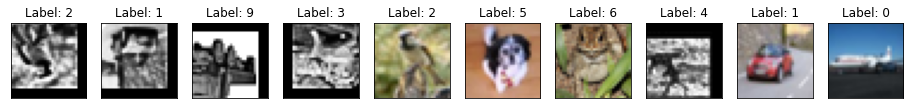

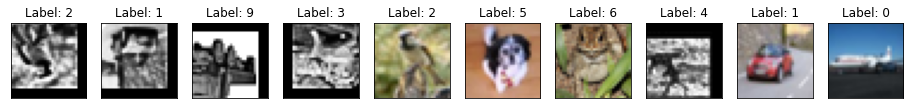

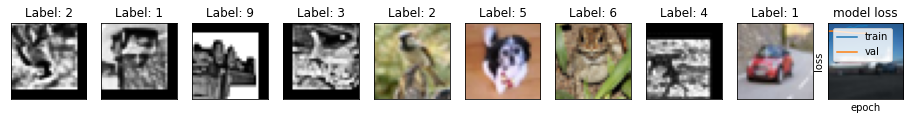

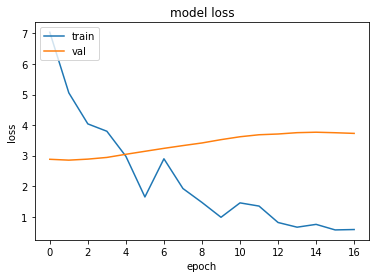

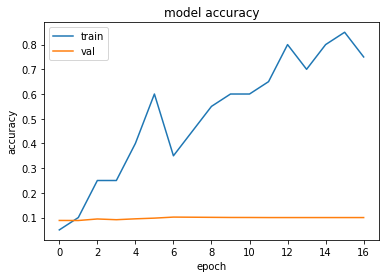

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  6  when Val Acc was:  0.10189999639987946
Epoch when val-loss was min:  1  Val Loss was:  2.851362705230713
TestLoss:  2.859180450439453  TestAcc: 0.09260000288486481
Run:  38
Dropout is:  0.6
Shift X: ( 0.0 , 0.0 ) or ( -0.0 , -0.0 )
Shift Y: ( 0.125 , 0.125 )or ( -0.125 , -0.125 )
Gamma: ( 100 , 100 )
ZoomOut: ( -0.0 , -0.0 )
ZoomIn: ( 0.0 , 0.0 )
Noise: ( 24 , 24 )
blur: ( 7 , 7 )
sharp: ( 0.0 , 0.0 )
Contrast: ( 0.2 , 0.2 )
Bright: ( 0.2 , 0.2 )
Darken: ( -0.1 , -0.1 )
Rotate: ( 0 , 0 ) or ( 0 , 0 )
pHorizontalFlip:  1
pVerticalFlip:  0
pEqualize:  0
pFancyPCA:  0
pChannelShuffle:  1
pElasticTransform:  1
pToGray:  0
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 5.8453 - accuracy: 0.0000e+00 - val_loss: 2.7223 - val_accuracy: 0.0944
Epoch 2/100
1/1 [==============================] 

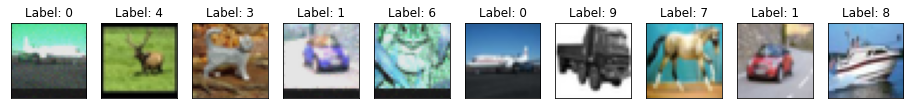

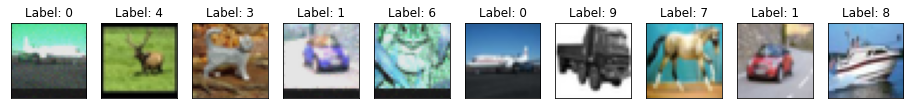

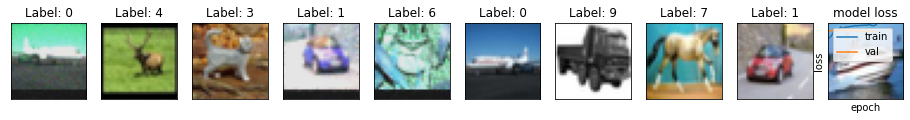

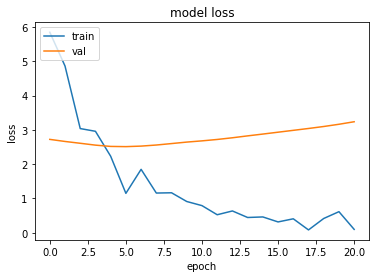

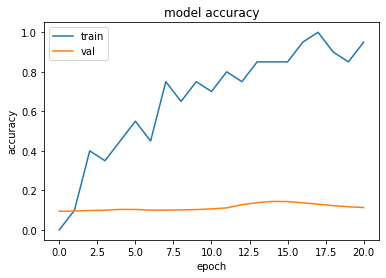

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  14  when Val Acc was:  0.14419999718666077
Epoch when val-loss was min:  5  Val Loss was:  2.5109102725982666
TestLoss:  2.513685941696167  TestAcc: 0.10409999638795853
Run:  39
Dropout is:  0.4
Shift X: ( 0.0 , 0.0 ) or ( -0.0 , -0.0 )
Shift Y: ( 0.125 , 0.125 )or ( -0.125 , -0.125 )
Gamma: ( 120 , 120 )
ZoomOut: ( -0.0 , -0.0 )
ZoomIn: ( 0.0 , 0.0 )
Noise: ( 0 , 0 )
blur: ( 7 , 7 )
sharp: ( 0.1 , 0.1 )
Contrast: ( 0.2 , 0.2 )
Bright: ( 0.0 , 0.0 )
Darken: ( -0.0 , -0.0 )
Rotate: ( 14 , 14 ) or ( -14 , -14 )
pHorizontalFlip:  1
pVerticalFlip:  1
pEqualize:  0
pFancyPCA:  1
pChannelShuffle:  0
pElasticTransform:  0
pToGray:  0
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 4.9437 - accuracy: 0.0500 - val_loss: 2.5804 - val_accuracy: 0.1006
Epoch 2/100
1/1 [==============================

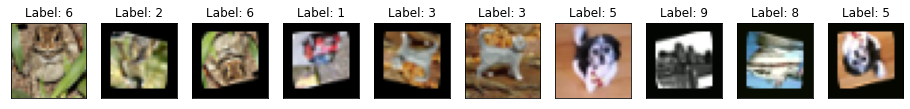

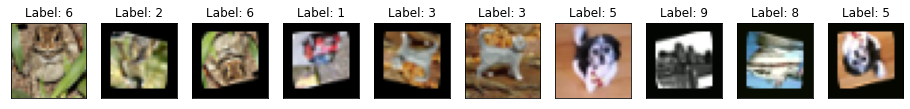

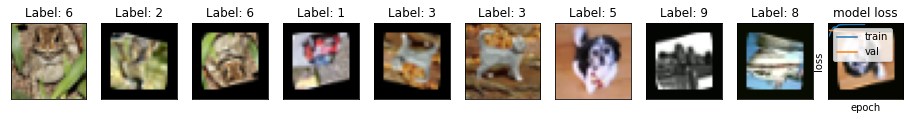

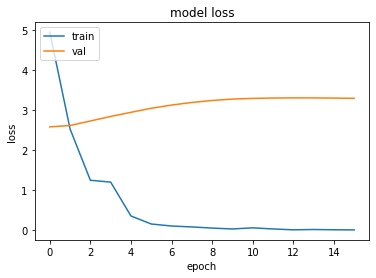

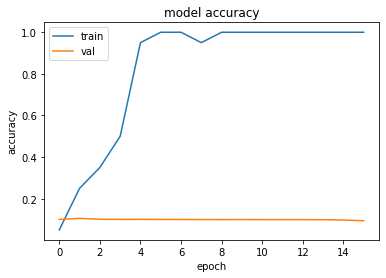

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  1  when Val Acc was:  0.1054999977350235
Epoch when val-loss was min:  0  Val Loss was:  2.580355644226074
TestLoss:  2.5771420001983643  TestAcc: 0.10239999741315842
Run:  40
Dropout is:  0.4
Shift X: ( 0.0 , 0.0 ) or ( -0.0 , -0.0 )
Shift Y: ( 0.125 , 0.125 )or ( -0.125 , -0.125 )
Gamma: ( 100 , 100 )
ZoomOut: ( -0.0 , -0.0 )
ZoomIn: ( 0.0 , 0.0 )
Noise: ( 24 , 24 )
blur: ( 0 , 1 )
sharp: ( 0.0 , 0.0 )
Contrast: ( 0.2 , 0.2 )
Bright: ( 0.2 , 0.2 )
Darken: ( -0.2 , -0.2 )
Rotate: ( 14 , 14 ) or ( -14 , -14 )
pHorizontalFlip:  1
pVerticalFlip:  0
pEqualize:  1
pFancyPCA:  1
pChannelShuffle:  0
pElasticTransform:  0
pToGray:  1
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 4.5440 - accuracy: 0.0500 - val_loss: 2.8037 - val_accuracy: 0.0995
Epoch 2/100
1/1 [==============================

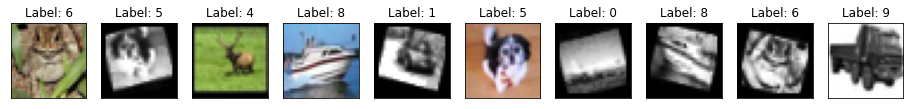

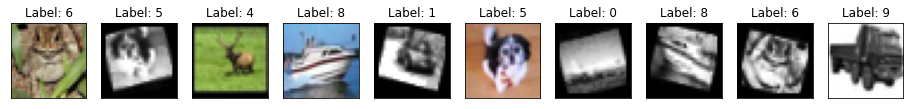

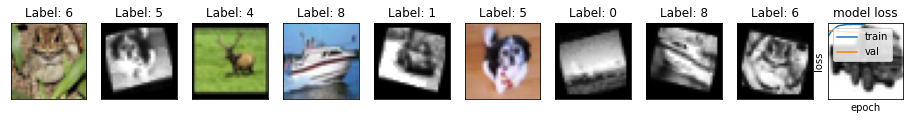

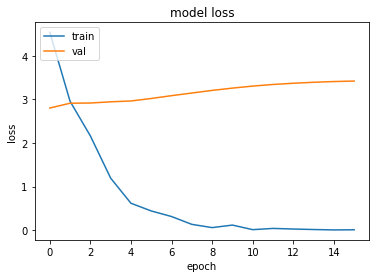

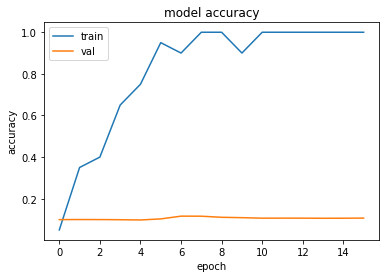

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  6  when Val Acc was:  0.11620000004768372
Epoch when val-loss was min:  0  Val Loss was:  2.803661823272705
TestLoss:  2.801372766494751  TestAcc: 0.0997999981045723


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Download attempted :  Fri, 05 November 2021 20:35:25
Run:  41
Dropout is:  0.6
Shift X: ( 0.125 , 0.125 ) or ( -0.125 , -0.125 )
Shift Y: ( 0.0 , 0.0 )or ( -0.0 , -0.0 )
Gamma: ( 100 , 100 )
ZoomOut: ( -0.16 , -0.16 )
ZoomIn: ( 0.0 , 0.0 )
Noise: ( 0 , 0 )
blur: ( 7 , 7 )
sharp: ( 0.0 , 0.0 )
Contrast: ( 0.2 , 0.2 )
Bright: ( 0.0 , 0.0 )
Darken: ( -0.0 , -0.0 )
Rotate: ( 14 , 14 ) or ( -14 , -14 )
pHorizontalFlip:  1
pVerticalFlip:  0
pEqualize:  1
pFancyPCA:  0
pChannelShuffle:  0
pElasticTransform:  0
pToGray:  1
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 5.3052 - accuracy: 0.0000e+00 - val_loss: 3.4855 - val_accuracy: 0.0984
Epoch 2/100
1/1 [==============================] - 1s 518ms/step - loss: 4.8522 - accuracy: 0.0500 - val_loss: 3.4336 - val_accuracy: 0.0994
Epoch 3/100
1/1 [==============================] - 1s 528ms/step - loss: 3.5123 - accuracy: 0.3000 - val_loss: 3.3831 

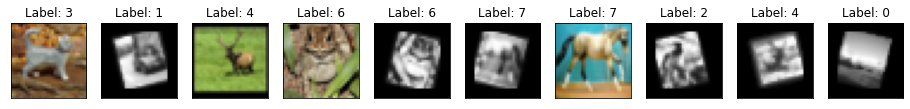

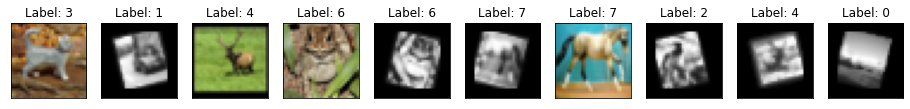

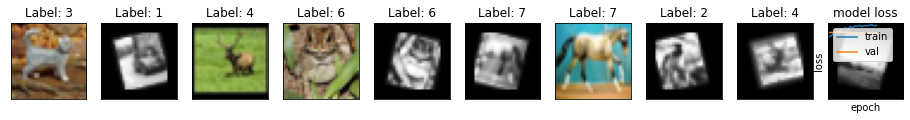

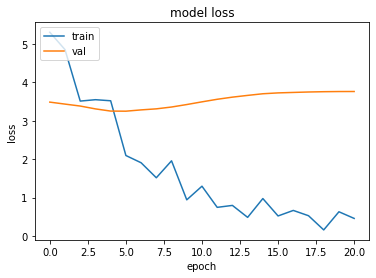

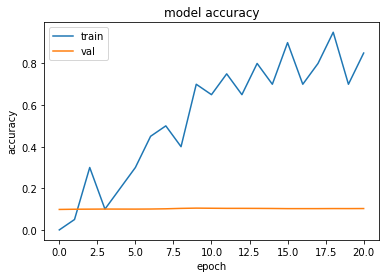

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  9  when Val Acc was:  0.1046999990940094
Epoch when val-loss was min:  5  Val Loss was:  3.249253749847412
TestLoss:  3.263004779815674  TestAcc: 0.10010000318288803
Run:  42
Dropout is:  0.4
Shift X: ( 0.125 , 0.125 ) or ( -0.125 , -0.125 )
Shift Y: ( 0.125 , 0.125 )or ( -0.125 , -0.125 )
Gamma: ( 100 , 100 )
ZoomOut: ( -0.16 , -0.16 )
ZoomIn: ( 0.16 , 0.16 )
Noise: ( 0 , 0 )
blur: ( 7 , 7 )
sharp: ( 0.1 , 0.1 )
Contrast: ( 0.0 , 0.0 )
Bright: ( 0.2 , 0.2 )
Darken: ( -0.2 , -0.2 )
Rotate: ( 0 , 0 ) or ( 0 , 0 )
pHorizontalFlip:  1
pVerticalFlip:  0
pEqualize:  0
pFancyPCA:  1
pChannelShuffle:  0
pElasticTransform:  0
pToGray:  0
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 3.7069 - accuracy: 0.1000 - val_loss: 3.2948 - val_accuracy: 0.1032
Epoch 2/100
1/1 [===========================

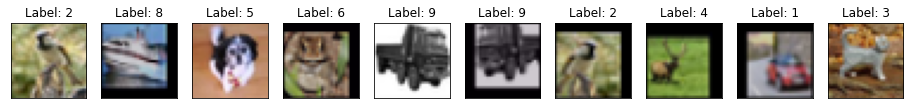

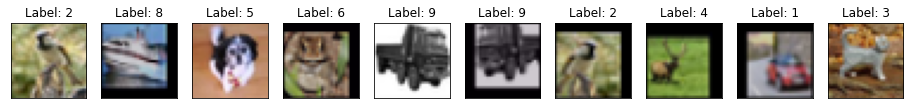

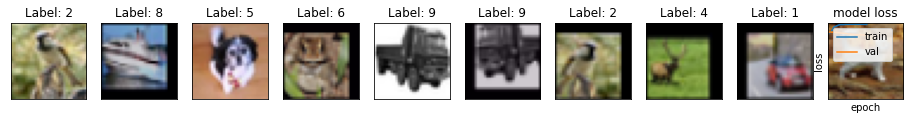

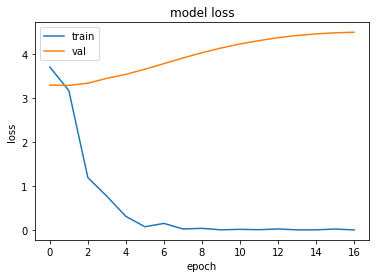

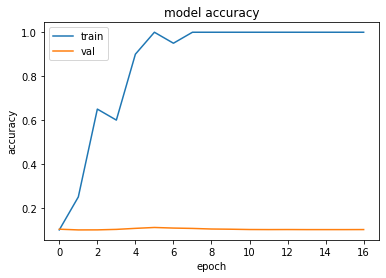

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  5  when Val Acc was:  0.11100000143051147
Epoch when val-loss was min:  1  Val Loss was:  3.2879698276519775
TestLoss:  3.2986090183258057  TestAcc: 0.09920000284910202
Run:  43
Dropout is:  0.4
Shift X: ( 0.125 , 0.125 ) or ( -0.125 , -0.125 )
Shift Y: ( 0.125 , 0.125 )or ( -0.125 , -0.125 )
Gamma: ( 100 , 100 )
ZoomOut: ( -0.0 , -0.0 )
ZoomIn: ( 0.16 , 0.16 )
Noise: ( 0 , 0 )
blur: ( 7 , 7 )
sharp: ( 0.0 , 0.0 )
Contrast: ( 0.2 , 0.2 )
Bright: ( 0.0 , 0.0 )
Darken: ( -0.0 , -0.0 )
Rotate: ( 14 , 14 ) or ( -14 , -14 )
pHorizontalFlip:  0
pVerticalFlip:  1
pEqualize:  0
pFancyPCA:  1
pChannelShuffle:  1
pElasticTransform:  1
pToGray:  1
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 4.5889 - accuracy: 0.2000 - val_loss: 2.5736 - val_accuracy: 0.0951
Epoch 2/100
1/1 [====================

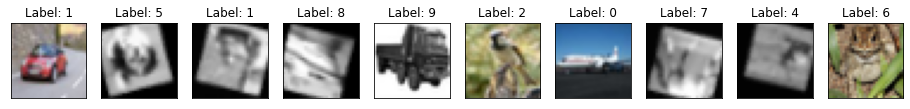

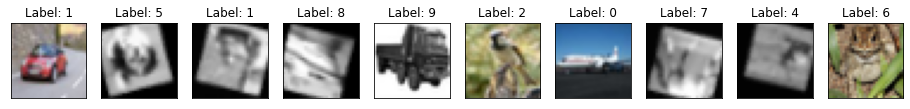

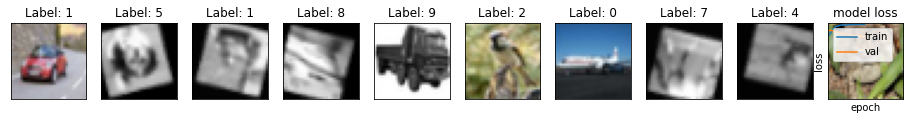

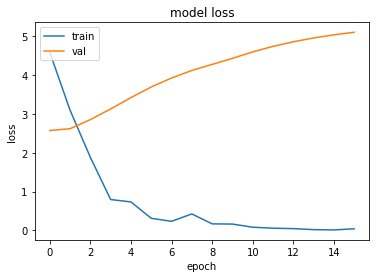

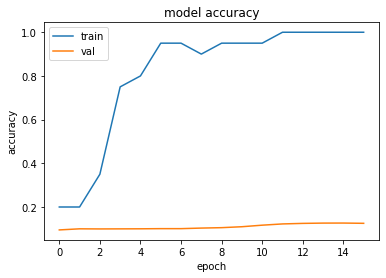

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  14  when Val Acc was:  0.1264999955892563
Epoch when val-loss was min:  0  Val Loss was:  2.57357120513916
TestLoss:  2.572754144668579  TestAcc: 0.09809999912977219
Run:  44
Dropout is:  0.4
Shift X: ( 0.125 , 0.125 ) or ( -0.125 , -0.125 )
Shift Y: ( 0.0 , 0.0 )or ( -0.0 , -0.0 )
Gamma: ( 110 , 110 )
ZoomOut: ( -0.16 , -0.16 )
ZoomIn: ( 0.0 , 0.0 )
Noise: ( 24 , 24 )
blur: ( 0 , 1 )
sharp: ( 0.0 , 0.0 )
Contrast: ( 0.0 , 0.0 )
Bright: ( 0.2 , 0.2 )
Darken: ( -0.0 , -0.0 )
Rotate: ( 14 , 14 ) or ( -14 , -14 )
pHorizontalFlip:  1
pVerticalFlip:  1
pEqualize:  0
pFancyPCA:  1
pChannelShuffle:  1
pElasticTransform:  0
pToGray:  1
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 3.5016 - accuracy: 0.0500 - val_loss: 3.0379 - val_accuracy: 0.1253
Epoch 2/100
1/1 [=============================

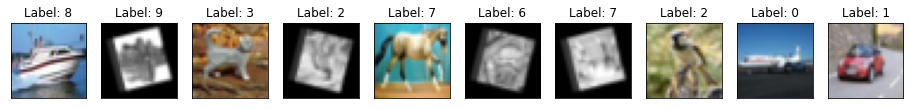

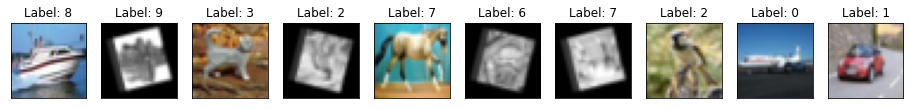

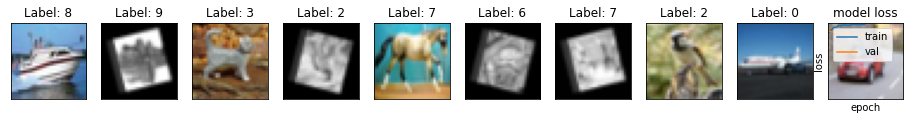

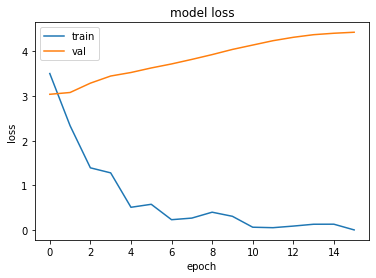

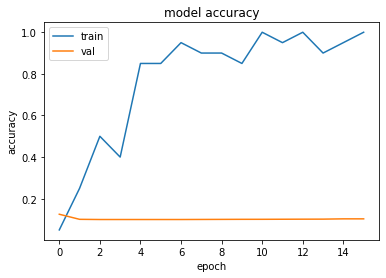

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  0  when Val Acc was:  0.12530000507831573
Epoch when val-loss was min:  0  Val Loss was:  3.0378737449645996
TestLoss:  3.0461838245391846  TestAcc: 0.12489999830722809
Run:  45
Dropout is:  0.4
Shift X: ( 0.0 , 0.0 ) or ( -0.0 , -0.0 )
Shift Y: ( 0.0 , 0.0 )or ( -0.0 , -0.0 )
Gamma: ( 100 , 100 )
ZoomOut: ( -0.0 , -0.0 )
ZoomIn: ( 0.16 , 0.16 )
Noise: ( 0 , 0 )
blur: ( 0 , 1 )
sharp: ( 0.1 , 0.1 )
Contrast: ( 0.2 , 0.2 )
Bright: ( 0.0 , 0.0 )
Darken: ( -0.2 , -0.2 )
Rotate: ( 0 , 0 ) or ( 0 , 0 )
pHorizontalFlip:  1
pVerticalFlip:  1
pEqualize:  1
pFancyPCA:  0
pChannelShuffle:  1
pElasticTransform:  0
pToGray:  1
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 4.1894 - accuracy: 0.1500 - val_loss: 2.9253 - val_accuracy: 0.1003
Epoch 2/100
1/1 [==============================] - 1s 527ms

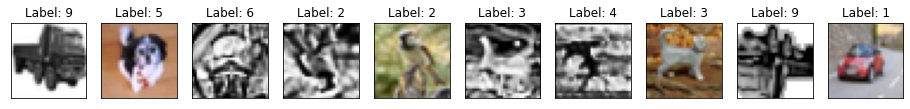

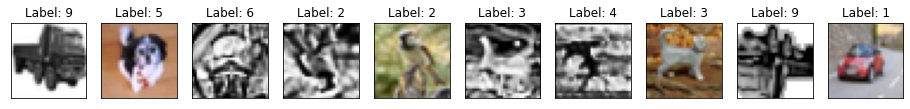

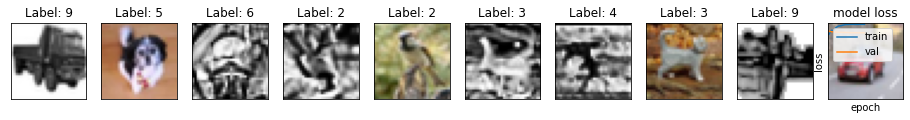

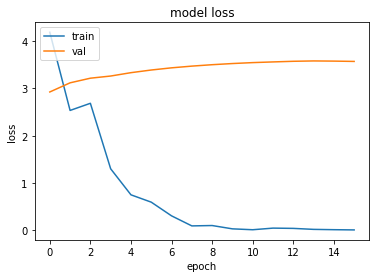

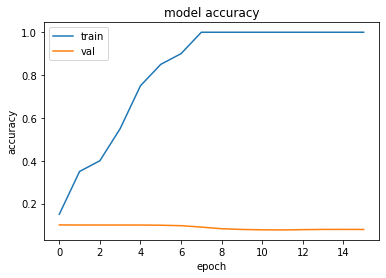

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  0  when Val Acc was:  0.10029999911785126
Epoch when val-loss was min:  0  Val Loss was:  2.9253194332122803
TestLoss:  2.9287819862365723  TestAcc: 0.09910000115633011
Run:  46
Dropout is:  0.6
Shift X: ( 0.125 , 0.125 ) or ( -0.125 , -0.125 )
Shift Y: ( 0.0 , 0.0 )or ( -0.0 , -0.0 )
Gamma: ( 100 , 100 )
ZoomOut: ( -0.16 , -0.16 )
ZoomIn: ( 0.16 , 0.16 )
Noise: ( 24 , 24 )
blur: ( 0 , 1 )
sharp: ( 0.0 , 0.0 )
Contrast: ( 0.0 , 0.0 )
Bright: ( 0.2 , 0.2 )
Darken: ( -0.2 , -0.2 )
Rotate: ( 0 , 0 ) or ( 0 , 0 )
pHorizontalFlip:  0
pVerticalFlip:  0
pEqualize:  1
pFancyPCA:  0
pChannelShuffle:  1
pElasticTransform:  1
pToGray:  1
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 5.9930 - accuracy: 0.0500 - val_loss: 2.8819 - val_accuracy: 0.1042
Epoch 2/100
1/1 [==============================

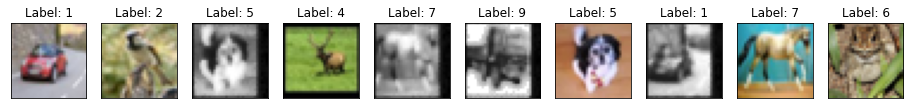

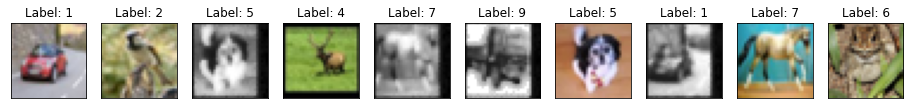

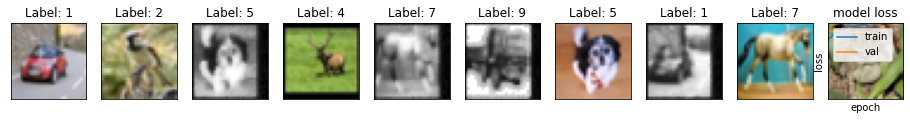

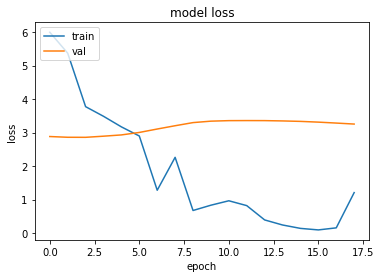

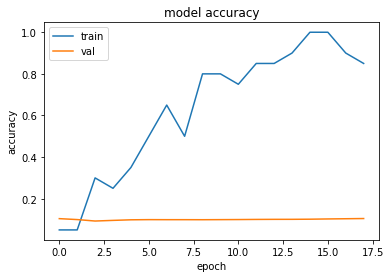

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  17  when Val Acc was:  0.1046999990940094
Epoch when val-loss was min:  2  Val Loss was:  2.8580939769744873
TestLoss:  2.8644704818725586  TestAcc: 0.09619999676942825
Run:  47
Dropout is:  0.4
Shift X: ( 0.125 , 0.125 ) or ( -0.125 , -0.125 )
Shift Y: ( 0.0625 , 0.0625 )or ( -0.0625 , -0.0625 )
Gamma: ( 120 , 120 )
ZoomOut: ( -0.16 , -0.16 )
ZoomIn: ( 0.16 , 0.16 )
Noise: ( 24 , 24 )
blur: ( 7 , 7 )
sharp: ( 0.0 , 0.0 )
Contrast: ( 0.2 , 0.2 )
Bright: ( 0.0 , 0.0 )
Darken: ( -0.2 , -0.2 )
Rotate: ( 0 , 0 ) or ( 0 , 0 )
pHorizontalFlip:  1
pVerticalFlip:  0
pEqualize:  0
pFancyPCA:  0
pChannelShuffle:  1
pElasticTransform:  0
pToGray:  1
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 3.8015 - accuracy: 0.0500 - val_loss: 3.0831 - val_accuracy: 0.0949
Epoch 2/100
1/1 [==================

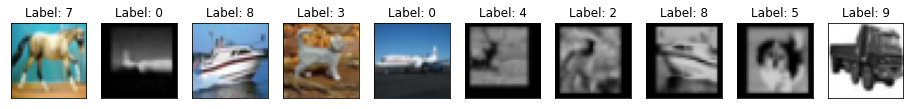

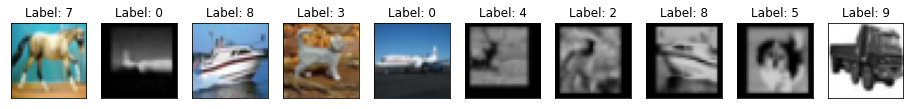

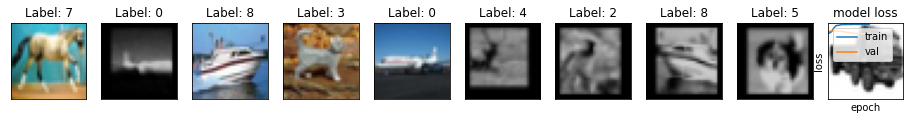

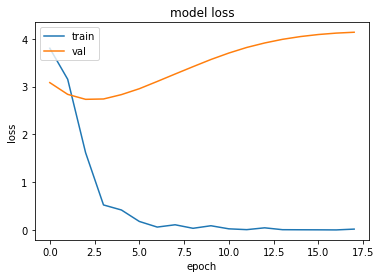

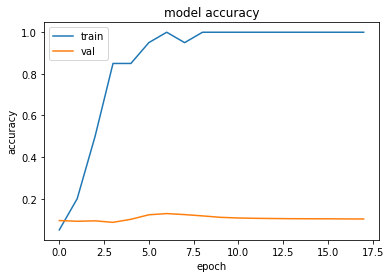

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  6  when Val Acc was:  0.12849999964237213
Epoch when val-loss was min:  2  Val Loss was:  2.7339017391204834
TestLoss:  2.7369065284729004  TestAcc: 0.0940999984741211
Run:  48
Dropout is:  0.6
Shift X: ( 0.0 , 0.0 ) or ( -0.0 , -0.0 )
Shift Y: ( 0.125 , 0.125 )or ( -0.125 , -0.125 )
Gamma: ( 110 , 110 )
ZoomOut: ( -0.0 , -0.0 )
ZoomIn: ( 0.16 , 0.16 )
Noise: ( 0 , 0 )
blur: ( 7 , 7 )
sharp: ( 0.1 , 0.1 )
Contrast: ( 0.2 , 0.2 )
Bright: ( 0.0 , 0.0 )
Darken: ( -0.2 , -0.2 )
Rotate: ( 0 , 0 ) or ( 0 , 0 )
pHorizontalFlip:  0
pVerticalFlip:  0
pEqualize:  1
pFancyPCA:  0
pChannelShuffle:  0
pElasticTransform:  1
pToGray:  0
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 5.7000 - accuracy: 0.0500 - val_loss: 2.7778 - val_accuracy: 0.1003
Epoch 2/100
1/1 [==============================] - 1

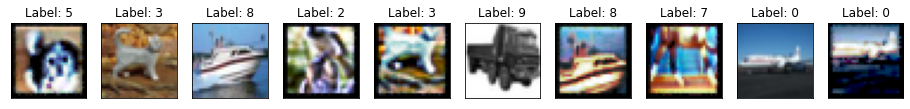

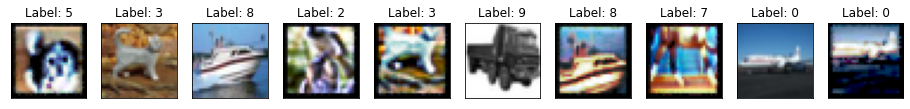

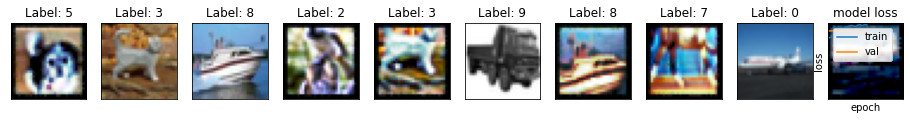

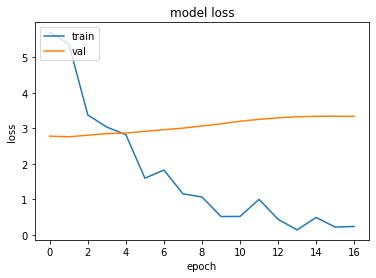

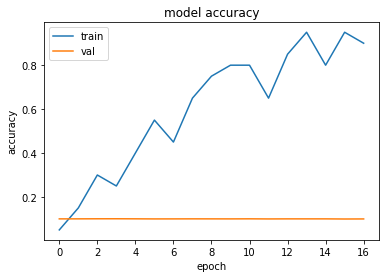

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  3  when Val Acc was:  0.10080000013113022
Epoch when val-loss was min:  1  Val Loss was:  2.7596848011016846
TestLoss:  2.7659900188446045  TestAcc: 0.10010000318288803
Run:  49
Dropout is:  0.6
Shift X: ( 0.125 , 0.125 ) or ( -0.125 , -0.125 )
Shift Y: ( 0.0 , 0.0 )or ( -0.0 , -0.0 )
Gamma: ( 100 , 100 )
ZoomOut: ( -0.0 , -0.0 )
ZoomIn: ( 0.0 , 0.0 )
Noise: ( 12 , 12 )
blur: ( 7 , 7 )
sharp: ( 0.1 , 0.1 )
Contrast: ( 0.2 , 0.2 )
Bright: ( 0.2 , 0.2 )
Darken: ( -0.2 , -0.2 )
Rotate: ( 0 , 0 ) or ( 0 , 0 )
pHorizontalFlip:  0
pVerticalFlip:  1
pEqualize:  0
pFancyPCA:  1
pChannelShuffle:  0
pElasticTransform:  0
pToGray:  1
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 5.3431 - accuracy: 0.0000e+00 - val_loss: 2.7431 - val_accuracy: 0.1006
Epoch 2/100
1/1 [==============================

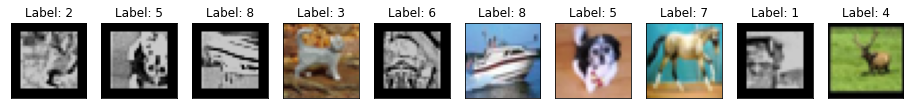

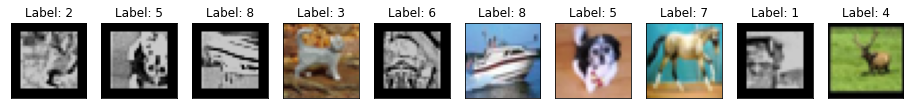

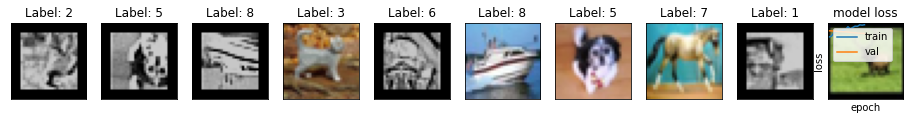

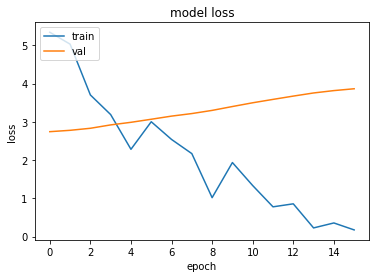

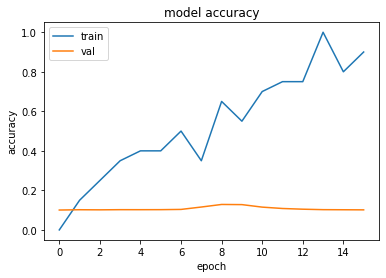

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  8  when Val Acc was:  0.12880000472068787
Epoch when val-loss was min:  0  Val Loss was:  2.743104934692383
TestLoss:  2.753591299057007  TestAcc: 0.09749999642372131
Run:  50
Dropout is:  0.6
Shift X: ( 0.0 , 0.0 ) or ( -0.0 , -0.0 )
Shift Y: ( 0.0625 , 0.0625 )or ( -0.0625 , -0.0625 )
Gamma: ( 100 , 100 )
ZoomOut: ( -0.0 , -0.0 )
ZoomIn: ( 0.0 , 0.0 )
Noise: ( 0 , 0 )
blur: ( 0 , 1 )
sharp: ( 0.1 , 0.1 )
Contrast: ( 0.0 , 0.0 )
Bright: ( 0.2 , 0.2 )
Darken: ( -0.0 , -0.0 )
Rotate: ( 14 , 14 ) or ( -14 , -14 )
pHorizontalFlip:  0
pVerticalFlip:  1
pEqualize:  1
pFancyPCA:  1
pChannelShuffle:  0
pElasticTransform:  1
pToGray:  0
<ConcatenateDataset shapes: ((32, 32, 3), ()), types: (tf.float32, tf.int64)>
Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 6.3506 - accuracy: 0.0000e+00 - val_loss: 3.4200 - val_accuracy: 0.1000
Epoch 2/100
1/1 [========================

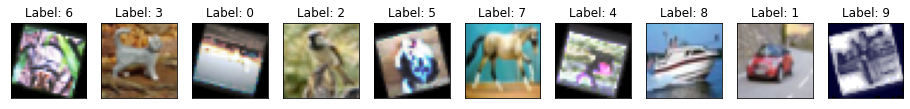

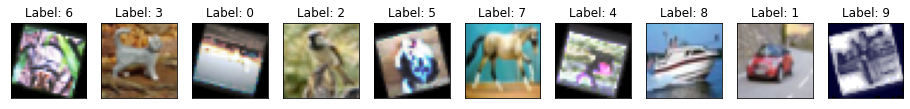

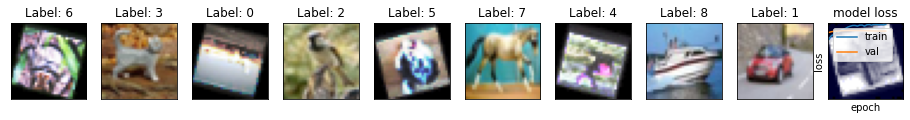

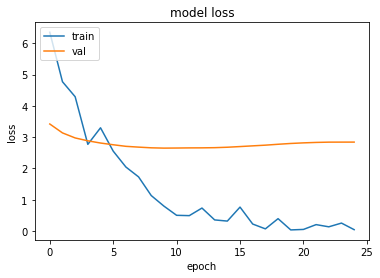

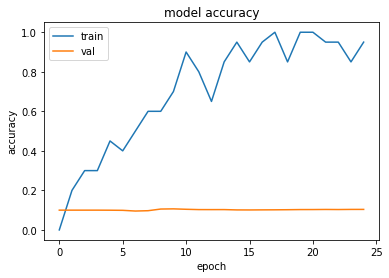

Remember to add the data that Dr. Cox wanted to see here for data-keeping purposes
Early Stop Epoch:  9  when Val Acc was:  0.10649999976158142
Epoch when val-loss was min:  9  Val Loss was:  2.649625301361084
TestLoss:  2.6549997329711914  TestAcc: 0.10429999977350235


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Download attempted :  Fri, 05 November 2021 20:39:18


In [89]:
# The augmented data returns floats between 0 and 1
# The unaugmented data is integers uint8 between 0 and 255 
CLASSES = info.features['label'].names

def cache_prefetch_group(train_tf, SHUFFLE=5000):
    # I choose to shuffle the entire deck, which probably adds time, but I want to ensure mixed unaugmented and augmented
    train_tf = train_tf.shuffle(SHUFFLE, reshuffle_each_iteration=True)  # I took out seed=seed to get variety with each reshuffle
    train_tf = train_tf.cache().prefetch(buffer_size=AUTOTUNE)
    #train_tf = train_tf.batch(100)  # moved Batch to inside ModelTraining loop to prevent Double-Batching-Weirdness
    return train_tf 


Group_A_Runs = {}   #dictionary
# Group_A_Runs[run] = {'TestAccuracy': 0}

ENDRUNS = 50

for run in range(0,ENDRUNS): # df_experimentalruns['xRun']:
  # assert ENDRUNS = 50

  run = run + 1  
  print("Run: ", run)

  
  model = makemodel(DROPOUT=df_experimentalruns.loc[run,'dropout'])
  list_of_transforms = augmentfunction( df_experimentalruns, run )
  transforms = A.Compose(transforms = list_of_transforms)
  



  train_A_alb = augment_data(dataset = unbatch_train_A, process= process_data, dataset_text = "Train A Augmented Data")
  
  num_alb = train_A_alb.reduce(np.int64(0), lambda x,_ : x + 1).numpy()  # returns 25, but 25*100batches = 2500
  print("\n There are ** ", num_alb, "**  images in Train_A_NoAlb before merging with non-augmented group and batching \n" )
  


  # view_image(train_A_alb)

  new_train_A = train_A_alb.concatenate(train_A_noalb)
  print(new_train_A)
 
  new_train_A = cache_prefetch_group(new_train_A)
  new_train_A = new_train_A.batch(100)

  print("The following are images from the New_Train_A group.  Please note pictures don't always show up exactly after this text. ")
  view_image(new_train_A)
  view_image(new_train_A) 
  view_image(new_train_A)   # the labels looked mostly right that I could tell, 
  
   
 
 
  modeltrained = trainmodel(MODEL = model, TRAININGDATA= new_train_A)


  loss, acc = modeltrained.evaluate(x_test, verbose=0) 
  print("TestLoss: ", loss, " TestAcc:", acc)





  y_pred = modeltrained.predict(x_test)
  # I need to convert this large y_pred of continuous probabilities into a 1-coded label vectors
  y_pred_1hot = np.argmax(y_pred, axis=1)
  cm = confusion_matrix(y_true = y_test, y_pred = y_pred_1hot,  labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9] ) 
  # disp = ConfusionMatrixDisplay(cm, display_labels=['airplane', 'automobile','bird','cat','deer','dog','frog','horse','ship','truck']).plot()
  # print(cm)

  # confusion_matrix(y_true = y_test, y_pred = y_pred_1hot )
  # show_confusion_matrix(y_test, y_pred_1hot, CLASSES = CLASSES)

  Group_A_Runs[run] = {'TestAccuracy': acc, 'TestLoss': loss, 'CM': cm}
  
  if run%10 == 0:  #When i =10,20,30,40,50, save/download file
    with open('runs_groupA.pkl', 'wb') as fid:
        pickle.dump(Group_A_Runs, fid)
        files.download('runs_groupA.pkl')
        
        timetoprint = datetime.datetime.now().strftime("%a, %d %B %Y %H:%M:%S")
        print("Download attempted : ", timetoprint)

        


# print(now - start_augmentations , "secs for training augmented data through model")


# # This code to print each item in Group_A_Runs
# # for k, v in Group_A_Runs.items():
# #    a_line = print(k, v)

# #When i =25, save/download file
# with open('first25runs_groupA.pkl', 'wb') as fid:
#      pickle.dump(Group_A_Runs, fid)


# files.download('first25runs_groupA.pkl')

# Time Required



In [90]:
stop_testing = time.time()
print((stop_testing - tic) , "secs to  run everything start to end, or... ")
print((stop_testing - tic)/60, "minutes ... or ")
print((stop_testing - tic)/3600, "hours ")

1175.0638513565063 secs to finally run everything to this point
19.584397522608437 minutes to finally run everything to this point
0.3264066253768073 minutes to finally run everything to this point


In [91]:
#@title


files.download('lastruns_groupA.pkl')

# for k, v in Group_A_Runs.items():
#   with open('group_a_runs.txt', 'w') as writefile:
#     a_line = k +  v
#     writefile.write(a_line)

FileNotFoundError: ignored

In [ ]:
#@title
# import pickle
# with open('first25runs_groupA.pkl', 'rb') as fid:
#      first_group_runs_a_loaded = pickle.load(fid)  #this file originally saved 10-31-2021 in my downlods
# with open('second25runs_groupA.pkl', 'rb') as fid:
#      second_group_runs_a_loaded = pickle.load(fid)  #this file originally saved 10-31-2021 in my downlods
# lastruns_groupA


# first_group_runs_a_loaded
# second_group_runs_a_loaded


In [ ]:
# #@title
# for i in range(1,51):
#   if i < 26:
#     print(i, "\t", first_group_runs_a_loaded[i]['TestAccuracy'])
#   if i > 26:
#     print(i, "\t", lastruns_groupA[i]['TestAccuracy'])
#   else:
#     pass
 

# Post-Test: View Results

After the 50 runs above have run, its time to load the results into JMP to Fit the Definitive Screening Design and find which Main Effects have the most compeling effect.  This is my second time running the results of Training_Group_A.  The first time I created two for loops to go through the first 25 runs and save, and then the second 25 runs and save.  When I went through my results, the second 25 runs on average were slightly less test accuracy, and you could clearly see that each run of view_images(data) resulted in the exact same images.  So my belief is that for some reason, maybe due to a coding issue, or maybe just an artifact of calling up the dataset-augmentations "twice", the second 25 runs in the original "[Test1](https://github.com/RachelRamirez/CIFAR-10/blob/main/CollectionofTests/Test1GroupA.ipynb)" resulted in a visible block effect.  It was funny because I had made a block variable and then accidentally caused a significant blocking effect.. ANYWHO...  


In [ ]:
import pickle
import numpy as np
with open('runs_groupA', 'rb') as fid:
     lastruns_groupA_loaded = pickle.load(fid)  #this file originally saved 11-4-2021 2pm, so quickly after my convo with Dr. Cox

lastruns_groupA_loaded

string_of_cm = " "
y = {}


print("Run ,", "Test Accuracy ,", "Test Loss,", "Confusion Matrix ," )
for i in range(1,51):
  for x in range(10):
    string_of_cm = string_of_cm + np.array2string(lastruns_groupA_loaded[i]["CM"][x][x]) + " "
  y[i] = (i, " ", lastruns_groupA_loaded[i]['TestAccuracy'], " ", lastruns_groupA_loaded[i]["TestLoss"], ", ", string_of_cm )
  string_of_cm = " "

lastruns_groupA_loaded[1]["TestAccuracy"]
lastruns_groupA_loaded[1]["CM"][:,0].sum()  #666 Predicted Class 0?
lastruns_groupA_loaded[1]["CM"][0,:].sum()  #1000 True Class 0?
lastruns_groupA_loaded[1]["CM"][1,:].sum()  #1000 True Class 1?

sum_of_cm_diagonals = 0
for i in range(10):
  sum_of_cm_diagonals = sum_of_cm_diagonals + lastruns_groupA_loaded[1]["CM"][i,i]    

print(sum_of_cm_diagonals) #checks with TestAccuracy


#I want to find the area of greatest confusion

#create a new matrix to not ruin previious CM
new_confusion_matrix = lastruns_groupA_loaded[1]["CM"]
 
for i in range(10):
  new_confusion_matrix[i,i] = 0 # set the diagonal equal to zero
print(new_confusion_matrix)
for i in range(10):
  print(i, "is most often miscategorized as ", np.argmax(new_confusion_matrix[:,i]), " ", max(new_confusion_matrix[:,i]), " times")

for i in range(10):
  print("The algorithm predicted a ", i, "instead of a ", np.argmax(new_confusion_matrix[i,:]), " ", max(new_confusion_matrix[i,:]), "times")

In [ ]:
new_confusion_matrix.sum() + sum_of_cm_diagonals